In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
%config InlineBackend.figure_format = 'retina'
import jetset
from jetset.jet_model import Jet
from jetset.data_loader import ObsData, Data
from jetset.plot_sedfit import PlotSED
from jetset.sed_shaper import SEDShape
from jetset.obs_constrain import ObsConstrain
from jetset.minimizer import ModelMinimizer
from jetset.model_manager import FitModel
from jetset.mcmc import McmcSampler
print(jetset.__version__)
from jetset.model_parameters import ModelParameter
from jetset.jet_emitters import EmittersDistribution
import matplotlib as mpl
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman'] + mpl.rcParams['font.serif']
mpl.rcParams['font.size'] = 14
from IPython.display import display, HTML

/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


1.3.0


## Electron Energy distrubution

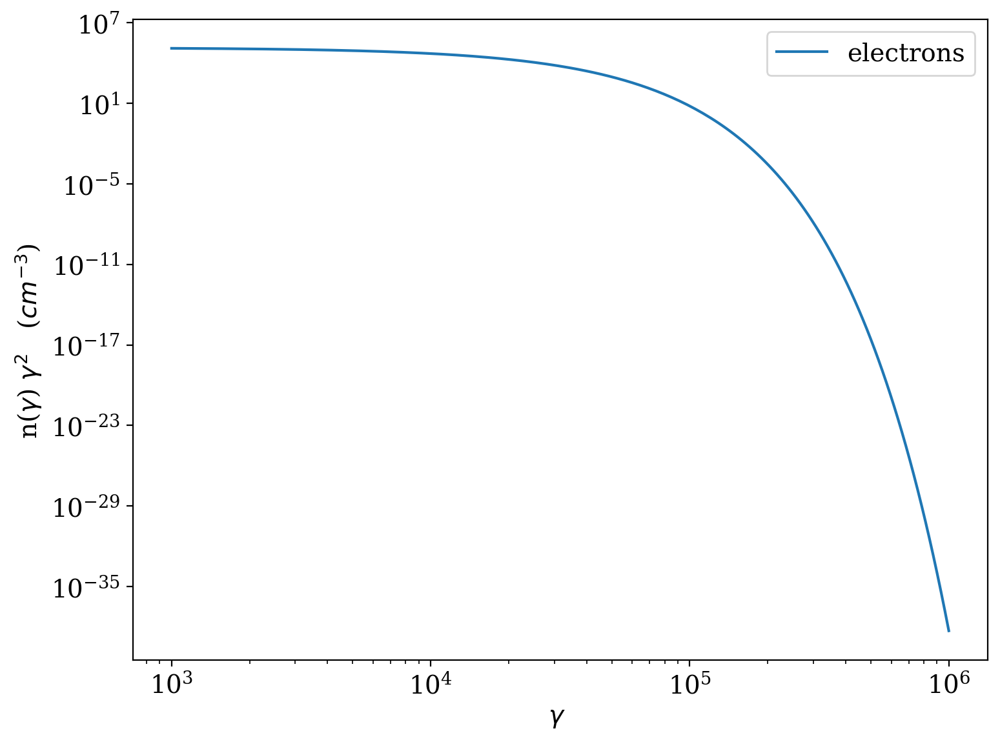

In [2]:
def pl_expcutoff_dist(gamma, p, gamma_CUT):
    return gamma**(-p) * np.exp(-gamma / gamma_CUT)
n_e_pl_expcut=EmittersDistribution('pl_expcut',spectral_type='user_defined')
n_e_pl_expcut.add_par('gamma_CUT',par_type='high-energy-cut-off',val=1e3,vmin=1., vmax=1e6, unit='lorentz-factor')
n_e_pl_expcut.add_par('p',par_type='LE_spectral_slope',val=2.3,vmin=-10., vmax=10, unit='')
n_e_pl_expcut.set_distr_func(pl_expcutoff_dist)
n_e_pl_expcut.parameters.p.val= 2
n_e_pl_expcut.parameters.gamma_CUT.val=1e4
n_e_pl_expcut.normalize=True
n_e_pl_expcut.parameters.gmax.val=1e6
n_e_pl_expcut.parameters.gmin.val=1e3
p=n_e_pl_expcut.plot2p()

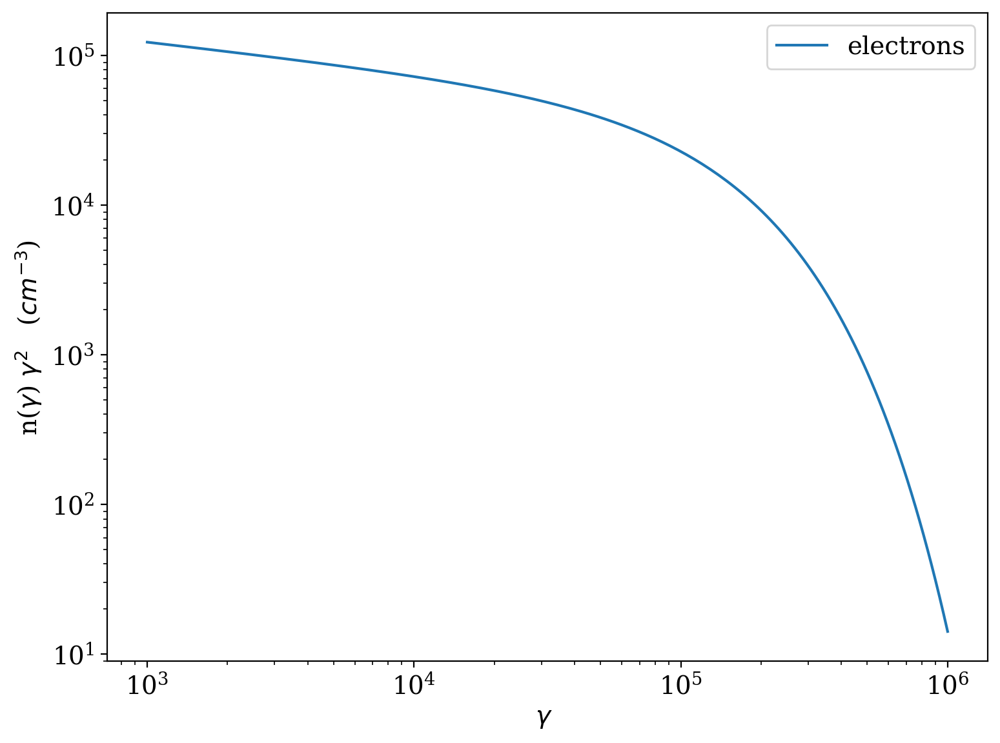

In [5]:
def pl_expcutoff_dist_compact(gamma, P, GAMMA_cut):
    return gamma**(-P) * np.exp(-gamma / GAMMA_cut)
n_e_pl_expcut_comp=EmittersDistribution('pl_expcut',spectral_type='user_defined')
n_e_pl_expcut_comp.add_par('GAMMA_cut',par_type='high-energy-cut-off',val=1e3,vmin=1., vmax=1e6, unit='lorentz-factor')
n_e_pl_expcut_comp.add_par('P',par_type='LE_spectral_slope',val=2.3,vmin=-10., vmax=10, unit='')
n_e_pl_expcut_comp.set_distr_func(pl_expcutoff_dist_compact)
n_e_pl_expcut_comp.parameters.P.val= 2.2
n_e_pl_expcut_comp.parameters.GAMMA_cut.val=1.3e5
n_e_pl_expcut_comp.normalize=True
n_e_pl_expcut_comp.parameters.gmax.val=1e6
n_e_pl_expcut_comp.parameters.gmin.val=1e3
p=n_e_pl_expcut_comp.plot2p()

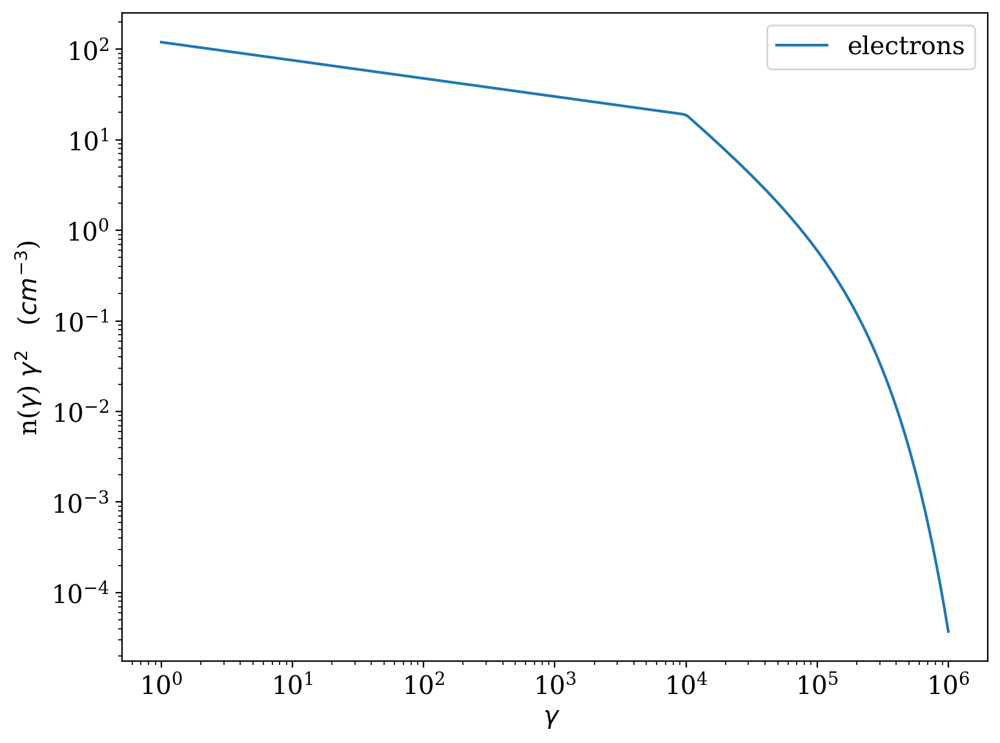

In [3]:
def bkpwl_expcutoff_dist_cond(gamma, p, p_1, gamma_br, gamma_cut):
    ne = np.zeros_like(gamma)
    below_break = gamma < gamma_br
    above_break = gamma >= gamma_br

    ne[below_break] = (gamma[below_break])**(-p)
    ne[above_break] = (gamma_br)**(p_1-p) * np.exp(gamma_br/gamma_cut) * (gamma[above_break])**(-p_1) * np.exp(-gamma[above_break]/gamma_cut)

    return ne

n_e_bkn_expcut_cond=EmittersDistribution('bkn_expcut_cond',spectral_type='user_defined')
n_e_bkn_expcut_cond.add_par('gamma_cut',par_type='high-energy-cut-off',val=1e6,vmin=1., vmax=1e9, unit='lorentz-factor')
n_e_bkn_expcut_cond.add_par('p',par_type='LE_spectral_slope',val=2.3,vmin=-10., vmax=10, unit='')
n_e_bkn_expcut_cond.add_par('p_1',par_type='HE_spectral_slope',val=3.3,vmin=-10., vmax=10, unit='')
n_e_bkn_expcut_cond.add_par('gamma_br',par_type='turn-over-energy',val=1e5,vmin=0., vmax=1e15, unit='lorentz-factor')

n_e_bkn_expcut_cond.set_distr_func(bkpwl_expcutoff_dist_cond)

n_e_bkn_expcut_cond.parameters.p.val=2.2
n_e_bkn_expcut_cond.parameters.p_1.val=3.2
n_e_bkn_expcut_cond.parameters.gamma_br.val=1e4
n_e_bkn_expcut_cond.parameters.gamma_cut.val=1.3e5
n_e_bkn_expcut_cond.normalize=True
n_e_bkn_expcut_cond.parameters.gmax.val=1e6
n_e_bkn_expcut_cond.parameters.gmin.val=1e0

p=n_e_bkn_expcut_cond.plot2p()

In [4]:
MJD_swift_xrt=np.array([60429.92016886, 60430.95138023, 60431.90237578, 60433.99252742, 60434.90061434, 60435.92343486, 60440.01963832, 60440.96556404, 60441.99787484, 60443.01454012])

## Obtaining extended zone parameters

===> setting C threads to 8
===> function already jitted


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using the one from jet FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


RuntimeError: ('for model', 'best-fit-extended-lsb', 'problem with get_model_points()', AttributeError("'NoneType' object has no attribute 'value'"))

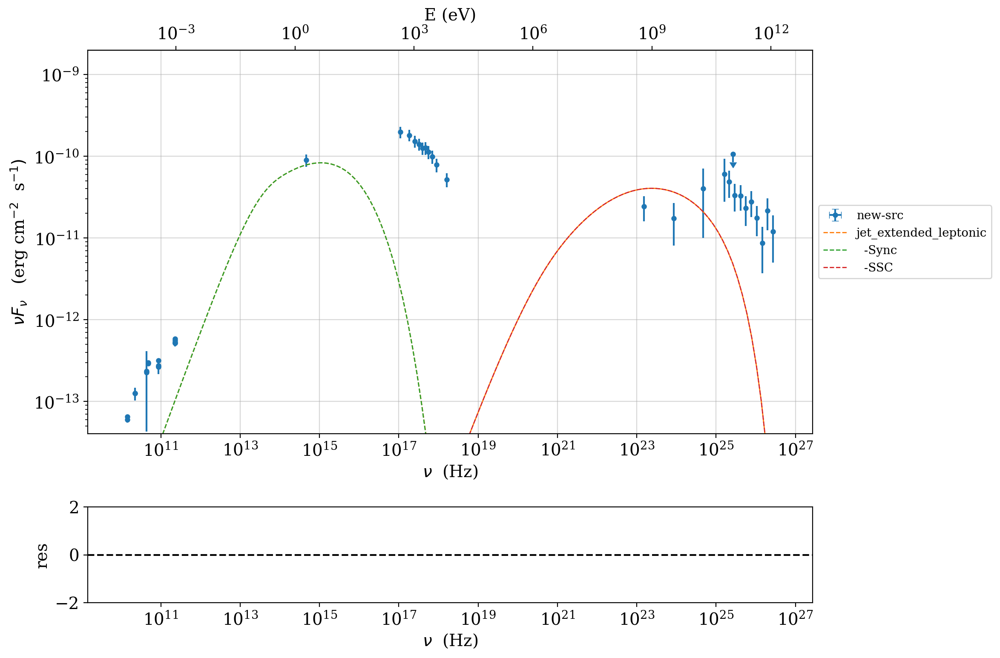

In [10]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/SED_0506.txt'
d = np.genfromtxt(file_path, delimiter = ',')
# Data filtering
index_above_radio = (d[:,0] > 5e12)
d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

# Initialize data
data = Data(n_rows=d.shape[0])
data.set_field('x', d[:,0])
data.set_field('y', d[:,2])
data.set_field('dy', value=d[:,3])
data.set_field('UL', value=d[:,3] < 0.000)
data.set_meta_data('z', 0.03)
sed_data = ObsData(data_table = data)

# Model setup
jet_extended_lsb = Jet(name='jet_extended_leptonic', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
jet_extended_lsb.set_gamma_grid_size(400)
jet_extended = FitModel(jet=jet_extended_lsb, name='best-fit-extended-lsb')
jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)



# Fixed parameters
jet_extended.jet_extended_leptonic.parameters.beam_obj.val = 25
jet_extended.freeze(jet_extended_lsb, 'beam_obj')
jet_extended.jet_extended_leptonic.parameters.z_cosm.val = 0.031
jet_extended.freeze(jet_extended_lsb, 'z_cosm')
jet_extended.jet_extended_leptonic.parameters.R.val = 1.5e16
jet_extended.freeze(jet_extended_lsb, 'R')
jet_extended.jet_extended_leptonic.parameters.gmin.val = 2e3
jet_extended.freeze(jet_extended_lsb, 'gmin')
jet_extended.jet_extended_leptonic.parameters.gmax.val = 1e6
jet_extended.freeze(jet_extended_lsb, 'gmax')
jet_extended.jet_extended_leptonic.parameters.gamma_CUT.val = 1.7e4
jet_extended.freeze(jet_extended_lsb, 'gamma_CUT')
jet_extended.freeze(jet_extended_lsb, 'p')
# Free parameters
jet_extended.jet_extended_leptonic.parameters.B.val = 0.055
#jet_extended.freeze(jet_extended_lsb, 'B')
jet_extended.jet_extended_leptonic.parameters.N.val = 1.4
#jet_extended.freeze(jet_extended_lsb, 'N')

# Fit ranges
#jet_extended.jet_extended_leptonic.parameters.gamma_CUT.fit_range = [7e3, 3e4]
#jet_extended.jet_extended_leptonic.parameters.P.fit_range = [1.8, 3.0]
#jet_extended.jet_extended_leptonic.parameters.B.fit_range = [0.01, 0.9]
#jet_extended.jet_extended_leptonic.parameters.N.fit_range = [0.01, 0.9]

#jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)
jet_extended.jet_extended_leptonic.nu_size = 200
jet_extended.jet_extended_leptonic.IC_nu_size = 200
##############################################################################
#model_minimizer_lsb = ModelMinimizer('minuit')

#best_fit_extended = model_minimizer_lsb.fit(jet_extended, sed_data, 1e13, 1e28, fitname=f'SSC-best-fit-lsb', repeat=1, silent=True, use_UL=True)

plot = jet_extended.plot_model(sed_data = sed_data)
plot.setlim(y_min=1e-14, y_max=1e-8, x_min=1e10, x_max=1e28)

===> setting C threads to 8


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using the one from jet FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


RuntimeError: ('for model', 'best-fit-extended-lsb', 'problem with get_model_points()', AttributeError("'NoneType' object has no attribute 'value'"))

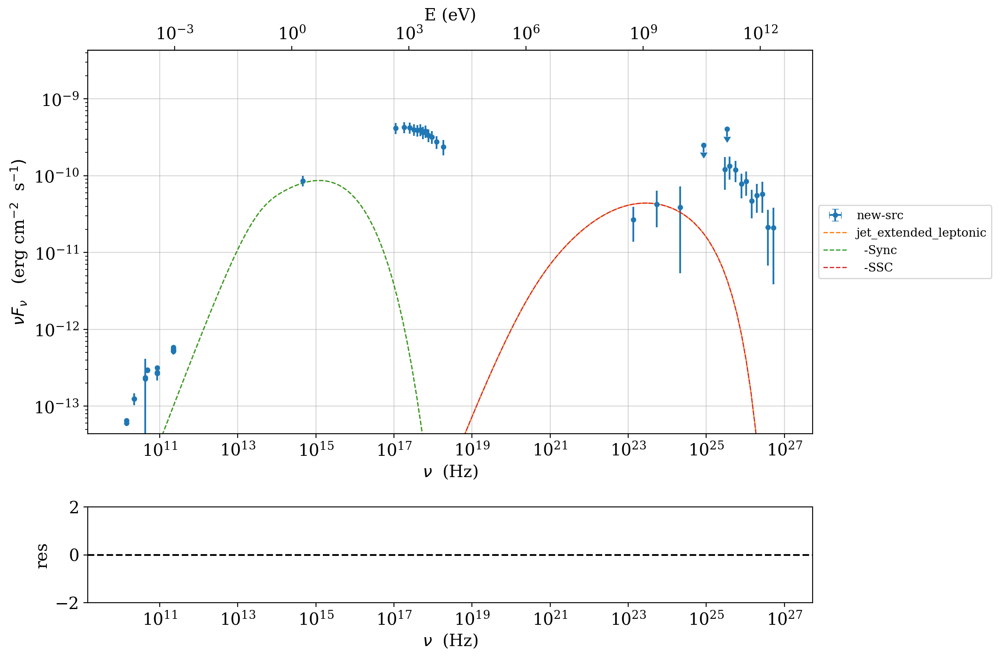

In [ ]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/SED_0512.txt'
d = np.genfromtxt(file_path, delimiter = ',')
# Data filtering
index_above_radio = (d[:,0] > 5e12)
d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

# Initialize data
data = Data(n_rows=d.shape[0])
data.set_field('x', d[:,0])
data.set_field('y', d[:,2])
data.set_field('dy', value=d[:,3])
data.set_field('UL', value=d[:,3] < 0.000)
data.set_meta_data('z', 0.03)
sed_data = ObsData(data_table = data)

# Model setup
jet_extended_lsb = Jet(name='jet_extended_leptonic', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
jet_extended_lsb.set_gamma_grid_size(400)
jet_extended = FitModel(jet=jet_extended_lsb, name='best-fit-extended-lsb')
jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)



# Fixed parameters
jet_extended.jet_extended_leptonic.parameters.beam_obj.val = 25
jet_extended.freeze(jet_extended_lsb, 'beam_obj')
jet_extended.jet_extended_leptonic.parameters.z_cosm.val = 0.031
jet_extended.freeze(jet_extended_lsb, 'z_cosm')
jet_extended.jet_extended_leptonic.parameters.R.val = 1.5e16
jet_extended.freeze(jet_extended_lsb, 'R')
jet_extended.jet_extended_leptonic.parameters.gmin.val = 2e3
jet_extended.freeze(jet_extended_lsb, 'gmin')
jet_extended.jet_extended_leptonic.parameters.gmax.val = 1e6
jet_extended.freeze(jet_extended_lsb, 'gmax')
jet_extended.jet_extended_leptonic.parameters.gamma_CUT.val = 1.8e4
jet_extended.freeze(jet_extended_lsb, 'gamma_CUT')
jet_extended.freeze(jet_extended_lsb, 'p')
# Free parameters
jet_extended.jet_extended_leptonic.parameters.B.val = 0.055
#jet_extended.freeze(jet_extended_lsb, 'B')
jet_extended.jet_extended_leptonic.parameters.N.val = 1.4
#jet_extended.freeze(jet_extended_lsb, 'N')

# Fit ranges
#jet_extended.jet_extended_leptonic.parameters.gamma_CUT.fit_range = [7e3, 3e4]
#jet_extended.jet_extended_leptonic.parameters.P.fit_range = [1.8, 3.0]
#jet_extended.jet_extended_leptonic.parameters.B.fit_range = [0.01, 0.9]
#jet_extended.jet_extended_leptonic.parameters.N.fit_range = [0.01, 0.9]

#jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)
jet_extended.jet_extended_leptonic.nu_size = 200
jet_extended.jet_extended_leptonic.IC_nu_size = 200
##############################################################################
#model_minimizer_lsb = ModelMinimizer('minuit')

#best_fit_extended = model_minimizer_lsb.fit(jet_extended, sed_data, 1e13, 1e26, fitname=f'SSC-best-fit-lsb', repeat=1, silent=True, use_UL=True)

plot = jet_extended.plot_model(sed_data = sed_data)
plot.setlim(y_min=1e-14, y_max=1e-8, x_min=1e10, x_max=1e28)

In [6]:
mrk421_average = np.loadtxt('../../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Mrk421/Mrk421_MW2009_SED.txt')
mrk421_nu = mrk421_average[:,0]
mrk421_nuFnu = mrk421_average[:,1]
mrk421_nuFnu_err = mrk421_average[:,2]

In [6]:
## Two zone model - compact zone modeled with broken power law

/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> setting C threads to 8
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


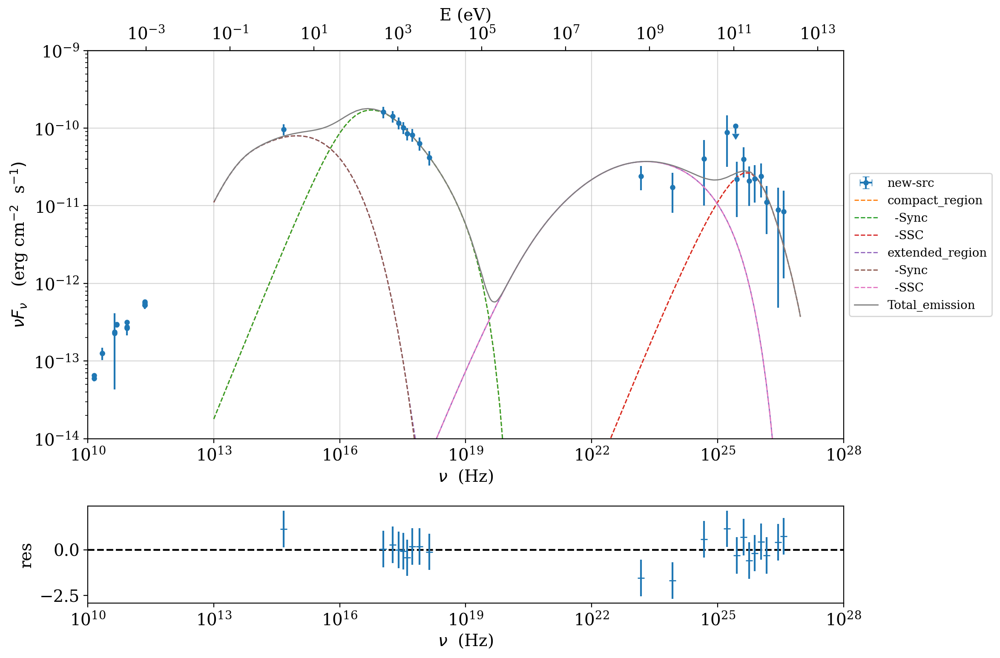

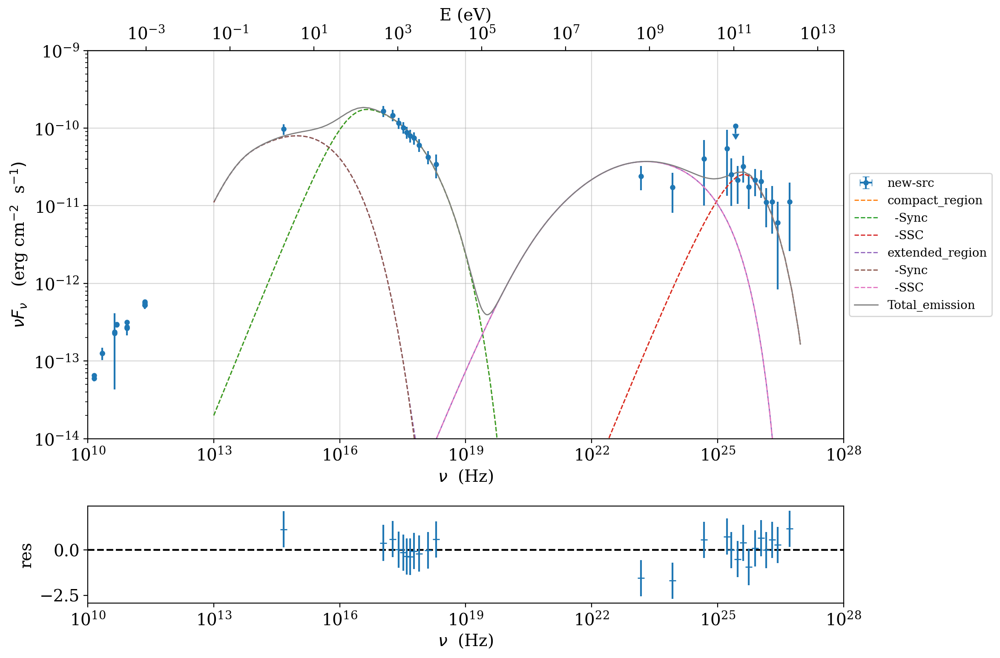

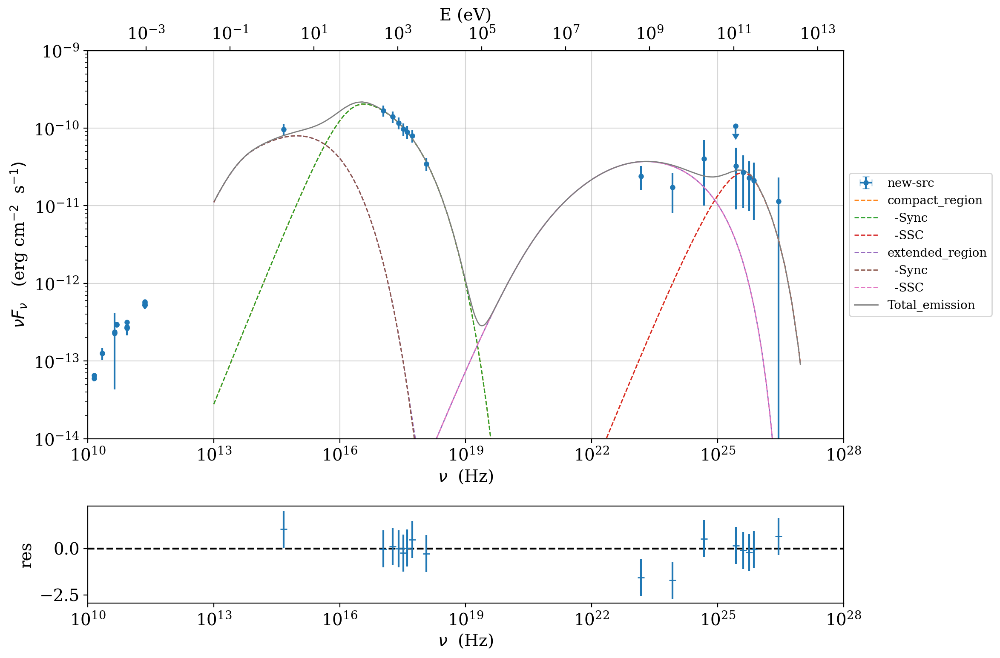

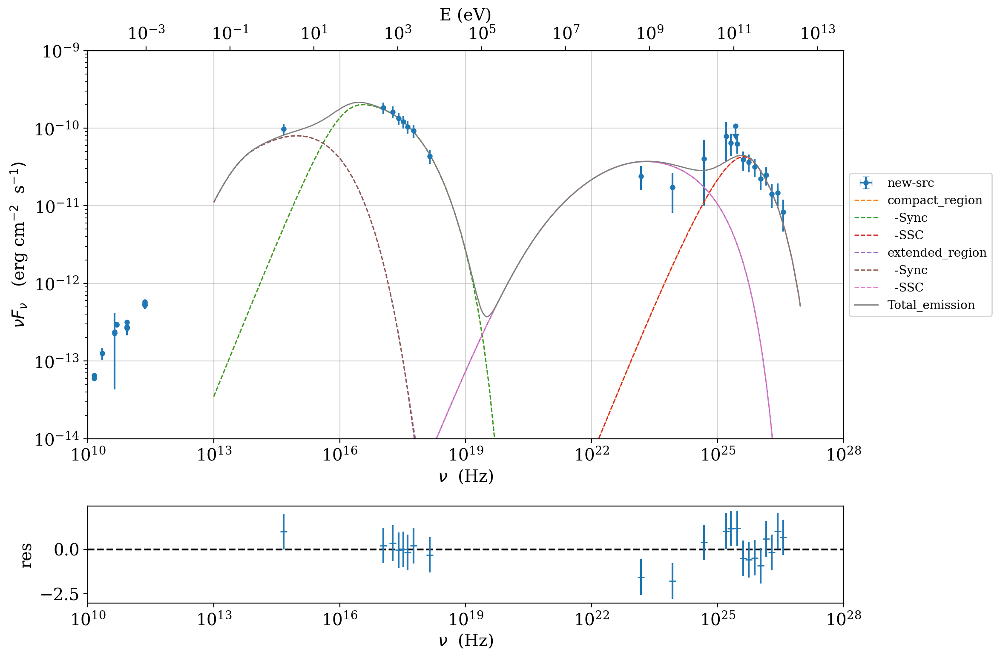

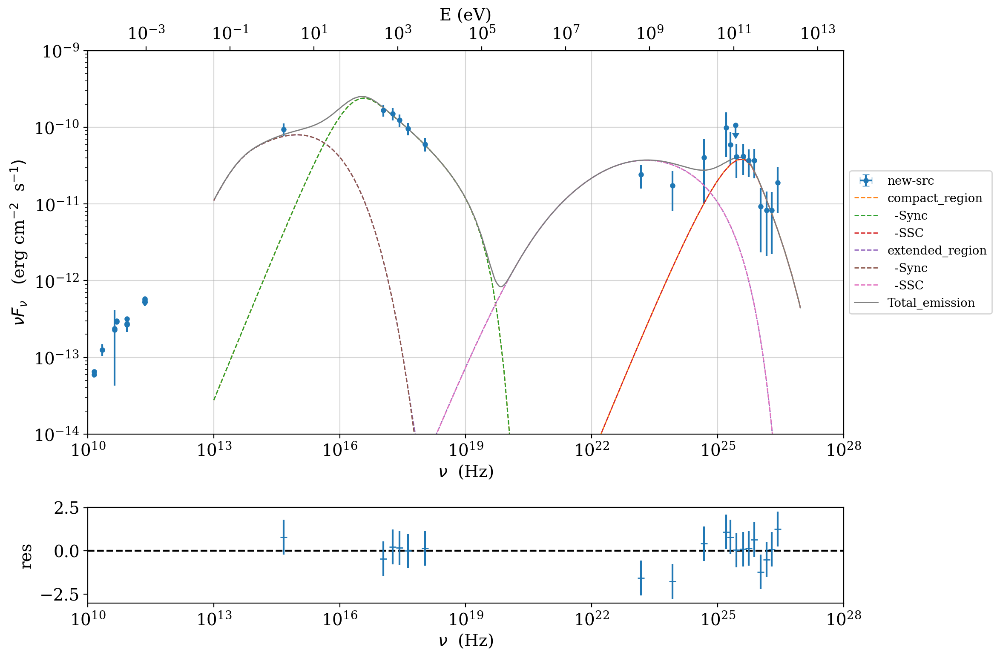

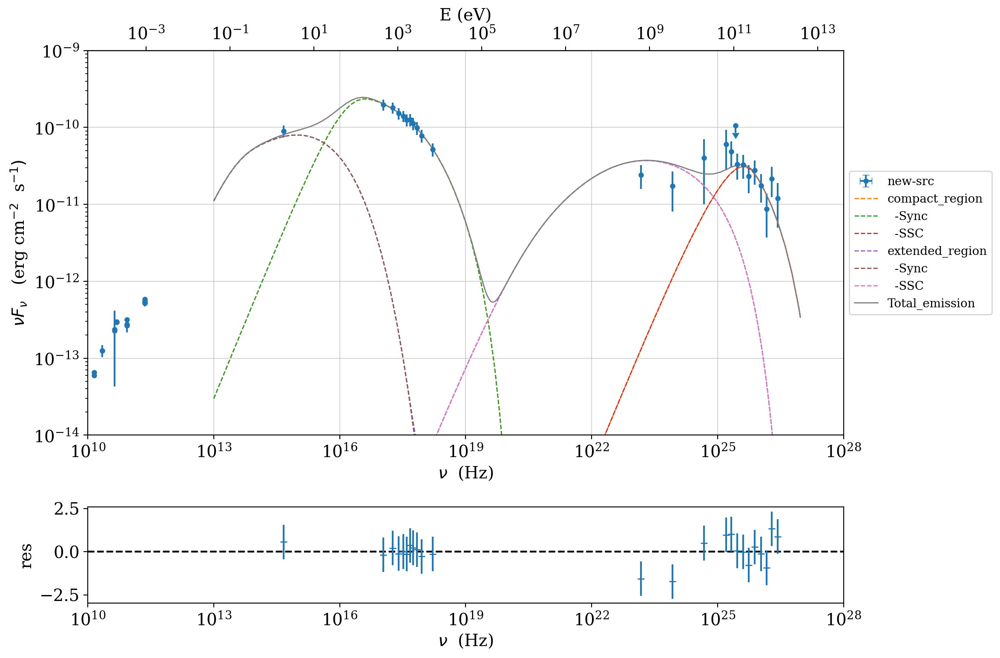

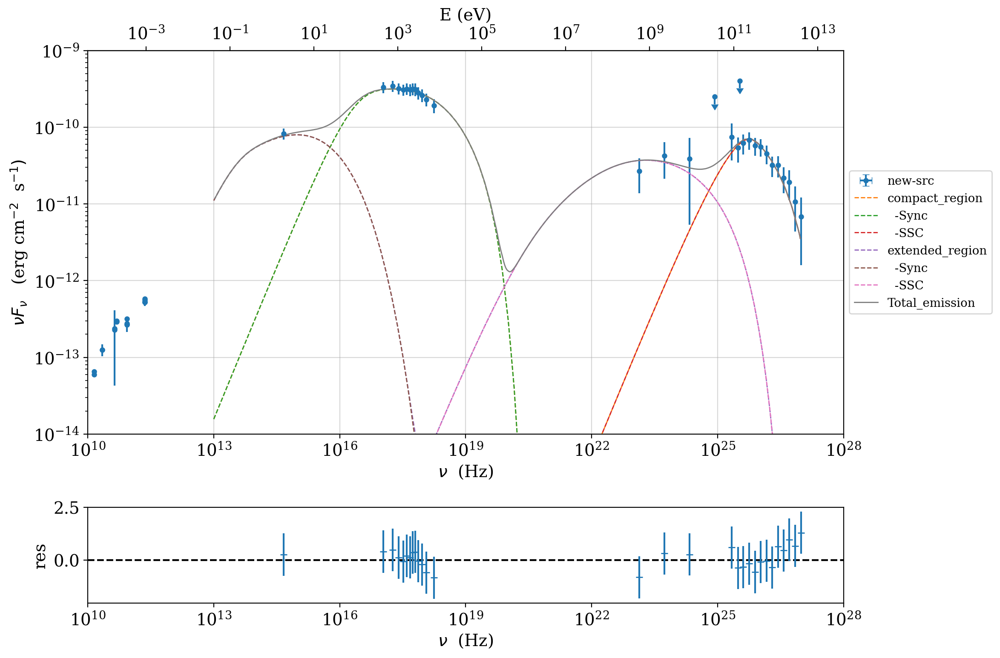

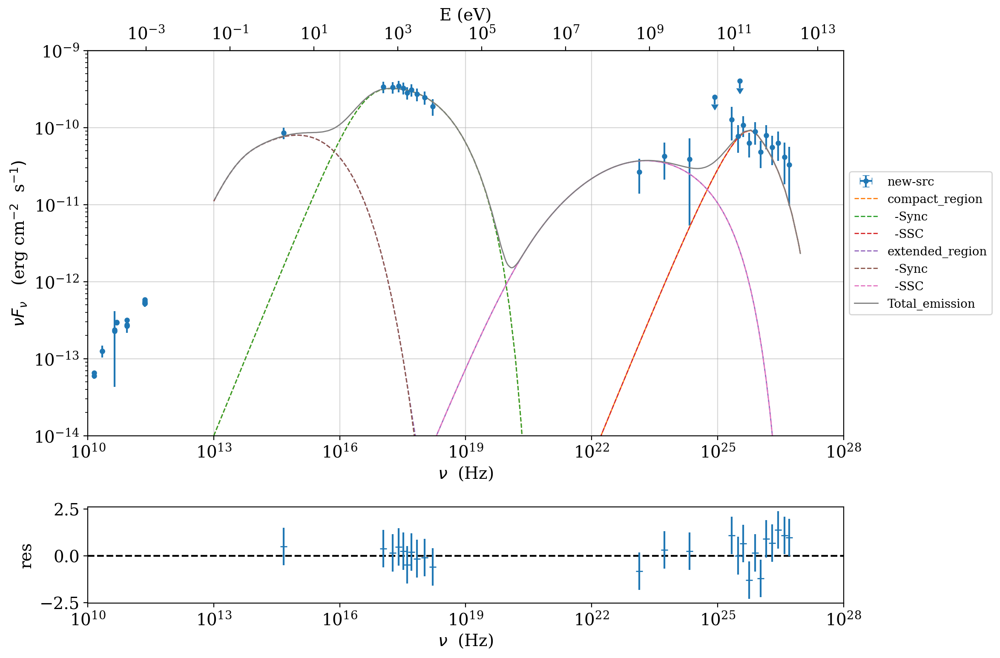

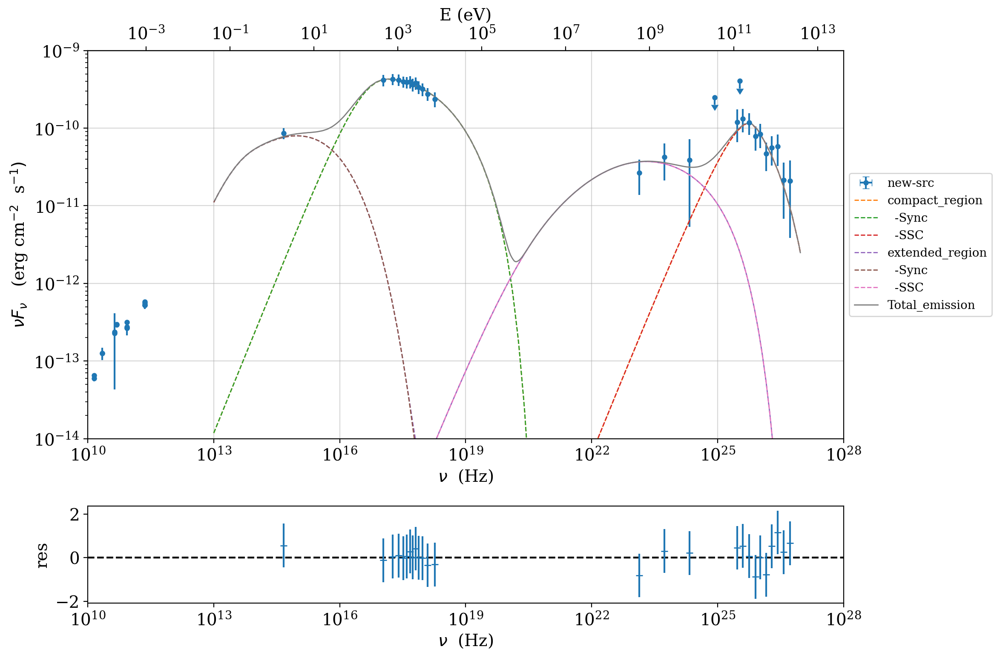

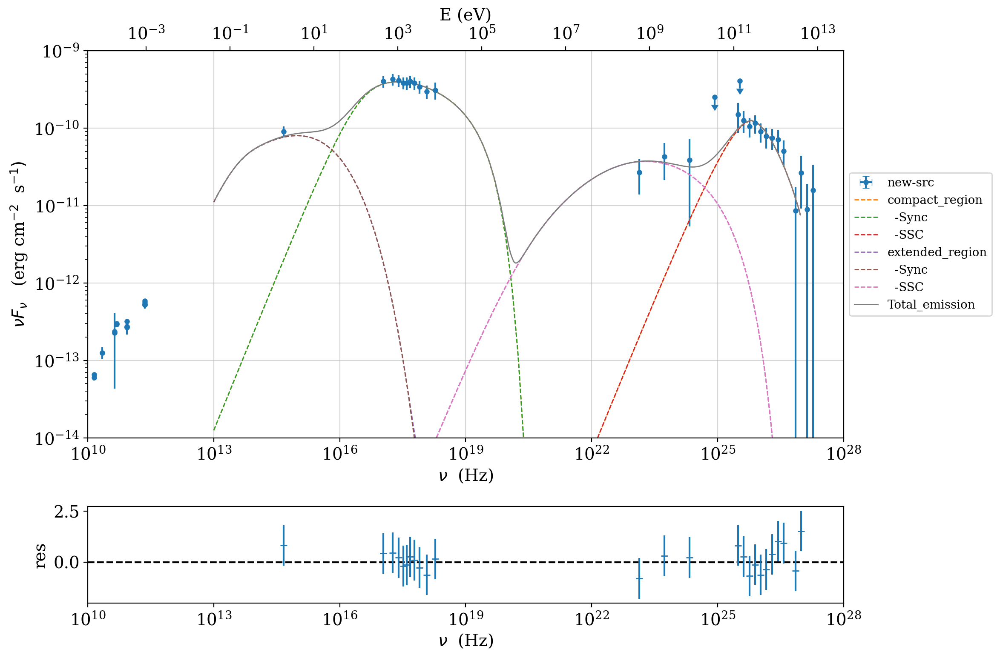

In [6]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/'
AR_compact = np.array([7.65444928e+15, 7.70430248e+15 ,1.02039892e+16 ,1.06131062e+16,
 7.68919923e+15 ,1.02261059e+16, 4.13351465e+15, 2.21562977e+15, 2.20329644e+15 ,2.61209673e+15])
all_txt_files = []
best_fit_results = {}
SED_data = {}
Ap_compact_val = []
Ap1_compact_val = []
AB_compact_val = []
AN_compact_val = []
AB_extended_val = []
AN_extended_val = []
Agamma_CUT_extended_val = []
Agamma_br_compact_val = []
Agamma_cut_compact_val = []
Achisq_red = []
Adof = []
# errors
Ap_compact_val_err = []
Ap1_compact_val_err = []
AB_compact_val_err = []
AN_compact_val_err = []
AB_extended_val_err = []
AN_extended_val_err = []
Agamma_br_compact_err_val = []
Agamma_CUT_extended_err_val =[]
Agamma_cut_compact_err_val = []

for f in os.listdir(file_path):
    if f.endswith('.txt'):
        all_txt_files.append(f)

for f_name, R_compact_val in zip(all_txt_files, AR_compact):
    int_id = f_name.replace('.txt', '')
    
    file = os.path.join(file_path, f_name)
    d = np.genfromtxt(file, delimiter = ',')
    # Data filtering
    index_above_radio = (d[:,0] > 5e12)
    d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

    # Initialize data
    data = Data(n_rows=d.shape[0])
    data.set_field('x', d[:,0])
    data.set_field('y', d[:,2])
    data.set_field('dy', value=d[:,3])
    data.set_field('UL', value=d[:,3] < 0.000)
    data.set_meta_data('z', 0.03)
    sed_data = ObsData(data_table = data)

    # Model setup
    Total_emission = FitModel(nu_size = 500, name='Total_emission')


    #Defining extended region 
    jet_extended_lsb = Jet(name='extended_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
    jet_extended_lsb.set_gamma_grid_size(400)
    jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)
    #defining compact region
    jet_core_lsb = Jet(name='compact_region', emitters_type='electrons', emitters_distribution=n_e_bkn_expcut_cond)
    jet_core_lsb.set_gamma_grid_size(400)
    #jet_core_lsb.set_N_from_nuFnu(nuFnu_obs=1.2407E-10,nu_obs=2.6378E17)
    ########################################3
    # Adding components to the composite jet
    Total_emission.add_component(jet_core_lsb)
    Total_emission.add_component(jet_extended_lsb)
    Total_emission.composite_expr='extended_region+compact_region'

    # Fixed parameters
    Total_emission.extended_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_extended_lsb, 'beam_obj')
    Total_emission.extended_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_extended_lsb, 'z_cosm')
    Total_emission.extended_region.parameters.R.val = 1.5e16
    Total_emission.freeze(jet_extended_lsb, 'R')
    Total_emission.extended_region.parameters.gmin.val = 2e3
    Total_emission.freeze(jet_extended_lsb, 'gmin')
    Total_emission.freeze(jet_extended_lsb, 'gmax')
    Total_emission.freeze(jet_extended_lsb, 'p')
    Total_emission.extended_region.parameters.B.val = 0.055
    Total_emission.freeze(jet_extended_lsb, 'B')
    Total_emission.extended_region.parameters.N.val = 1.4
    Total_emission.freeze(jet_extended_lsb, 'N')
    Total_emission.extended_region.parameters.gamma_CUT.val = 1.6e4
    Total_emission.freeze(jet_extended_lsb, 'gamma_CUT')

    # Free parameters
    #Total_emission.extended_region.parameters.B.val = 0.035

    # Fit ranges
    #fit_model_lsb.jet_leptonic.parameters.gamma_break.fit_range = [1e4, 1e6]
    #Total_emission.extended_region.parameters.p.fit_range = [2.2, 2.8]
    #Total_emission.extended_region.parameters.gamma_cut.fit_range = [1e4, 7e4]
    #Total_emission.extended_region.parameters.B.fit_range = [0.03, 0.1]


    Total_emission.extended_region.nu_size = 200
    Total_emission.extended_region.IC_nu_size = 200
    ##############################################################################


    # Fixed parameters
    Total_emission.compact_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_core_lsb, 'beam_obj')
    Total_emission.compact_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_core_lsb, 'z_cosm')
    Total_emission.compact_region.parameters.R.val = R_compact_val
    Total_emission.freeze(jet_core_lsb, 'R')
    Total_emission.compact_region.parameters.gmin.val = 3e4
    Total_emission.freeze(jet_core_lsb, 'gmin')
    Total_emission.compact_region.parameters.gamma_cut.val = 1.45e5
    #Total_emission.freeze(jet_core_lsb, 'gamma_cut')
    Total_emission.compact_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_core_lsb, 'gmax')
    #Total_emission.compact_region.parameters.p.val = 3.2
    #Total_emission.freeze(jet_core_lsb, 'p_1')
    # Free parameters
    Total_emission.compact_region.parameters.B.val = 0.034
    Total_emission.compact_region.parameters.N.val = 0.024


    # Fit ranges
    Total_emission.compact_region.parameters.gamma_br.fit_range = [1e4, 8e4]
    Total_emission.compact_region.parameters.gamma_cut.fit_range = [1e5, 8e5]
    Total_emission.compact_region.parameters.p.fit_range = [1.5, 2.8]
    Total_emission.compact_region.parameters.p_1.fit_range = [2.5, 3.8]
    Total_emission.compact_region.parameters.B.fit_range = [0.01, 0.5]
    Total_emission.compact_region.parameters.N.fit_range = [0.01, 0.5]

    # Frequency range and fitting
    Total_emission.compact_region.set_IC_nu_size = 200
    Total_emission.compact_region.set_nu_size = 200
    #Total_emission.compact_region.set_nu_grid_size = 400
    ############################################################

    model_minimizer_lsb = ModelMinimizer('minuit')

    best_fit = model_minimizer_lsb.fit(Total_emission, sed_data, 1e13, 1e27, fitname=f'SSC-best-fit-lsb', repeat=2, silent=True, use_UL=True)
    
    ###############################################################################################
    

    p_compact_val_current = best_fit.parameters.get_val(par_name='p', model_name='compact_region')
    p_compact_val_err_current = Total_emission.compact_region.parameters.p.best_fit_err

    p1_compact_val_current = best_fit.parameters.get_val(par_name='p_1', model_name='compact_region')
    p1_compact_val_err_current = Total_emission.compact_region.parameters.p_1.best_fit_err

    B_compact_val_current = best_fit.parameters.get_val(par_name='B', model_name='compact_region')
    B_compact_val_err_current = Total_emission.compact_region.parameters.B.best_fit_err

    N_compact_val_current = best_fit.parameters.get_val(par_name='N', model_name='compact_region')
    N_compact_val_err_current = Total_emission.compact_region.parameters.N.best_fit_err

    B_extended_val_current = best_fit.parameters.get_val(par_name='B', model_name='extended_region')
    #B_extended_val_err_current = Total_emission.extended_region.parameters.B.best_fit_err

    N_extended_val_current = best_fit.parameters.get_val(par_name='N', model_name='extended_region')
    #N_extended_val_err_current = Total_emission.extended_region.parameters.N.best_fit_err

    gamma_br_compact_val_current = best_fit.parameters.get_val(par_name='gamma_br', model_name='compact_region')
    gamma_br_compact_val_err_current = Total_emission.compact_region.parameters.gamma_br.best_fit_err

    gamma_CUT_extended_val_current = best_fit.parameters.get_val(par_name='gamma_CUT', model_name='extended_region')
    #gamma_CUT_extended_val_err_current = Total_emission.extended_region.parameters.gamma_CUT.best_fit_err

    gamma_cut_compact_val_current = best_fit.parameters.get_val(par_name='gamma_cut', model_name='compact_region')
    gamma_cut_compact_val_err_current = Total_emission.compact_region.parameters.gamma_cut.best_fit_err

    chi_val_current = best_fit.chisq_red
    dof_val_current = best_fit.dof_no_UL

    # Store values
    Ap_compact_val.append(p_compact_val_current)
    Ap_compact_val_err.append(p_compact_val_err_current)
    Ap1_compact_val.append(p1_compact_val_current)
    Ap1_compact_val_err.append(p1_compact_val_err_current)
    AB_compact_val.append(B_compact_val_current)
    AB_compact_val_err.append(B_compact_val_err_current)
    AN_compact_val.append(N_compact_val_current)
    AN_compact_val_err.append(N_compact_val_err_current)
    Agamma_br_compact_val.append(gamma_br_compact_val_current)
    Agamma_br_compact_err_val.append(gamma_br_compact_val_err_current)
    Agamma_cut_compact_val.append(gamma_cut_compact_val_current)
    Agamma_cut_compact_err_val.append(gamma_cut_compact_val_err_current)
    Agamma_CUT_extended_val.append(gamma_CUT_extended_val_current)
    #gamma_CUT_extended_err_val.append(gamma_CUT_extended_val_err_current)
    Achisq_red.append(chi_val_current)
    Adof.append(dof_val_current)

    ################################
    annotation = (
        fr"$\chi^2_{{\mathit{{red}}}} / \mathit{{dof}} = {chi_val_current:.3f} / {dof_val_current}$" + "\n" +
        fr"Compact zone free Parameters" + "\n" +
        fr"$B = {B_compact_val_current:.3f} \pm {B_compact_val_err_current:.3f}~\mathrm{{G}}$" + "\n" +
        fr"$N = {N_compact_val_current:.3f} \pm {N_compact_val_err_current:.3f}~\mathrm{{cm^{{-3}}}}$" + "\n" +
        fr"$p = {p_compact_val_current:.3f} \pm {p_compact_val_err_current:.3f}$" + "\n" +
        fr"$p_1 = {p1_compact_val_current:.3f} \pm {p1_compact_val_err_current:.3f}$" + "\n" +
        fr"$\gamma_{{br}} = {gamma_br_compact_val_current:.3e} \pm {gamma_br_compact_val_err_current:.3e}$".replace("e+0", "e").replace("e+", "e") + "\n" +
        fr"$\gamma_{{cut}} = {gamma_cut_compact_val_current:.3e} \pm {gamma_cut_compact_val_err_current:.3e}$".replace("e+0", "e").replace("e+", "e") + "\n" +
        fr"Extended zone fixed Parameters" + "\n" +
        fr"$B = {B_extended_val_current:.3f}~\mathrm{{G}}$" + "\n" +
        fr"$N = {N_extended_val_current:.3f}~\mathrm{{cm^{{-3}}}}$" + "\n" +
        fr"$\gamma_{{cut}} = {gamma_CUT_extended_val_current:.3e}$"
    )

    plot = Total_emission.plot_model(sed_data = sed_data)
    plot.setlim(y_min=1e-14, y_max=1e-9, x_min=1e10, x_max=1e28)
    #plot.add_xy_plot([], [],label = annotation)
    plot.save(f"{int_id}_two_zone_model_all_free.png")

In [7]:
Agamma_cut_compact_val = np.array(Agamma_cut_compact_val)/1e5
Agamma_cut_compact_err_val = np.array(Agamma_cut_compact_err_val)/1e5
Agamma_br_compact_val = np.array(Agamma_br_compact_val)/1e4
Agamma_br_compact_err_val = np.array(Agamma_br_compact_err_val)/1e4

In [8]:
print(Ap_compact_val)
print(Ap_compact_val_err)
print(Ap1_compact_val)
print(Ap1_compact_val_err)
print(AN_compact_val)
print(AN_compact_val_err)
print(AB_compact_val)
print(AB_compact_val_err)
print(Agamma_br_compact_err_val)
print(Agamma_br_compact_val)
print(Agamma_cut_compact_val)
print(Agamma_cut_compact_err_val)


[2.320025853082503, 1.6122652711356327, 1.5082111295139675, 2.161817324809374, 2.0019508344273245, 2.520170515538049, 1.6012436755807506, 2.5650001444129327, 1.8284103981274828, 2.360859006508135]
[0.8872083912409572, 0.864735791478911, 1.1958598839778691, 0.9538405798894858, 0.7105477923443191, 1.118675178087843, 0.880169992243977, 0.6760985727652897, 0.867188265680541, 1.0745914900345337]
[3.606541989327548, 2.6983439504392788, 2.6734721443062543, 2.6115419506065978, 3.776316052716498, 2.9261075107105285, 2.5000000110682747, 2.500003346927471, 2.8132465722847146, 2.901689729592862]
[0.7219493342230852, 0.7111734430332277, 0.3178724271544011, 0.6518786788162239, 1.0004920434722298, 2.1310206708147206e-05, 0.8127814795182435, 1.1338867328341784, 0.7832511757652492, 0.6929425475379707]
[0.03920380329725703, 0.03807990610499039, 0.024366513164117542, 0.03308875234571079, 0.04596673015429919, 0.025203720007361624, 0.15400537607652678, 0.4732943652678379, 0.4938479710068533, 0.426689641164

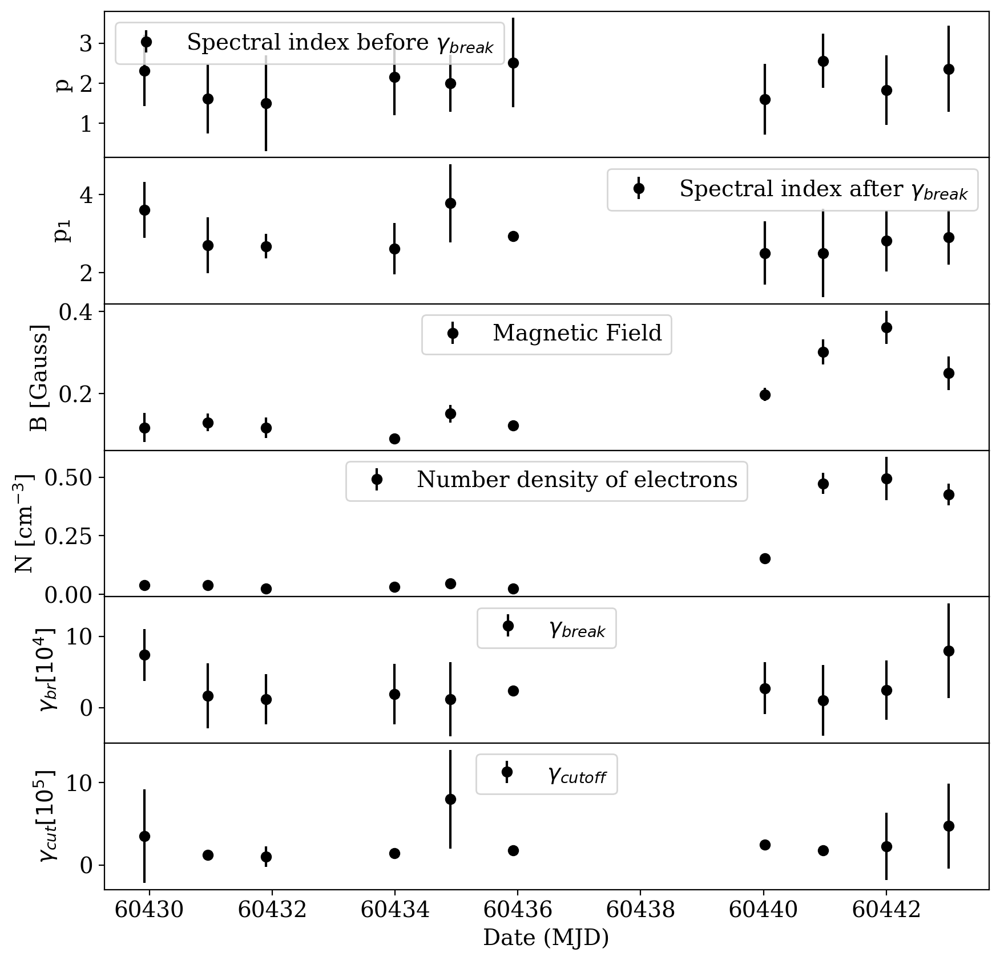

In [9]:
fig, axs = plt.subplots(6,1, figsize = (10,10), sharex = True)
fig.subplots_adjust(hspace=0.00)
axs[0].errorbar(MJD_swift_xrt, Ap_compact_val, yerr = Ap_compact_val_err, fmt = 'o', color = 'black', label = 'Spectral index before $\gamma_{break}$')
axs[0].set_ylabel(r'p')
axs[0].legend(loc = 'best')
axs[1].errorbar(MJD_swift_xrt, Ap1_compact_val, yerr = Ap1_compact_val_err, fmt = 'o', color = 'black', label = 'Spectral index after $\gamma_{break}$')
axs[1].set_ylabel(r'p$_1$')
axs[1].legend(loc ='best')
axs[2].errorbar(MJD_swift_xrt, AB_compact_val, yerr = AB_compact_val_err, fmt = 'o', color = 'black', label = 'Magnetic Field')
axs[2].set_ylabel(r'B [Gauss]')
axs[2].legend(loc = 'upper center')
axs[3].errorbar(MJD_swift_xrt, AN_compact_val, yerr = AN_compact_val_err, fmt = 'o', color = 'black', label = 'Number density of electrons')
axs[3].set_ylabel(r'N [cm$^{-3}$]')
axs[3].legend(loc = 'upper center')
axs[4].errorbar(MJD_swift_xrt, Agamma_br_compact_val, yerr = Agamma_br_compact_err_val, fmt = 'o', color = 'black', label = '$\gamma_{break}$')
axs[4].set_ylabel(r'$\gamma_{br} [10^4]$')
axs[4].legend(loc = 'upper center')
axs[5].errorbar(MJD_swift_xrt, Agamma_cut_compact_val, yerr = Agamma_cut_compact_err_val, fmt = 'o', color = 'black', label = '$\gamma_{cutoff}$')
axs[5].set_ylabel(r'$\gamma_{cut} [10^5]$')
axs[5].set_xlabel(r'Date (MJD)')
axs[5].legend(loc = 'upper center')

plt.savefig('two_zone_bkn_compact_zone.png')

## Two zone model - compact zone modeled with power law with exponential cutoff

/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad


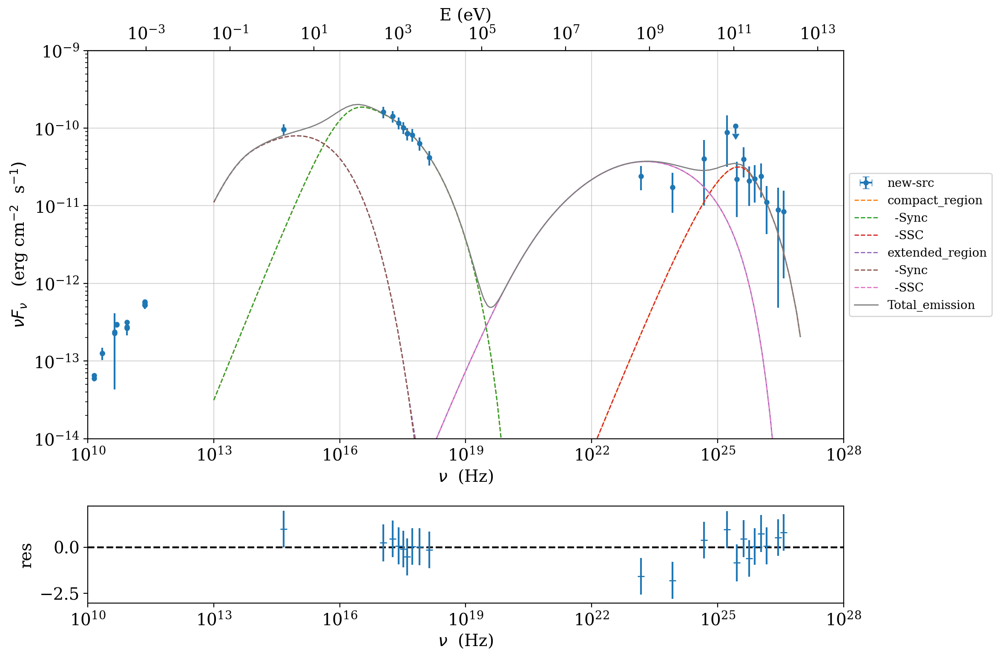

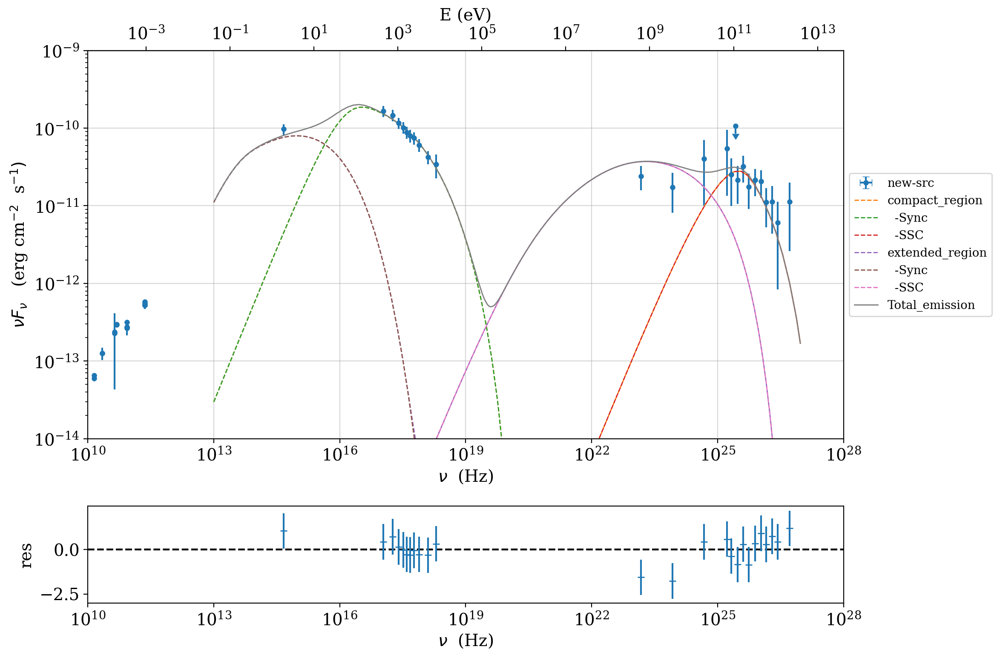

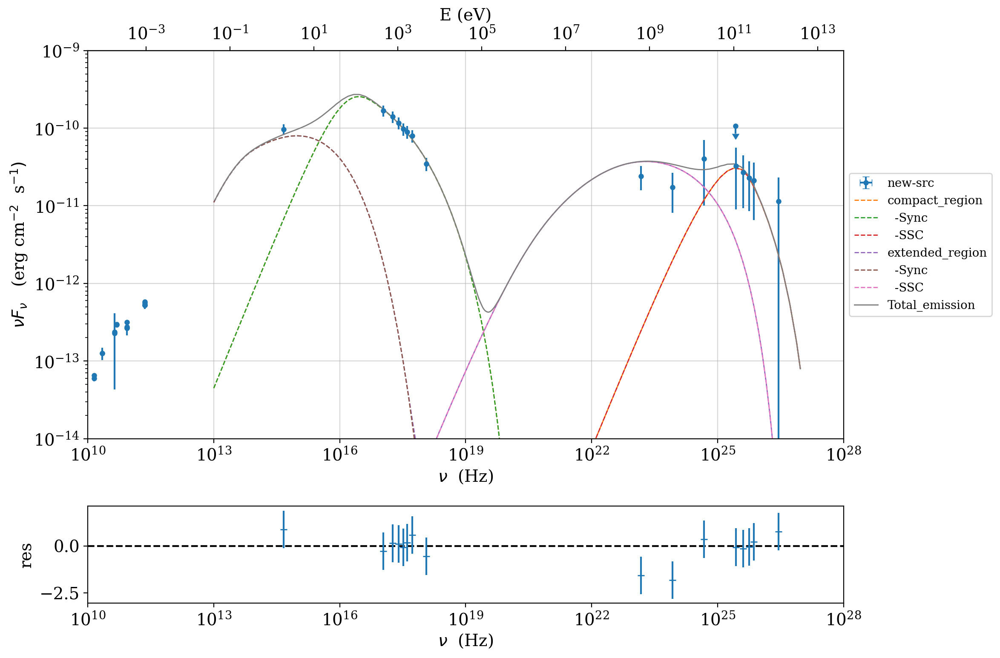

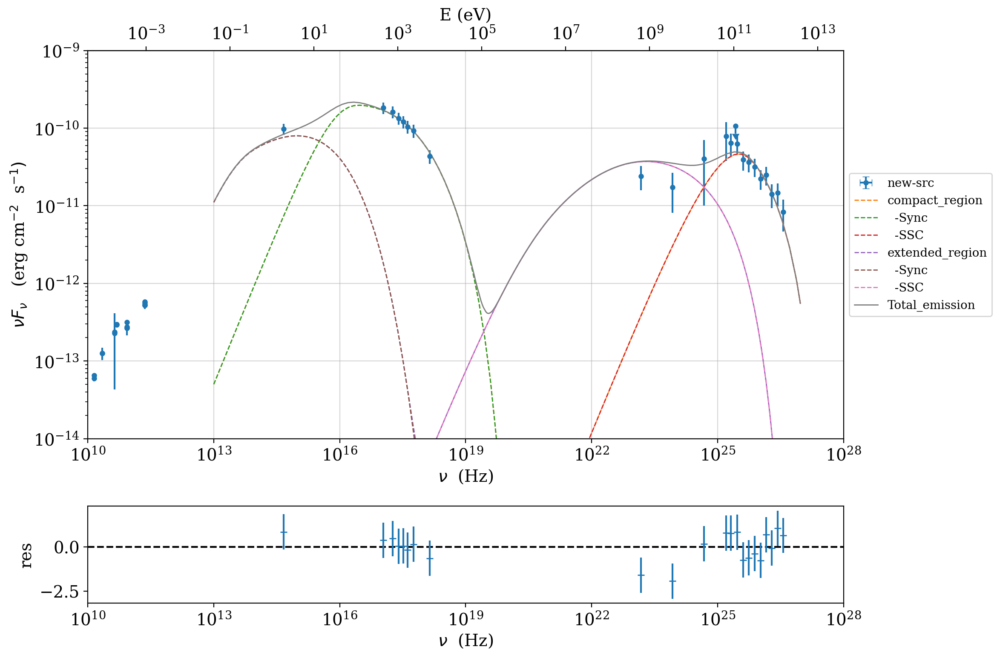

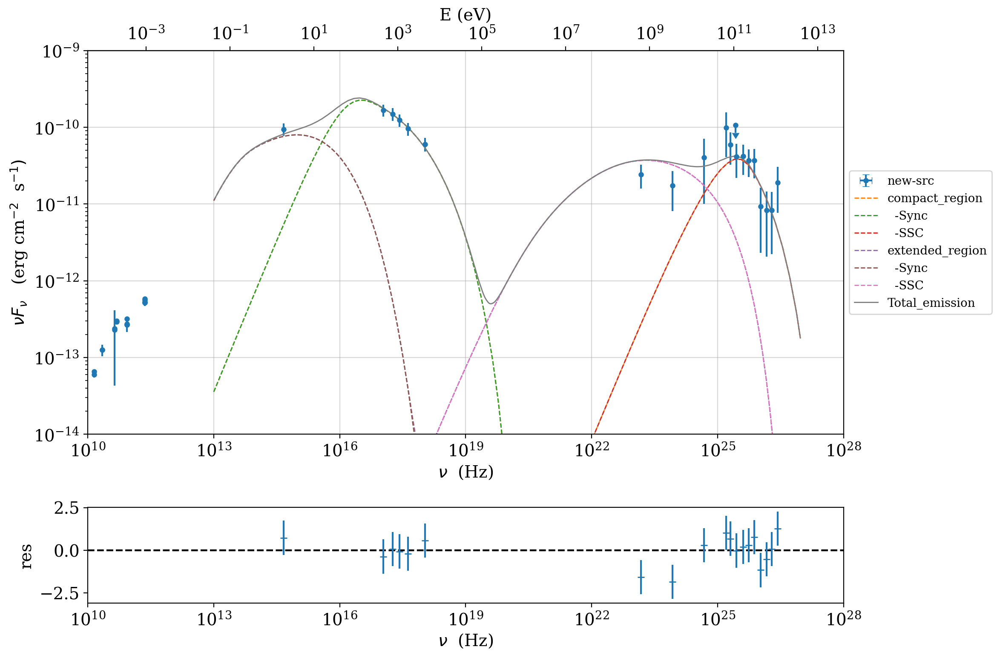

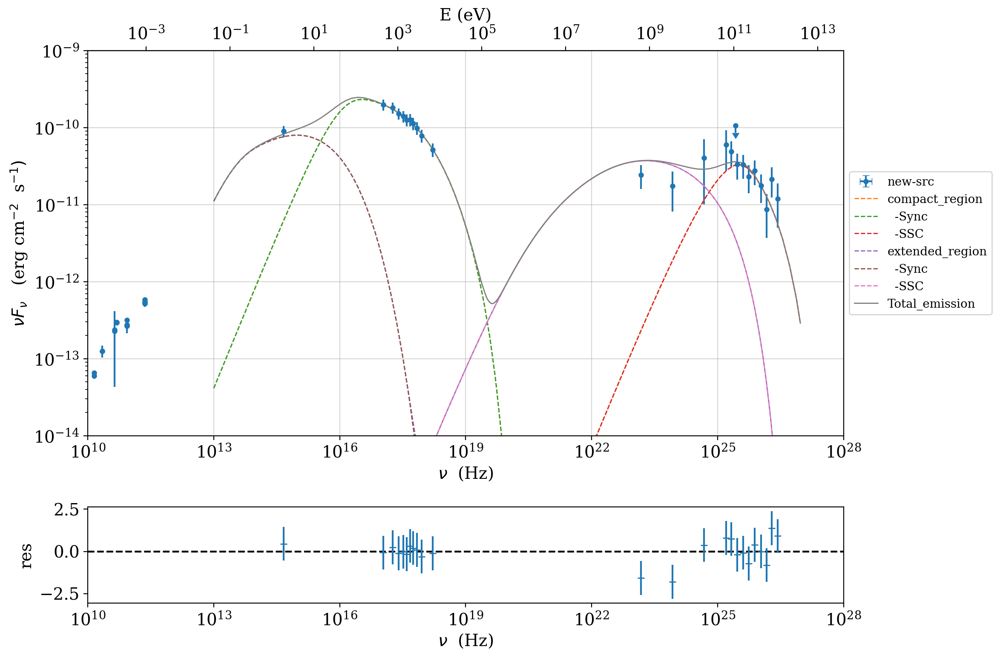

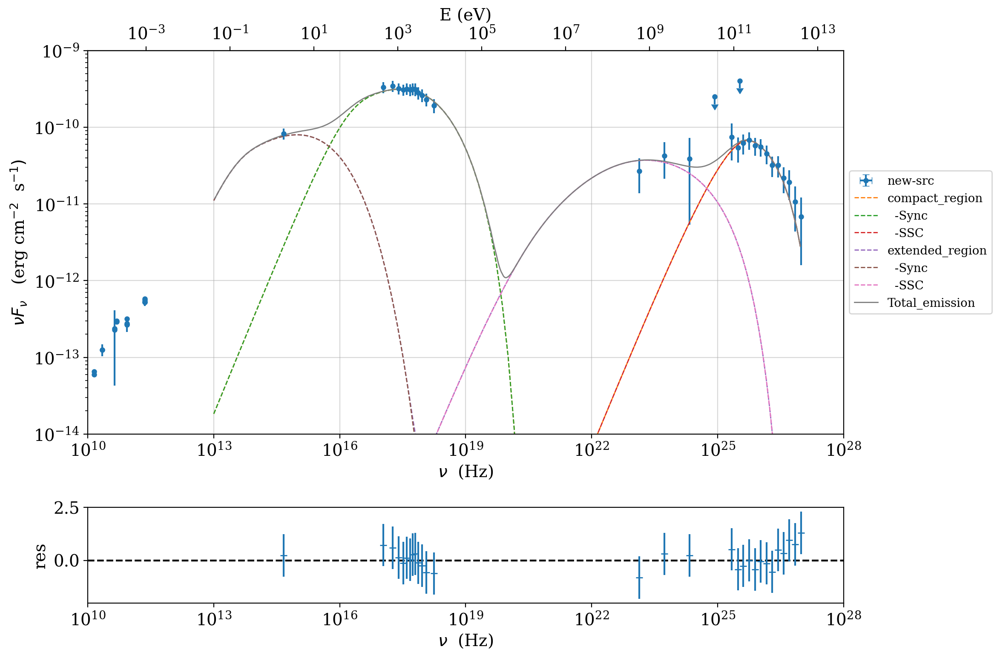

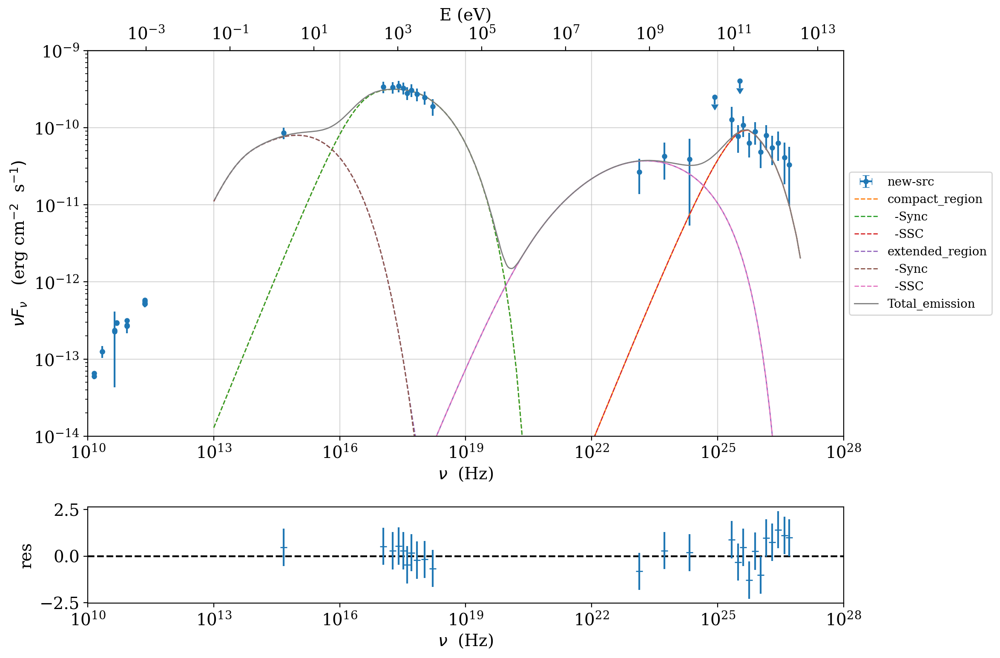

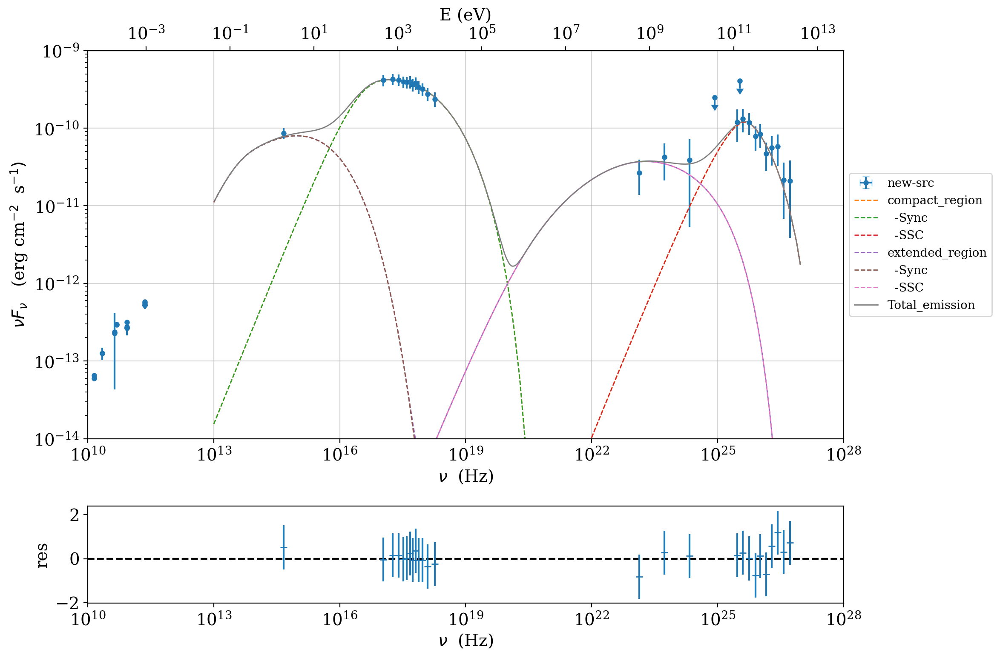

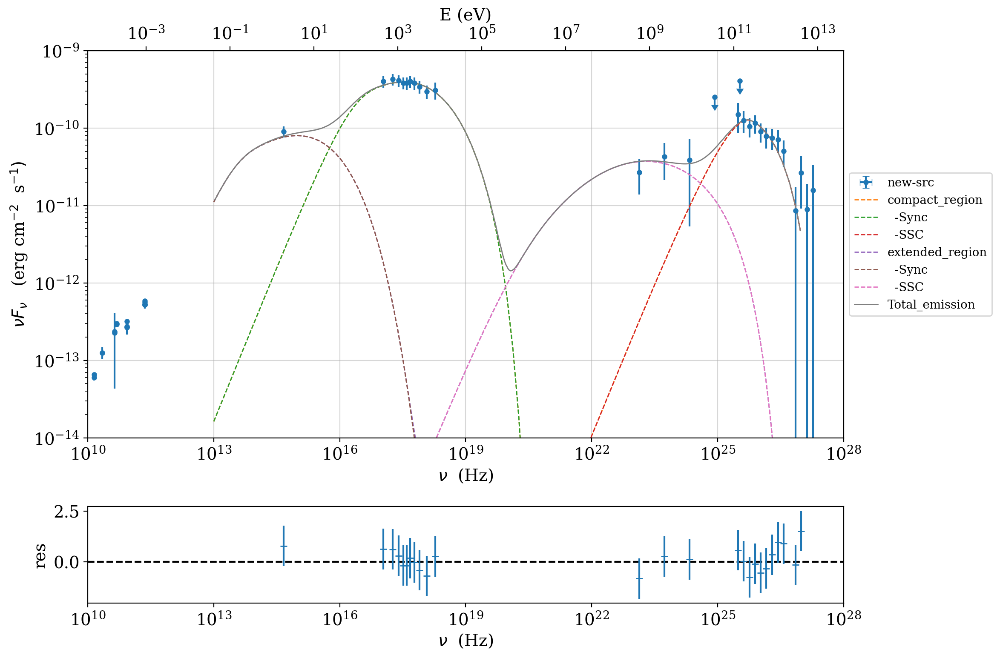

In [10]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/'
zR_compact = np.array([7.65444928e+15, 7.70430248e+15 ,1.02039892e+16 ,1.06131062e+16,
 7.68919923e+15 ,1.02261059e+16, 4.13351465e+15, 2.21562977e+15,
 2.20329644e+15 ,2.61209673e+15])
all_txt_files = []
best_fit_results = {}
SED_data = {}
zp_compact_val = []
zB_compact_val = []
zN_compact_val = []
zB_extended_val = []
zN_extended_val = []
zgamma_CUT_extended_val = []
zgamma_cut_compact_val = []
zchisq_red = []
zdof = []
# errors
zp_compact_val_err = []
zB_compact_val_err = []
zN_compact_val_err = []
zB_extended_val_err = []
zN_extended_val_err = []
zgamma_CUT_extended_err_val =[]
zgamma_cut_compact_err_val = []

for f in os.listdir(file_path):
    if f.endswith('.txt'):
        all_txt_files.append(f)

for f_name, R_compact_val in zip(all_txt_files, zR_compact):
    int_id = f_name.replace('.txt', '')
    
    file = os.path.join(file_path, f_name)
    d = np.genfromtxt(file, delimiter = ',')
    # Data filtering
    index_above_radio = (d[:,0] > 5e12)
    d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

    # Initialize data
    data = Data(n_rows=d.shape[0])
    data.set_field('x', d[:,0])
    data.set_field('y', d[:,2])
    data.set_field('dy', value=d[:,3])
    data.set_field('UL', value=d[:,3] < 0.000)
    data.set_meta_data('z', 0.03)
    sed_data = ObsData(data_table = data)

    # Model setup
    Total_emission = FitModel(nu_size = 500, name='Total_emission')


    #Defining extended region 
    jet_extended_lsb = Jet(name='extended_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
    jet_extended_lsb.set_gamma_grid_size(400)
    jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)
    #defining compact region
    jet_core_lsb = Jet(name='compact_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut_comp)
    jet_core_lsb.set_gamma_grid_size(400)
    ########################################3
    # Adding components to the composite jet
    Total_emission.add_component(jet_core_lsb)
    Total_emission.add_component(jet_extended_lsb)
    Total_emission.composite_expr='extended_region+compact_region'

    # Fixed parameters
    Total_emission.extended_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_extended_lsb, 'beam_obj')
    Total_emission.extended_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_extended_lsb, 'z_cosm')
    Total_emission.extended_region.parameters.R.val = 1.5e16
    Total_emission.freeze(jet_extended_lsb, 'R')
    Total_emission.extended_region.parameters.gmin.val = 2e3
    Total_emission.freeze(jet_extended_lsb, 'gmin')
    Total_emission.extended_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_extended_lsb, 'gmax')
    Total_emission.extended_region.parameters.p.val = 2
    Total_emission.freeze(jet_extended_lsb, 'p')
    Total_emission.extended_region.parameters.B.val = 0.055
    Total_emission.freeze(jet_extended_lsb, 'B')
    Total_emission.extended_region.parameters.N.val = 1.4
    Total_emission.freeze(jet_extended_lsb, 'N')
    Total_emission.extended_region.parameters.gamma_CUT.val = 1.6e4
    Total_emission.freeze(jet_extended_lsb, 'gamma_CUT')


    Total_emission.extended_region.nu_size = 200
    Total_emission.extended_region.IC_nu_size = 200
    ##############################################################################


    # Fixed parameters
    Total_emission.compact_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_core_lsb, 'beam_obj')
    Total_emission.compact_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_core_lsb, 'z_cosm')
    Total_emission.compact_region.parameters.R.val = R_compact_val
    Total_emission.freeze(jet_core_lsb, 'R')
    Total_emission.compact_region.parameters.gmin.val = 2.5e4
    Total_emission.freeze(jet_core_lsb, 'gmin')
    Total_emission.compact_region.parameters.GAMMA_cut.val = 1.52e5
    Total_emission.freeze(jet_core_lsb, 'GAMMA_cut')
    Total_emission.compact_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_core_lsb, 'gmax')

    # Free parameters
    Total_emission.compact_region.parameters.B.val = 0.034
    Total_emission.compact_region.parameters.N.val = 0.024


    # Fit ranges
    #Total_emission.compact_region.parameters.GAMMA_cut.fit_range = [6e4, 4e5]
    Total_emission.compact_region.parameters.P.fit_range = [1.5, 3.8]
    Total_emission.compact_region.parameters.B.fit_range = [0.01, 0.8]
    Total_emission.compact_region.parameters.N.fit_range = [0.01, 0.8]

    # Frequency range and fitting
    Total_emission.compact_region.set_IC_nu_size = 200
    Total_emission.compact_region.set_nu_size = 200
    ############################################################

    model_minimizer_minuit= ModelMinimizer('minuit')

    best_fit = model_minimizer_minuit.fit(Total_emission, sed_data, 1e13, 1e27, fitname=f'SSC-best-fit-lsb', repeat=2, silent=True, use_UL=True)
    ###############################################################################################
    

    p_compact_val_current = best_fit.parameters.get_val(par_name='P', model_name='compact_region')
    p_compact_val_err_current = Total_emission.compact_region.parameters.P.best_fit_err


    B_compact_val_current = best_fit.parameters.get_val(par_name='B', model_name='compact_region')
    B_compact_val_err_current = Total_emission.compact_region.parameters.B.best_fit_err

    N_compact_val_current = best_fit.parameters.get_val(par_name='N', model_name='compact_region')
    N_compact_val_err_current = Total_emission.compact_region.parameters.N.best_fit_err

    #gamma_cut_compact_val_current = best_fit.parameters.get_val(par_name='GAMMA_cut', model_name='compact_region')
    #gamma_cut_compact_val_err_current = Total_emission.compact_region.parameters.GAMMA_cut.best_fit_err

    B_extended_val_current = best_fit.parameters.get_val(par_name='B', model_name='extended_region')

    N_extended_val_current = best_fit.parameters.get_val(par_name='N', model_name='extended_region')

    gamma_CUT_extended_val_current = best_fit.parameters.get_val(par_name='gamma_CUT', model_name='extended_region')



    chi_val_current = best_fit.chisq_red
    dof_val_current = best_fit.dof_no_UL

    # Store values
    zp_compact_val.append(p_compact_val_current)
    zp_compact_val_err.append(p_compact_val_err_current)
    zB_compact_val.append(B_compact_val_current)
    zB_compact_val_err.append(B_compact_val_err_current)
    zN_compact_val.append(N_compact_val_current)
    zN_compact_val_err.append(N_compact_val_err_current)
    #zgamma_cut_compact_val.append(gamma_cut_compact_val_current)
    #zgamma_cut_compact_err_val.append(gamma_cut_compact_val_err_current)
    zgamma_CUT_extended_val.append(gamma_CUT_extended_val_current)
    zchisq_red.append(chi_val_current)
    zdof.append(dof_val_current)

    ################################
    annotation = (
        fr"$\chi^2_{{\mathit{{red}}}} / \mathit{{dof}} = {chi_val_current:.3f} / {dof_val_current}$" + "\n" +
        fr"Compact zone free Parameters" + "\n" +
        fr"R = {R_compact_val:.3e} cm" + "\n" +
        fr"$B = {B_compact_val_current:.3f} \pm {B_compact_val_err_current:.3f} ~\mathrm{{G}}$" + "\n" +
        fr"$N = {N_compact_val_current:.3f} \pm {N_compact_val_err_current:.3f} ~\mathrm{{cm^{{-3}}}}$" + "\n" +
        fr"$p = {p_compact_val_current:.3f} \pm {p_compact_val_err_current:.3f}$" + "\n" +
        #fr"$\gamma_{{cut}} = {gamma_cut_compact_val_current:.3e} \pm {gamma_cut_compact_val_err_current:.3e}$".replace("e+0", "e").replace("e+", "e") + "\n" +
        fr"Extended zone fixed Parameters" + "\n" +
        fr"$B = {B_extended_val_current:.3f}~\mathrm{{G}}$" + "\n" +
        fr"$N = {N_extended_val_current:.3f}~\mathrm{{cm^{{-3}}}}$" + "\n" +
        fr"$\gamma_{{cut}} = {gamma_CUT_extended_val_current:.3e}$"
    )

    PLOT = Total_emission.plot_model(sed_data = sed_data)
    PLOT.setlim(y_min=1e-14, y_max=1e-9, x_min=1e10, x_max=1e28)
    #PLOT.add_xy_plot([], [],label = annotation)
    PLOT.save(f"{int_id}_two_zone_model_fixed_gamma_cut_final.png")

In [11]:
MJD_swift_xrt =np.array([60429.9201, 60430.9513, 60431.9023, 60433.9925, 60434.9006, 60435.9234, 60440.0196, 60440.9655, 60441.9978, 60443.0145])

In [9]:
#parameters when gamma cut is free
print(zgamma_cut_compact_val)
print(zgamma_cut_compact_err_val)
print(zB_compact_val)
print(zB_compact_val_err)
print(zN_compact_val)
print(zN_compact_val_err)
print(zp_compact_val)
print(zp_compact_val_err)
print(np.mean(zgamma_cut_compact_val))

[109386.81954942485, 96576.26153997304, 74224.43998762753, 124285.67288401419, 399999.9733238048, 146627.56756921494, 133143.51233895306, 100816.29197058945, 164610.82405782855, 174162.32982609415]
[65449.498446089245, 42568.53600816609, 39974.485564621806, 46358.47369136304, 323892.06124703033, 34575.36883658691, 61543.66995644866, 77292.25810582681, 222068.2733037842, 226475.3911832581]
[0.13147460681338427, 0.13094301136944472, 0.113407866994891, 0.09301797965324408, 0.16488340828264988, 0.12973386951671398, 0.19130837846012477, 0.30360449651313975, 0.3894718944055953, 0.266832718194658]
[0.03656716298513557, 0.030221680334044633, 0.05851151265249882, 0.013936515218629361, 0.023114137030972773, 0.03771119899211119, 0.022988056967157833, 0.06765976537037427, 0.04781837683317633, 0.05378491208744099]
[0.04938010161868251, 0.044492796007326335, 0.02852541710275961, 0.039517134453960205, 0.055935335655491504, 0.030006308357035254, 0.16668444610440222, 0.517291195835224, 0.55900649171815

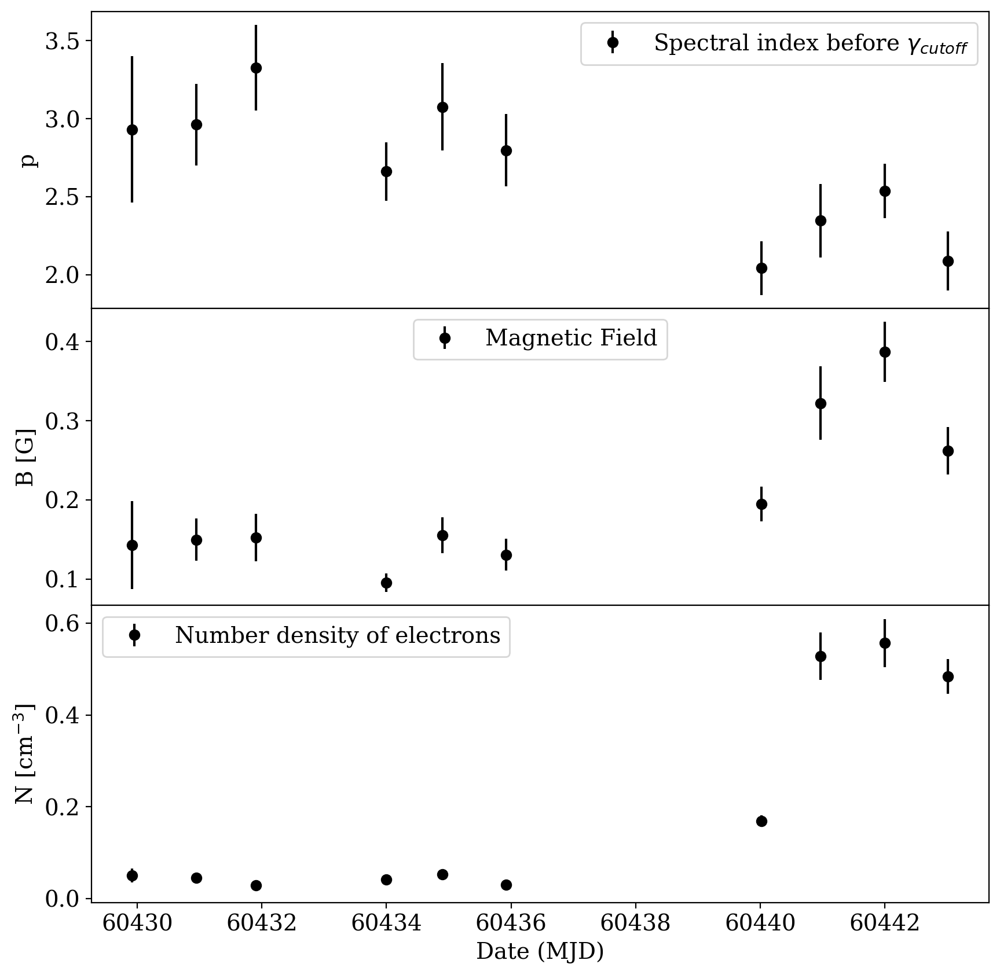

In [11]:
fig, axs = plt.subplots(3,1, figsize = (10,10), sharex = True)
fig.subplots_adjust(hspace=0.00)
axs[0].errorbar(MJD_swift_xrt, zp_compact_val, yerr = zp_compact_val_err, fmt = 'o', color = 'black', label = 'Spectral index before $\gamma_{cutoff}$')
axs[0].set_ylabel(r'p')
axs[0].legend(loc = 'upper right')
axs[1].errorbar(MJD_swift_xrt, zB_compact_val, yerr = zB_compact_val_err, fmt = 'o', color = 'black', label = 'Magnetic Field')
axs[1].set_ylabel(r'B [G]')
axs[1].legend(loc = 'upper center')
axs[2].errorbar(MJD_swift_xrt, zN_compact_val, yerr = zN_compact_val_err, fmt = 'o', color = 'black', label = 'Number density of electrons')
axs[2].set_ylabel(r'N [cm$^{-3}$]')
axs[2].legend(loc = 'best')
#axs[4].errorbar(MJD_swift_xrt, gamma_br_compact_val, yerr = gamma_br_compact_val_err, fmt = 'o', label = 'gamma break')
#axs[4].set_ylabel(r'$\gamma_{br}$')
#axs[4].legend()
#axs[3].errorbar(MJD_swift_xrt, zgamma_cut_compact_val, yerr = zgamma_cut_compact_err_val, fmt = 'o', color = 'black', label = '$\gamma_{cutoff}$')
#axs[3].set_ylabel('$\gamma_{cutoff} [10^5]$')
axs[2].set_xlabel(r'Date (MJD)')
#axs[3].legend(loc = 'upper left')

plt.savefig('two_zone_pl_expcut_param_fixed_gamma_cut_final_V.png')

## Final SEDs

In [8]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/'
zR_compact = np.array([7.65444928e+15, 7.70430248e+15 ,1.02039892e+16 ,1.06131062e+16,
 7.68919923e+15 ,1.02261059e+16, 4.13351465e+15, 2.21562977e+15,
 2.20329644e+15 ,2.61209673e+15])
all_txt_files = []
best_fit_results = {}
SED_data = {}
zp_compact_val = []
zB_compact_val = []
zN_compact_val = []
zB_extended_val = []
zN_extended_val = []
zgamma_CUT_extended_val = []
zgamma_cut_compact_val = []
zchisq_red = []
zdof = []
# errors
zp_compact_val_err = []
zB_compact_val_err = []
zN_compact_val_err = []
zB_extended_val_err = []
zN_extended_val_err = []
zgamma_CUT_extended_err_val =[]
zgamma_cut_compact_err_val = []
#mcmc parameters
N_par_value_mcmc = []
N_upper_err_mcmc = []
N_lower_err_mcmc = []
B_par_value_mcmc = []
B_upper_err_mcmc = []
B_lower_err_mcmc = []
P_par_value_mcmc = []
P_upper_err_mcmc = []
P_lower_err_mcmc = []

/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.041954586165200834  mcmc bounds: [0.01, 0.6083414993954122]
par: B  best fit value:  0.12872274062179115  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.864990473360012  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 438.62 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.03818631496376103  mcmc bounds: [0.01, 0.5537015669745349]
par: B  best fit value:  0.1350491103003837  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.910607591896173  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 481.37 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.023751124527937435  mcmc bounds: [0.01, 0.3443913056550928]
par: B  best fit value:  0.13188151863712735  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  3.2217492587753527  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 473.26 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.03322142021246147  mcmc bounds: [0.01, 0.4817105930806913]
par: B  best fit value:  0.09042162495902609  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.643306224920817  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 495.31 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/plot_sedfit.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self.fig=plt.figure(figsize=figsize,dpi=dpi)
/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.0429456671345231  mcmc bounds: [0.01, 0.6227121734505849]
par: B  best fit value:  0.14135099001305612  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  3.033205129198981  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 496.47 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.02491017824203653  mcmc bounds: [0.01, 0.36119758450952966]
par: B  best fit value:  0.11866970091182394  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.72609737862689  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 503.10 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.14959068759745767  mcmc bounds: [0.01, 0.7]
par: B  best fit value:  0.18432337639232682  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.0230249102042337  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 518.82 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.4737172108110225  mcmc bounds: [0.01, 0.7]
par: B  best fit value:  0.2918689640033535  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.3015377147790543  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 522.69 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.486036597866392  mcmc bounds: [0.01, 0.7]
par: B  best fit value:  0.35267237467356277  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.506009913018288  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 494.55 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.42883414071918735  mcmc bounds: [0.01, 0.7]
par: B  best fit value:  0.24350205834519947  mcmc bounds: [0.01, 0.6]
par: P  best fit value:  2.048396914968305  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 499.29 seconds


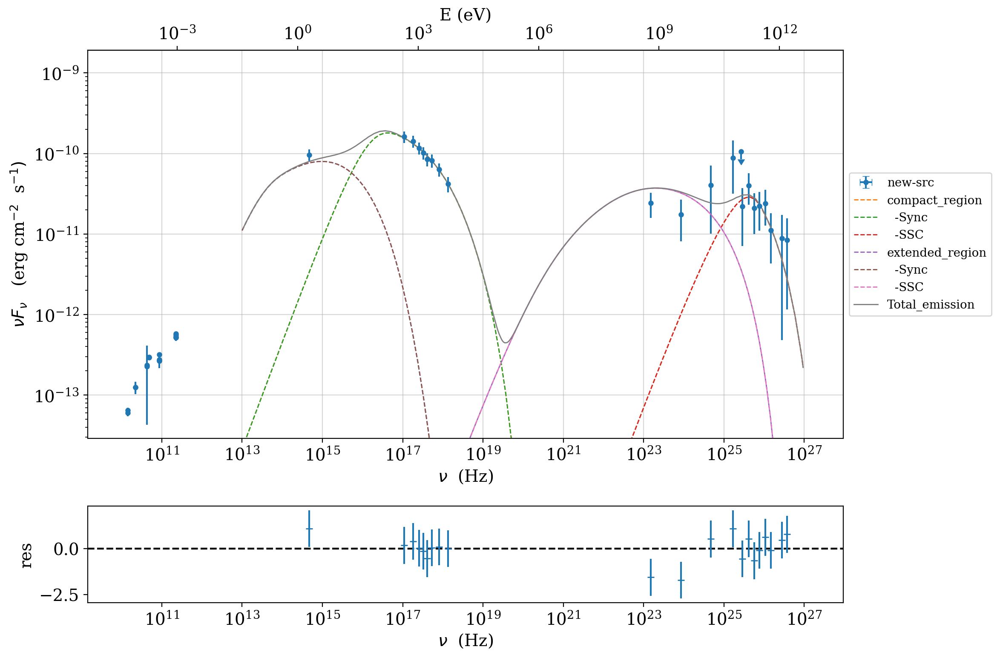

<Figure size 1200x800 with 0 Axes>

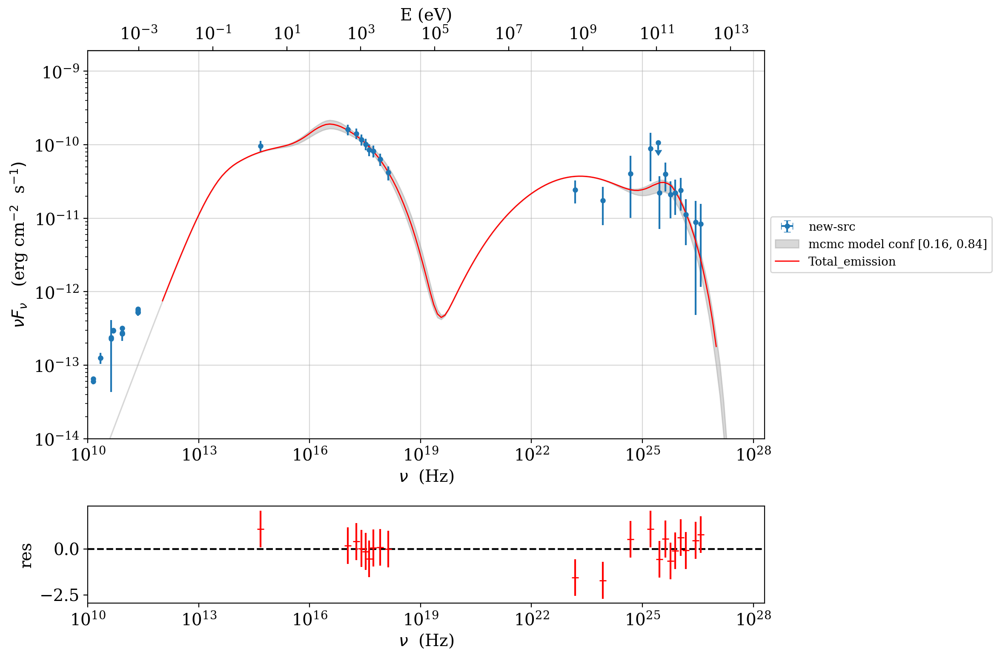

<Figure size 1200x800 with 0 Axes>

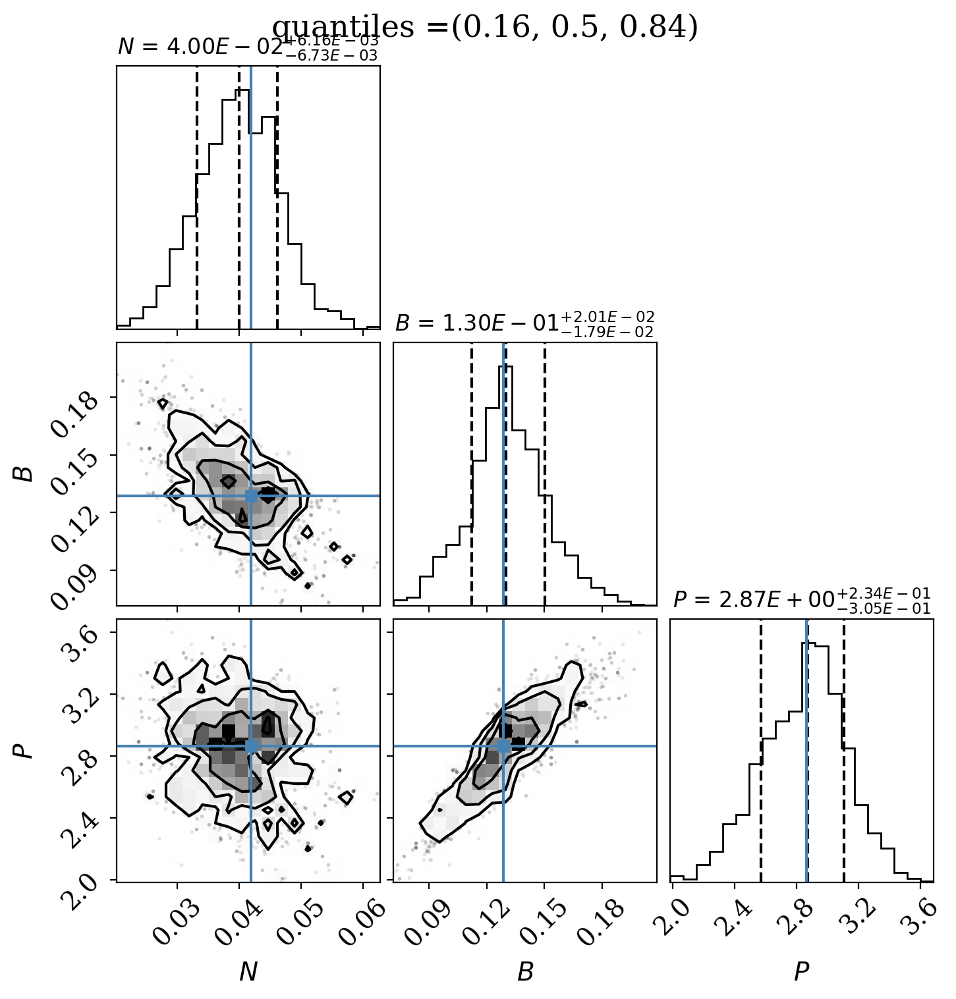

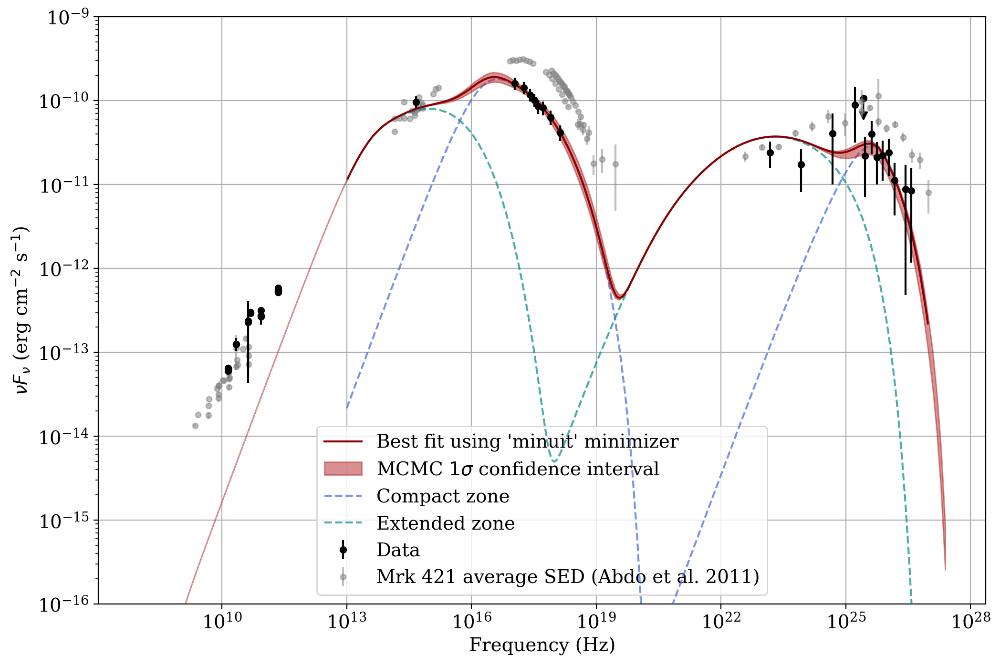

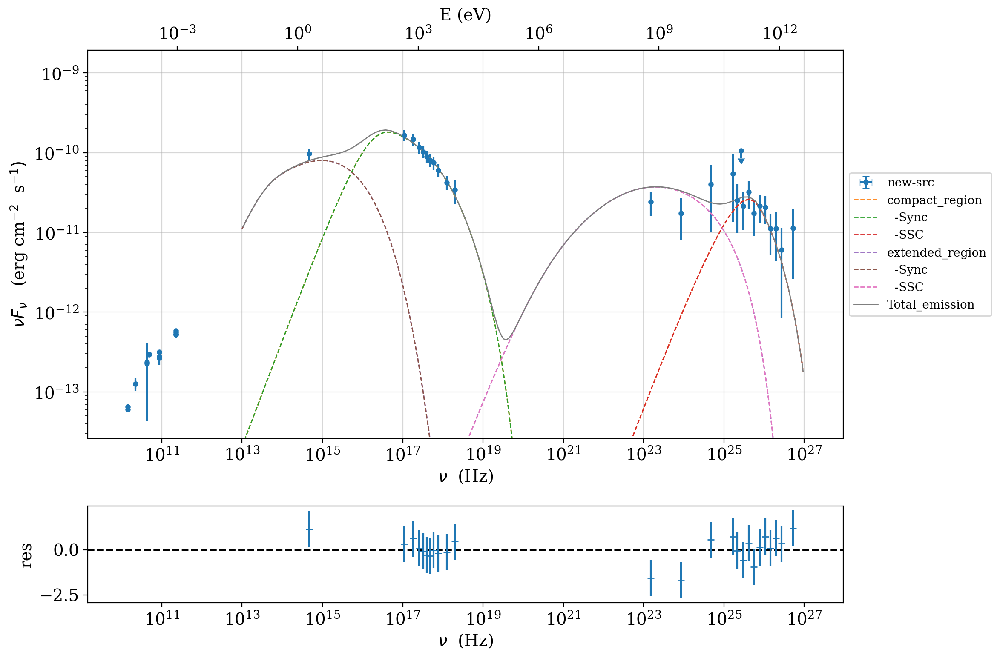

<Figure size 1200x800 with 0 Axes>

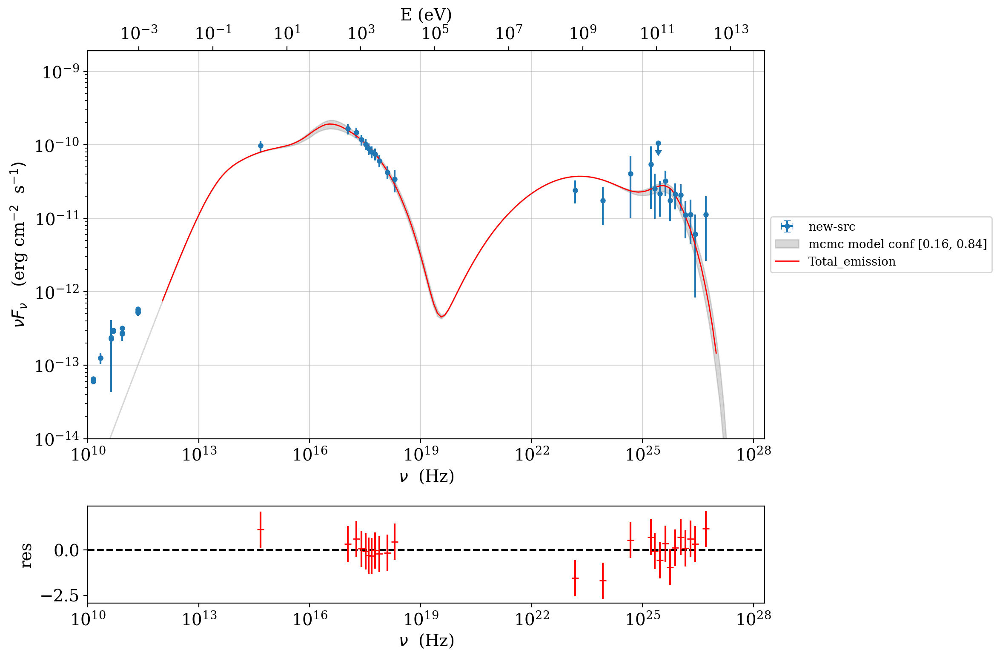

<Figure size 1200x800 with 0 Axes>

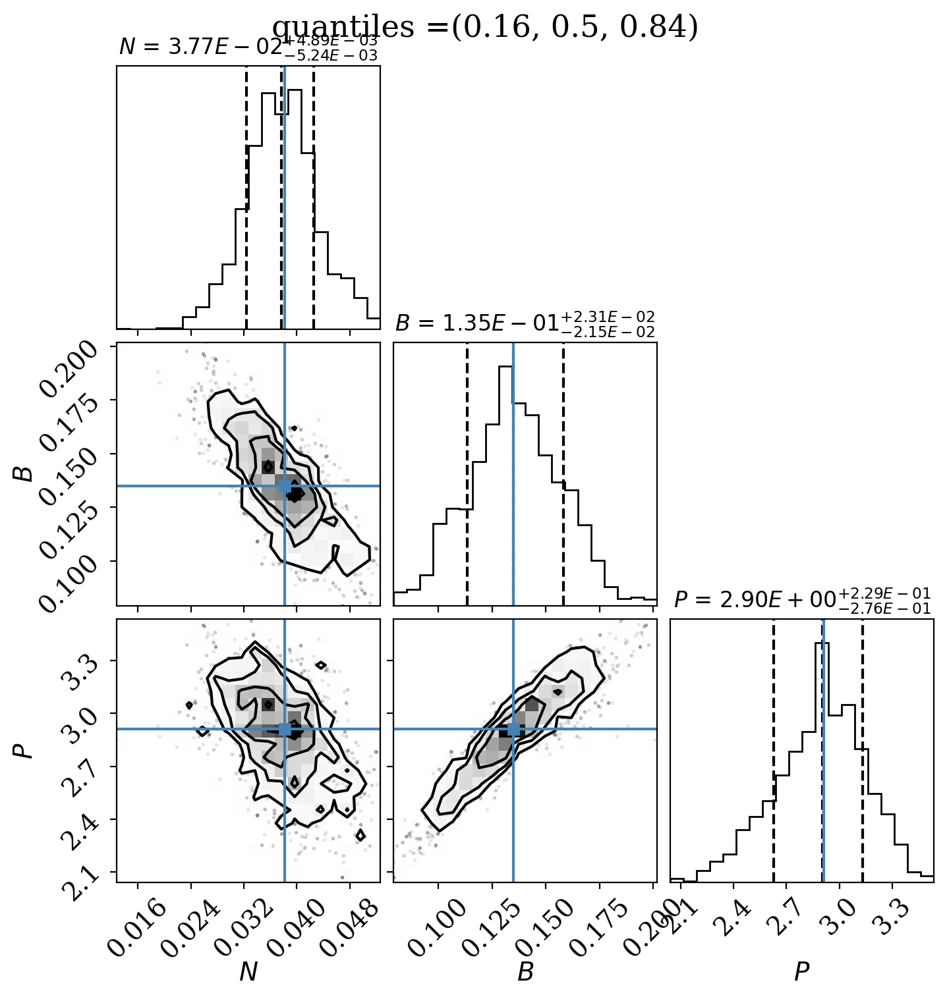

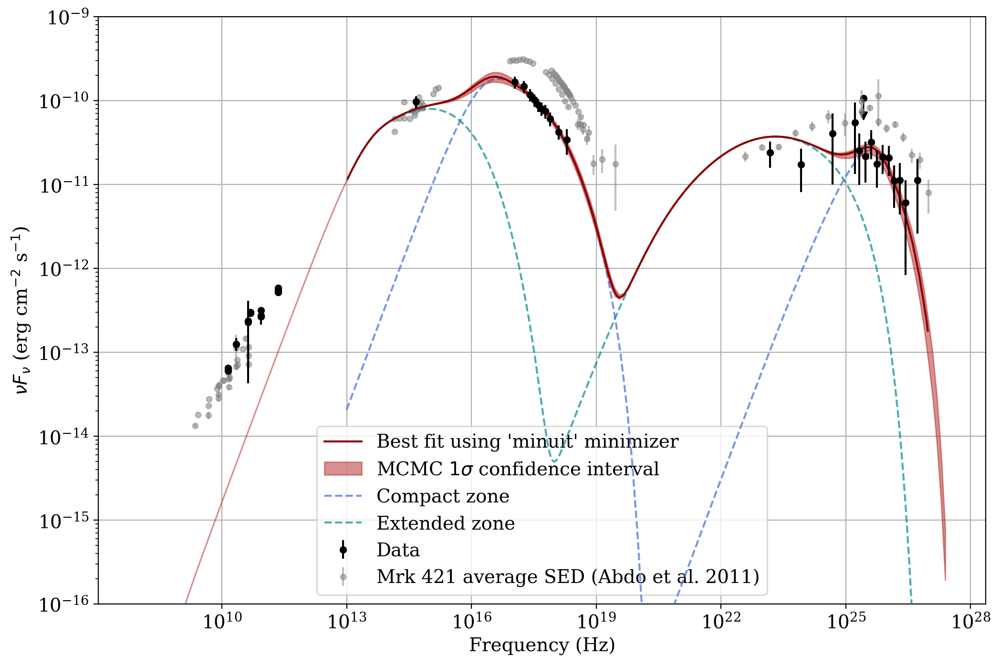

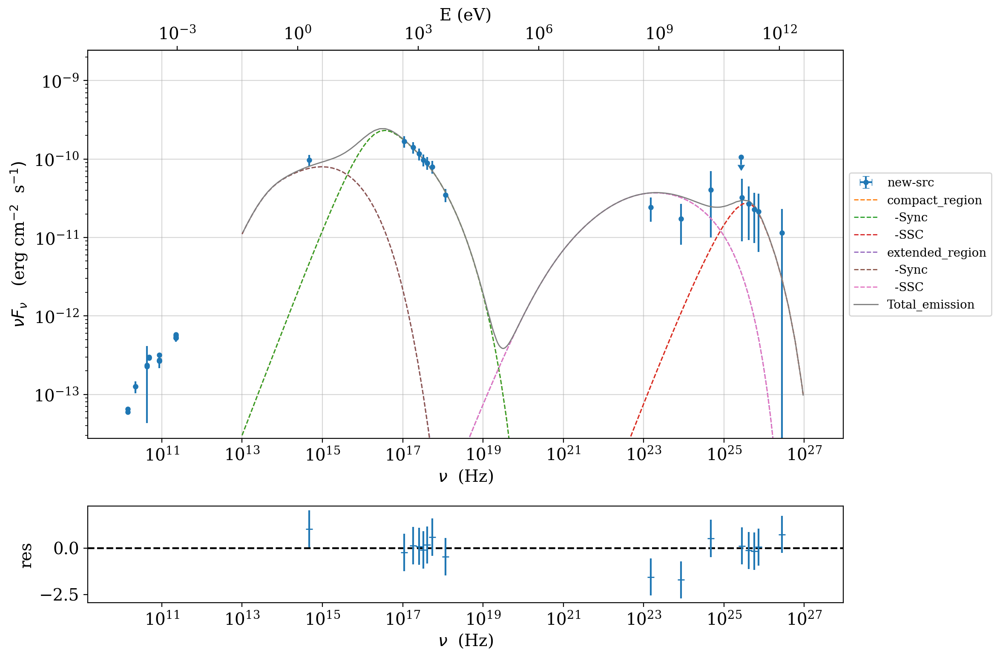

<Figure size 1200x800 with 0 Axes>

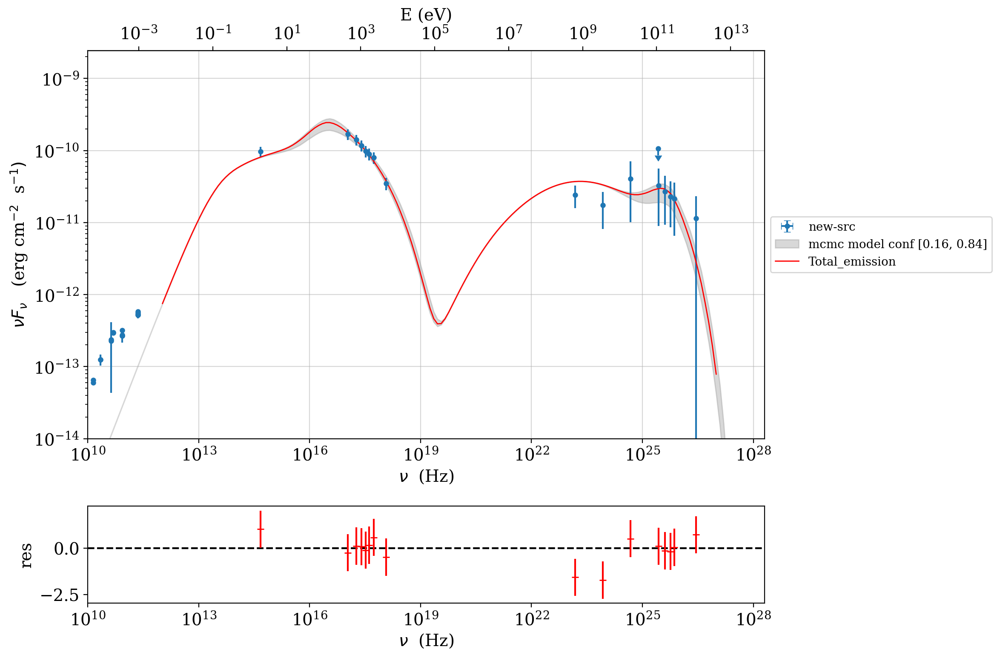

<Figure size 1200x800 with 0 Axes>

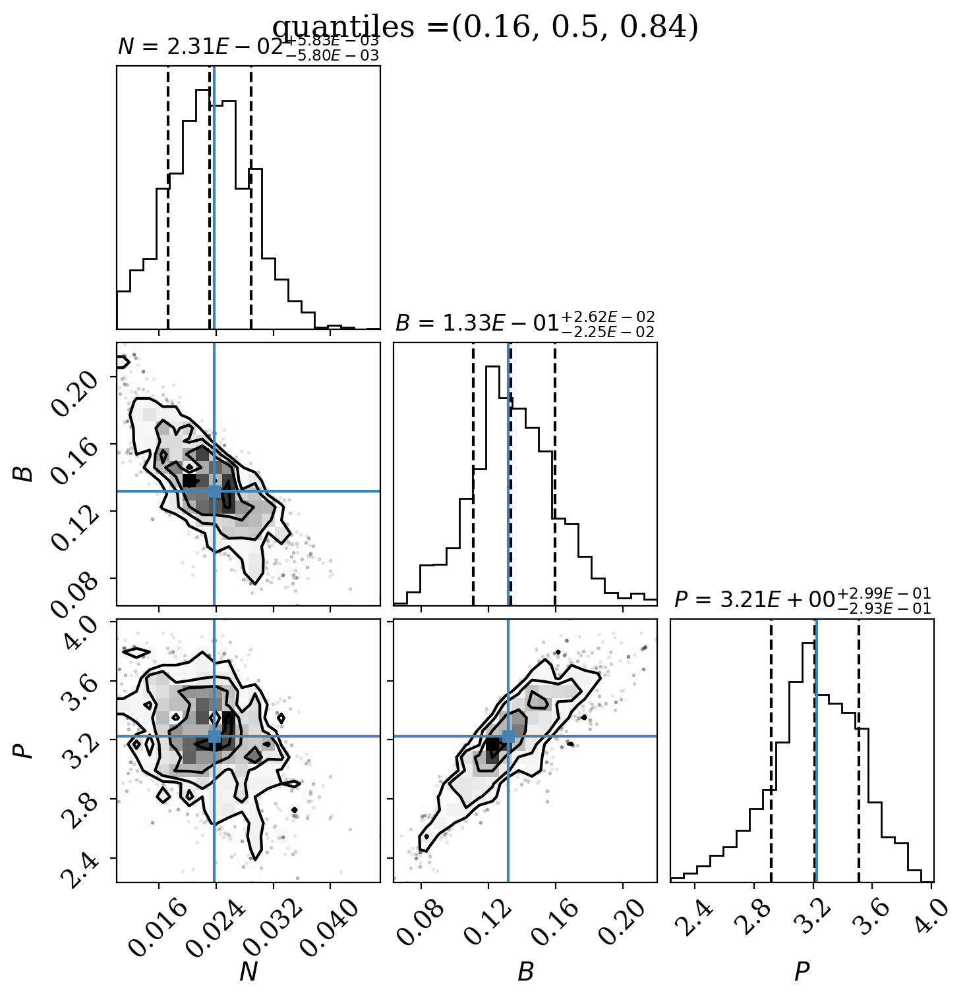

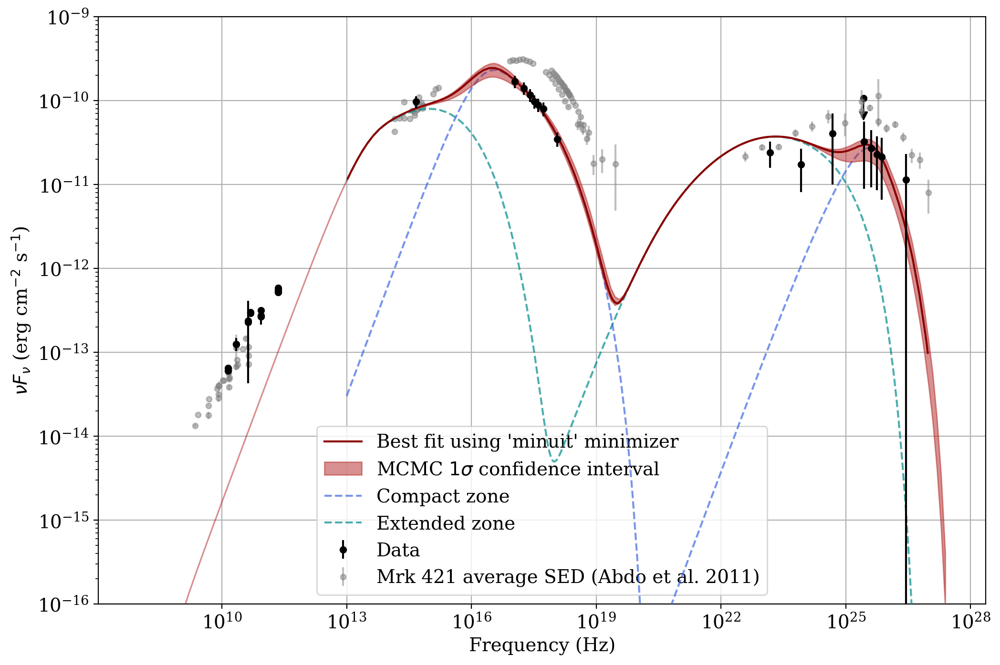

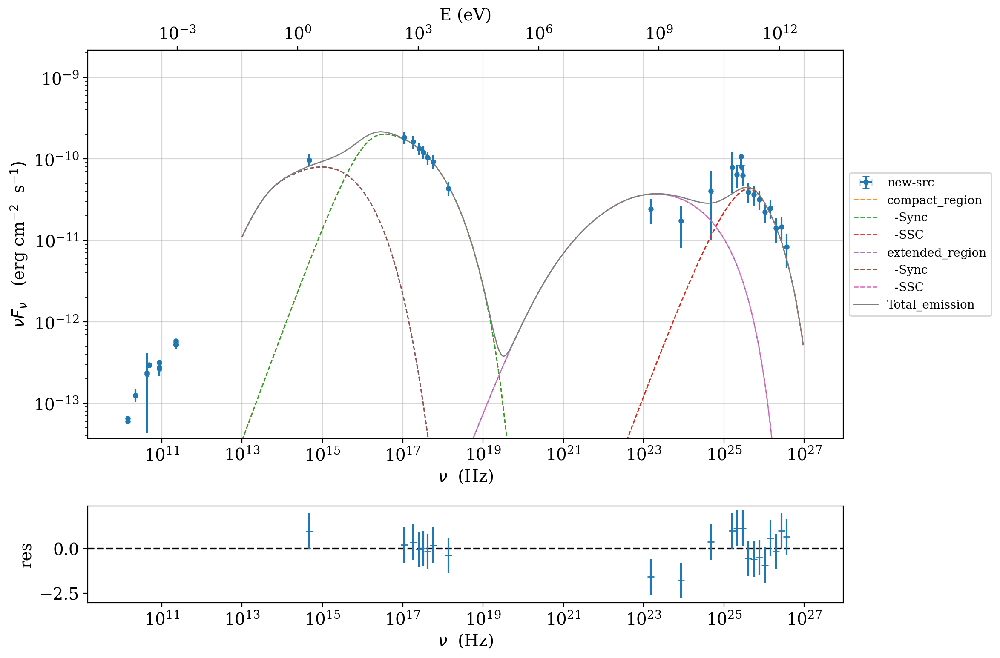

<Figure size 1200x800 with 0 Axes>

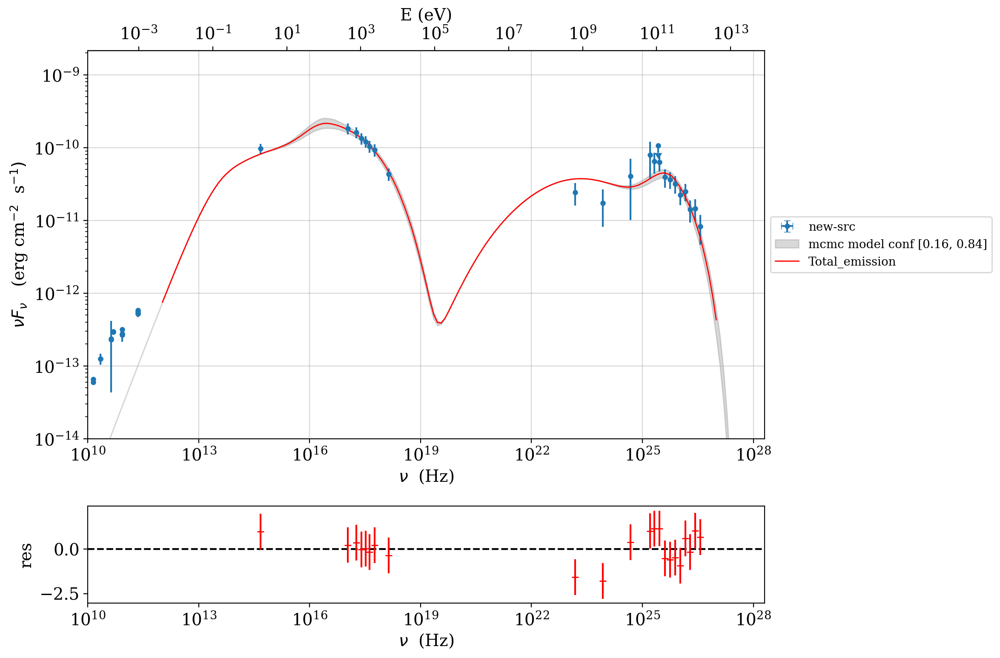

<Figure size 1200x800 with 0 Axes>

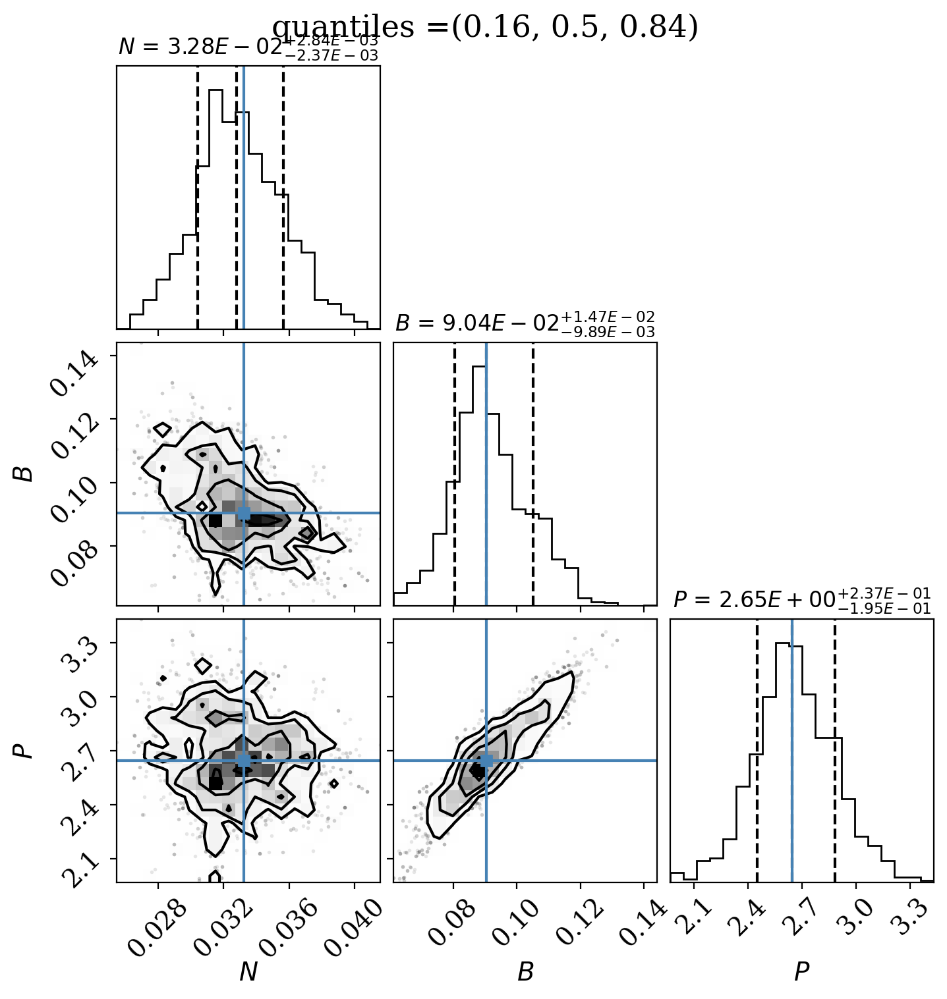

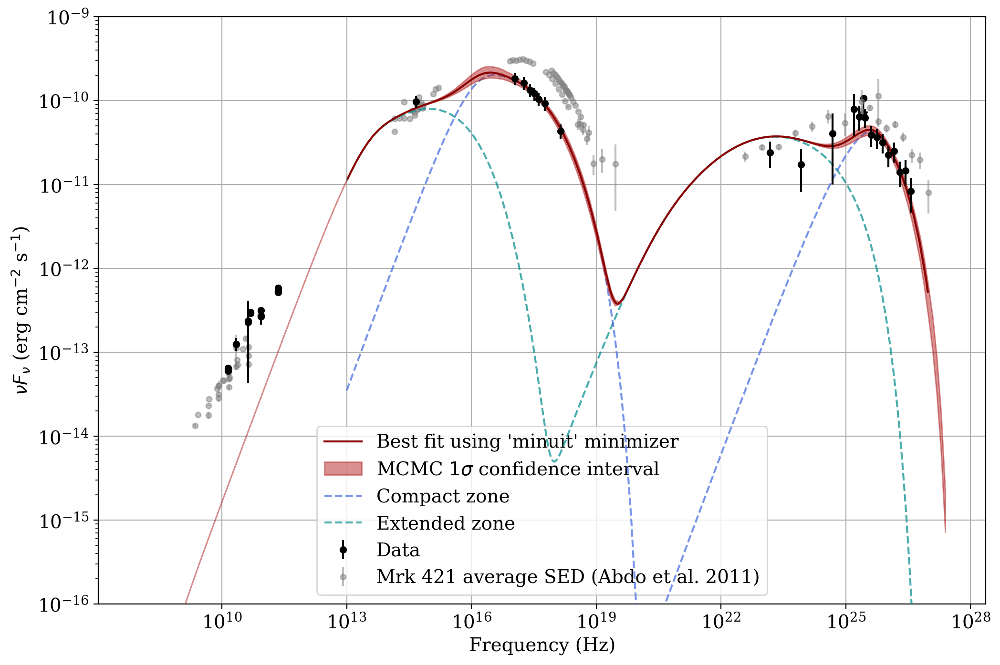

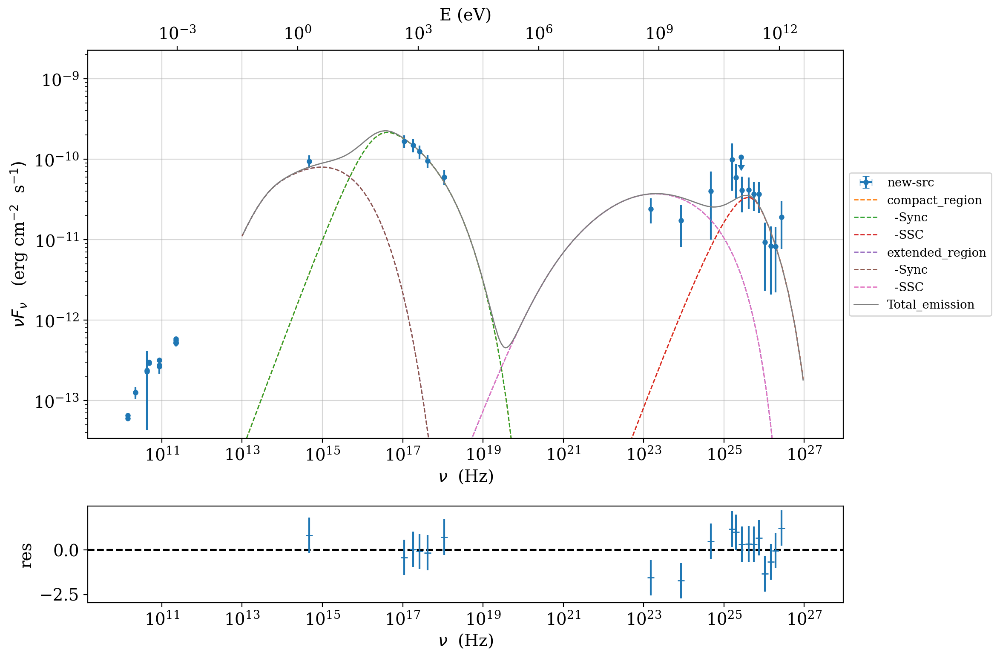

<Figure size 1200x800 with 0 Axes>

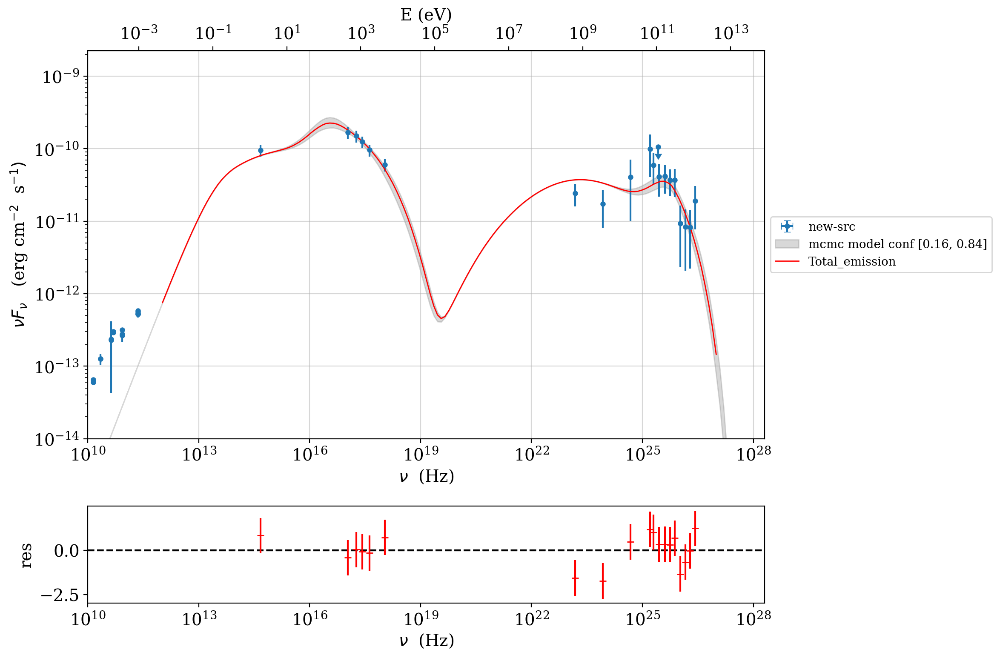

<Figure size 1200x800 with 0 Axes>

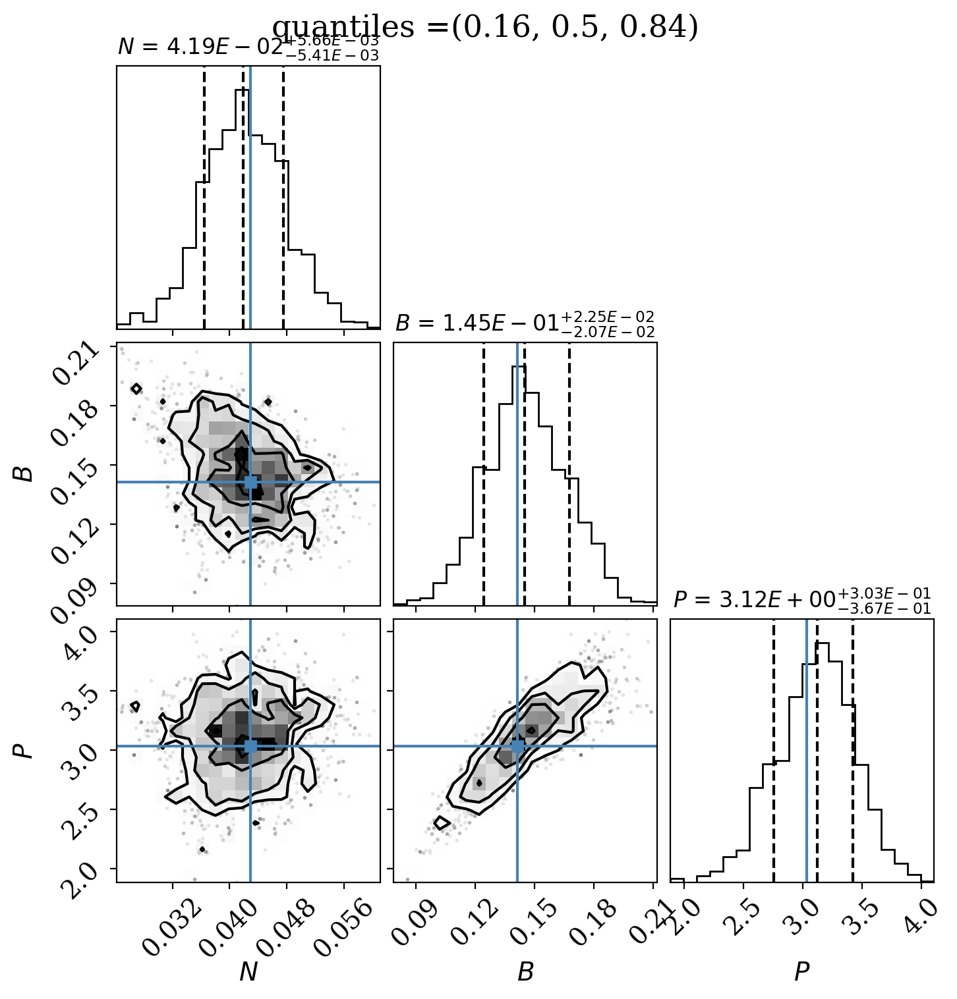

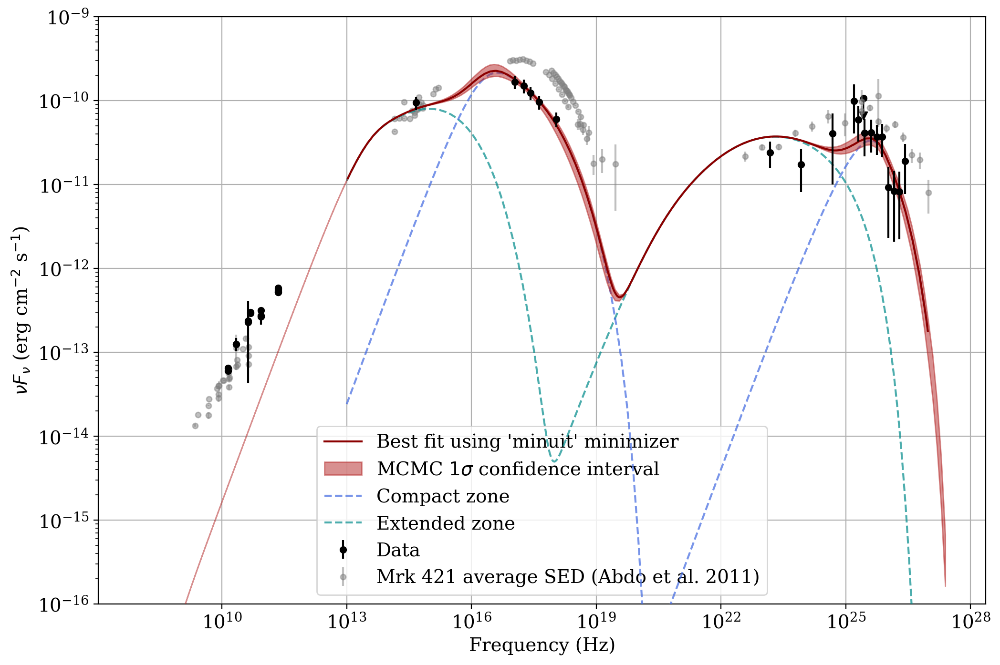

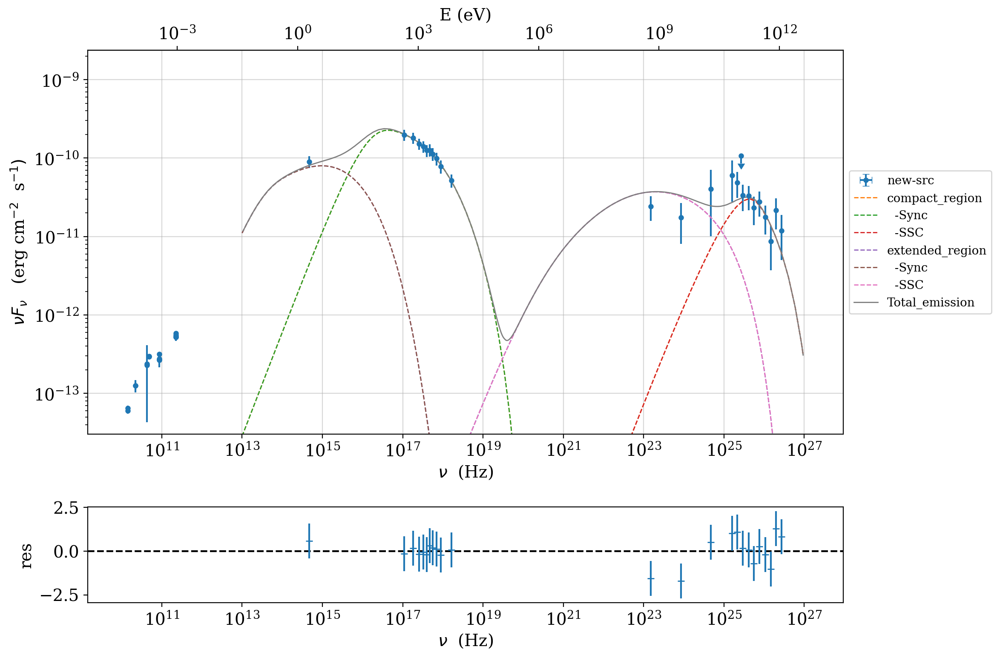

<Figure size 1200x800 with 0 Axes>

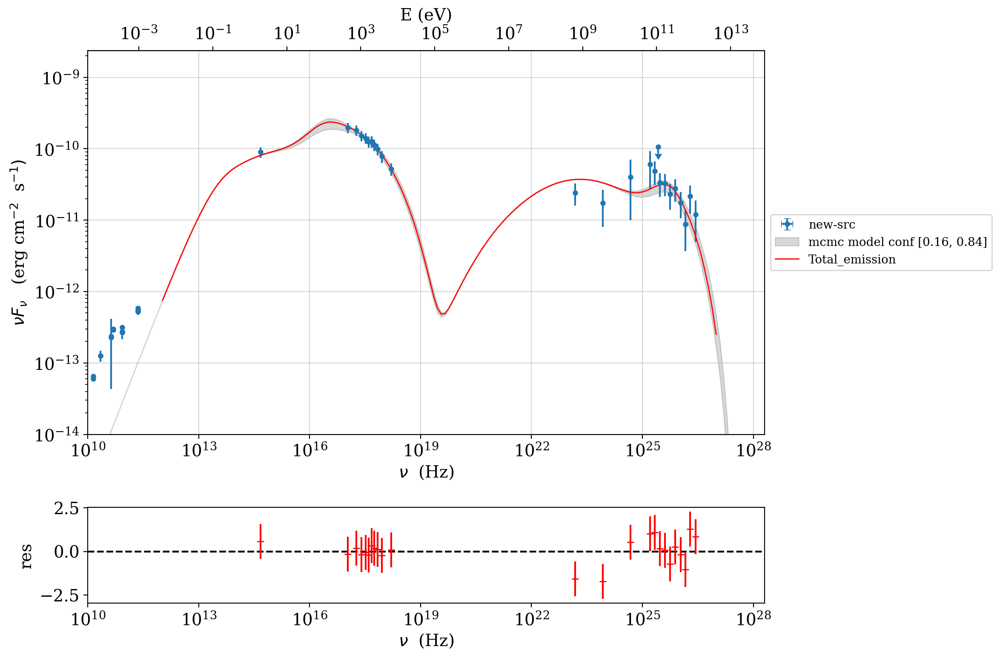

<Figure size 1200x800 with 0 Axes>

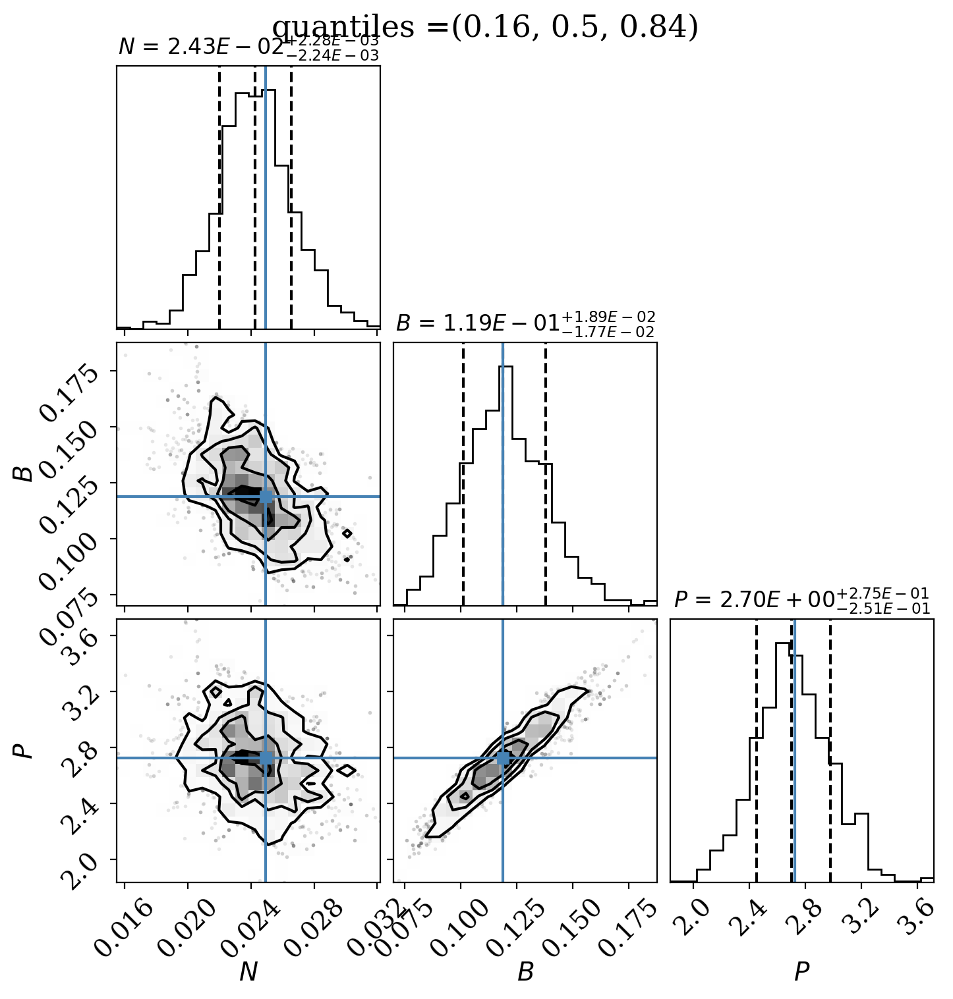

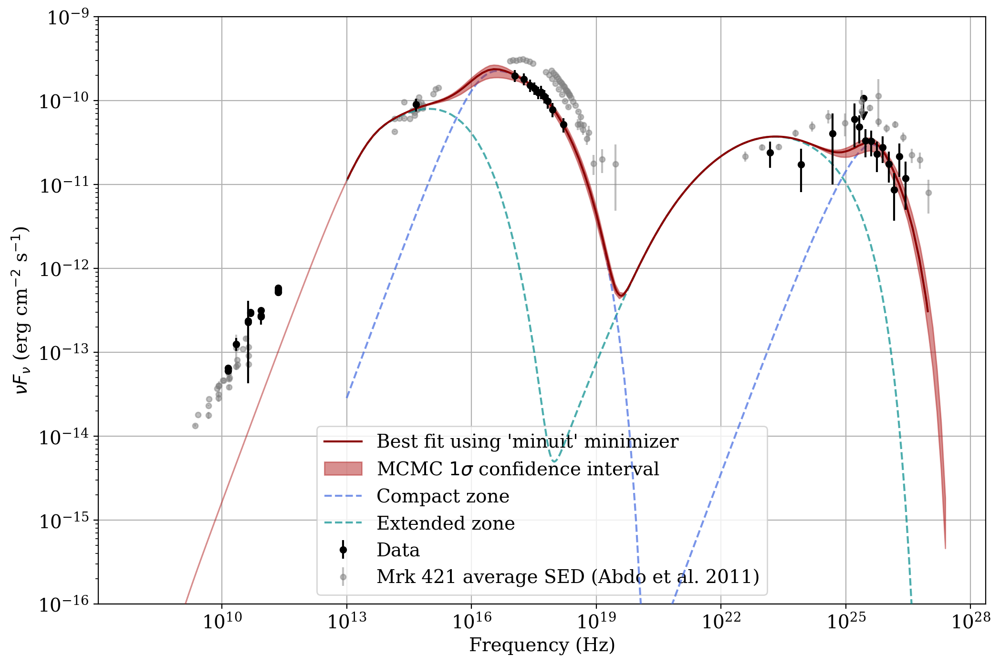

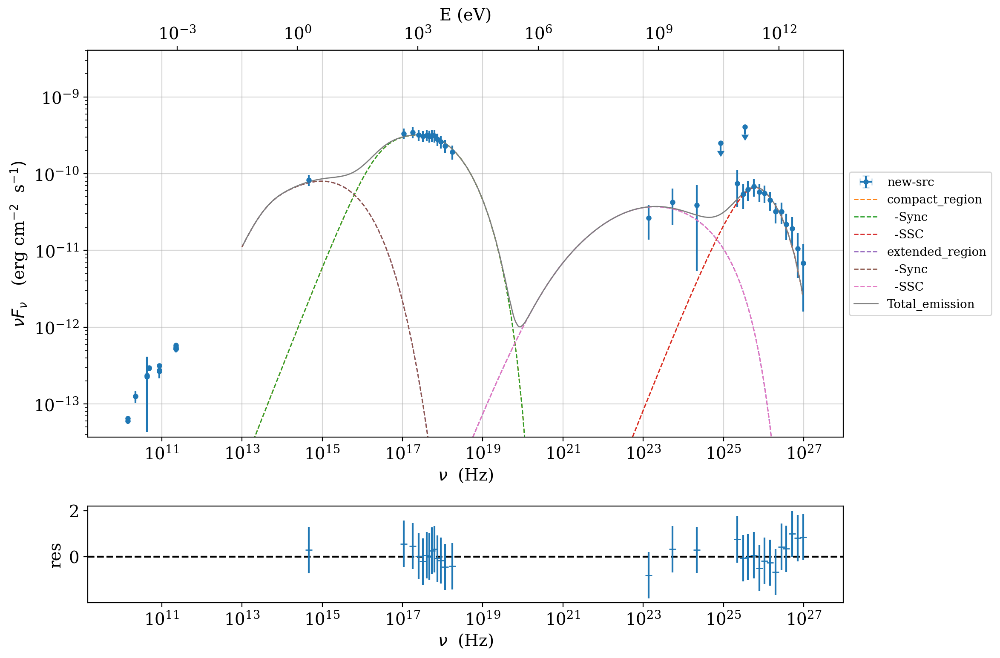

<Figure size 1200x800 with 0 Axes>

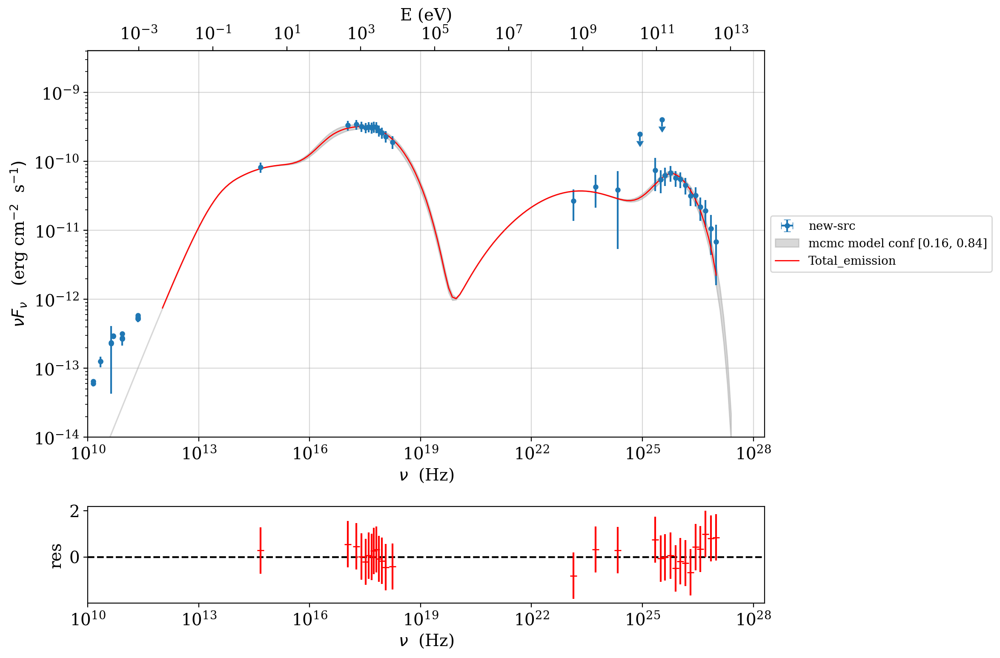

<Figure size 1200x800 with 0 Axes>

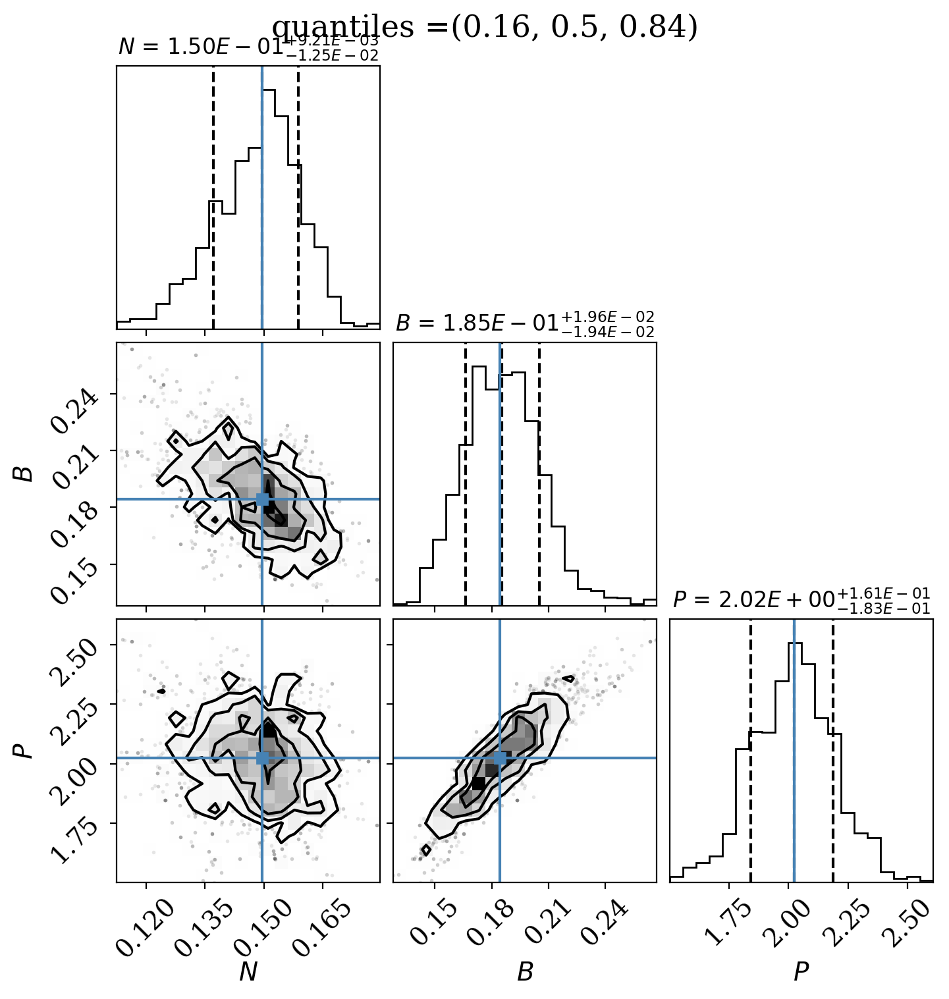

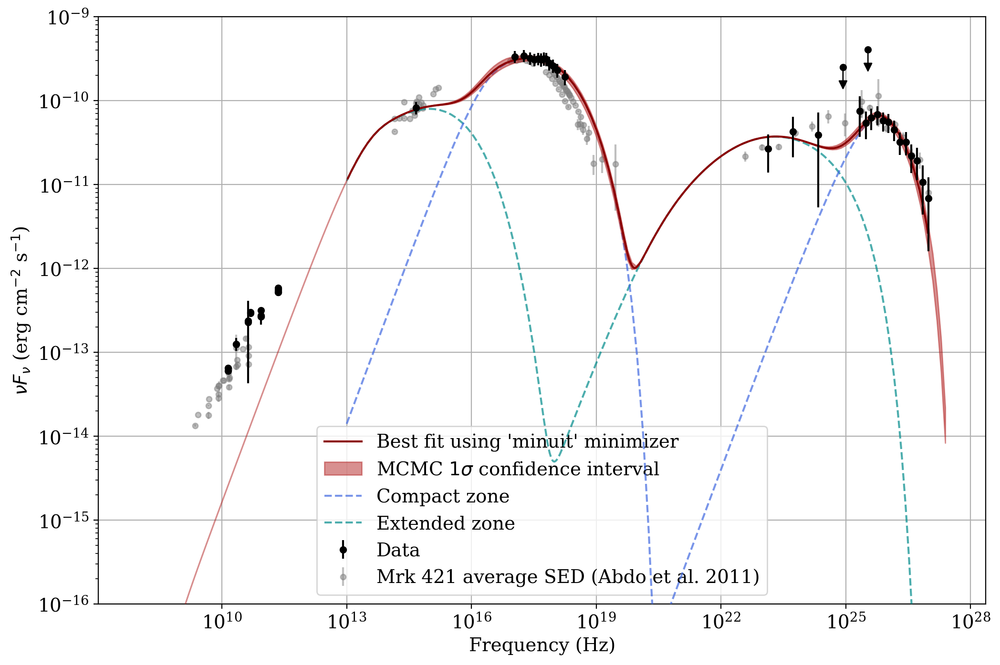

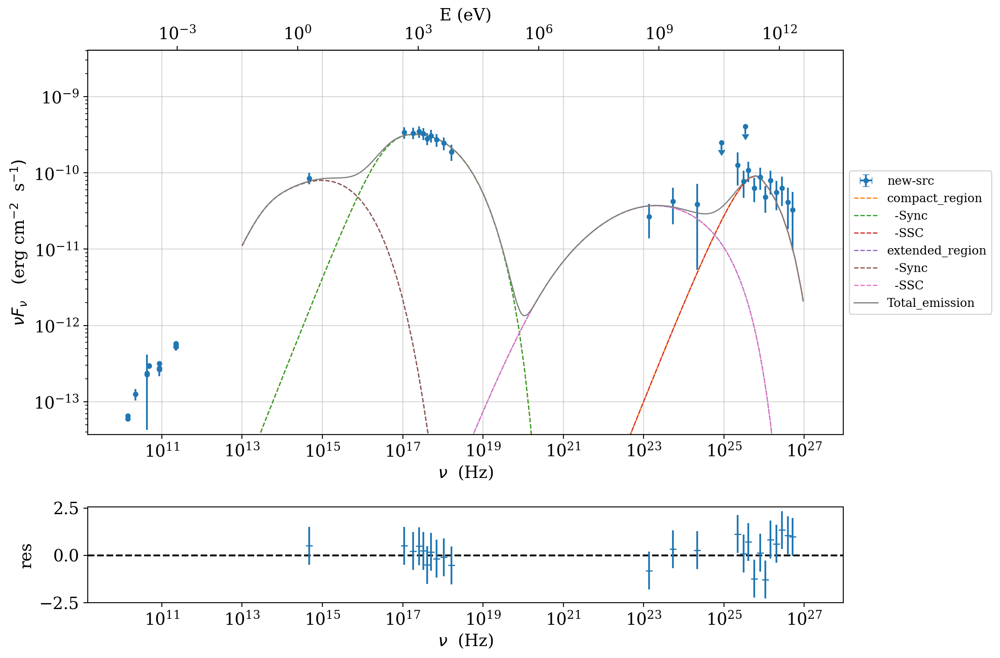

<Figure size 1200x800 with 0 Axes>

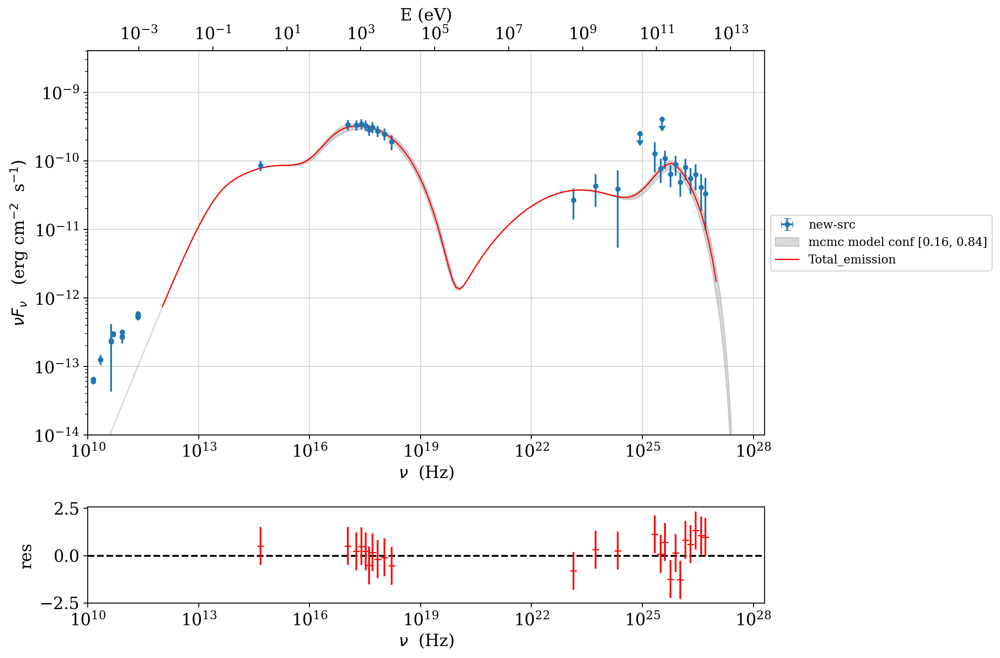

<Figure size 1200x800 with 0 Axes>

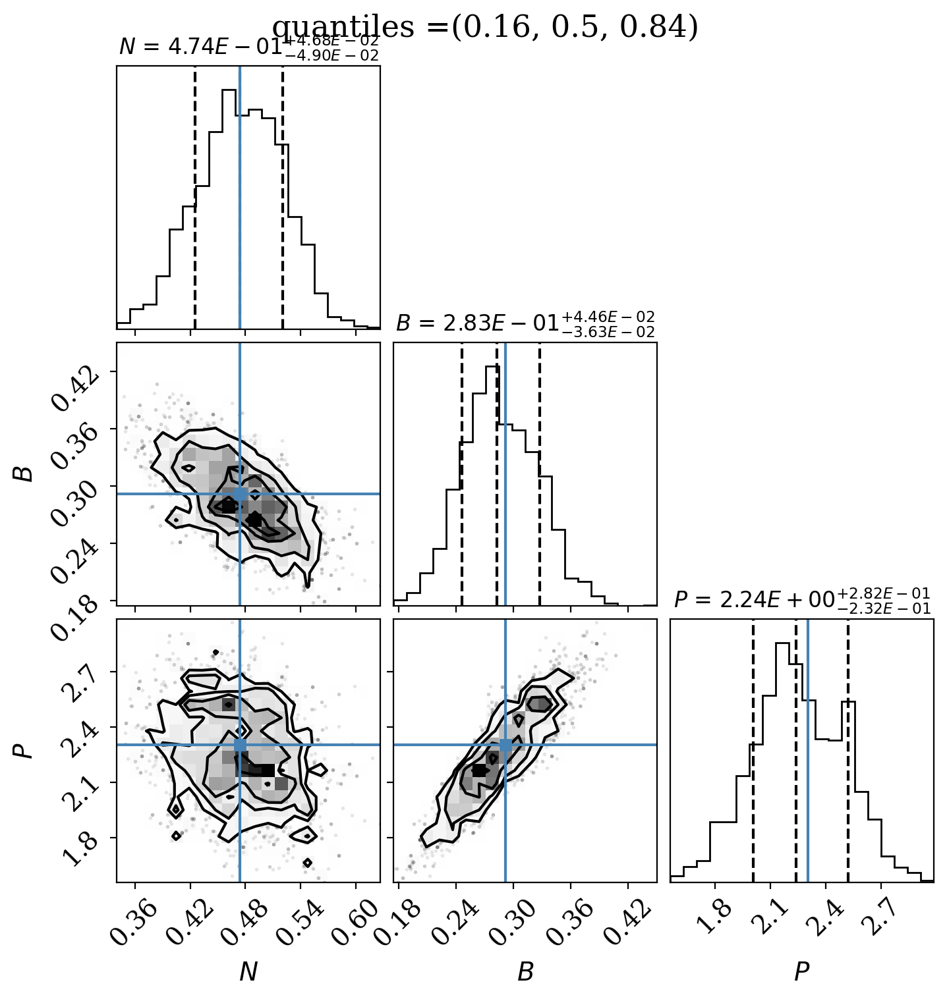

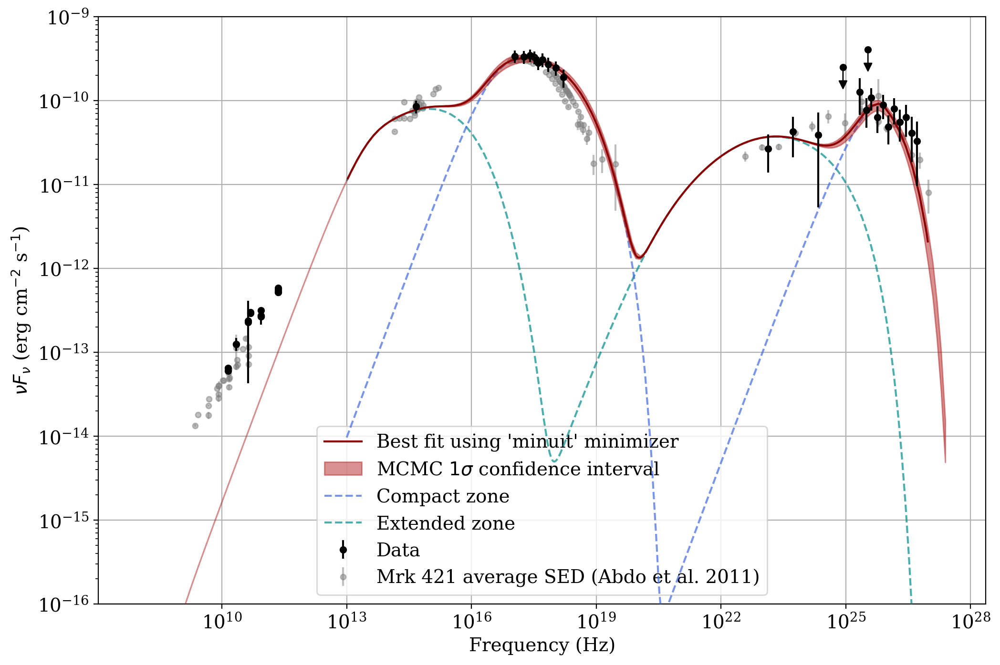

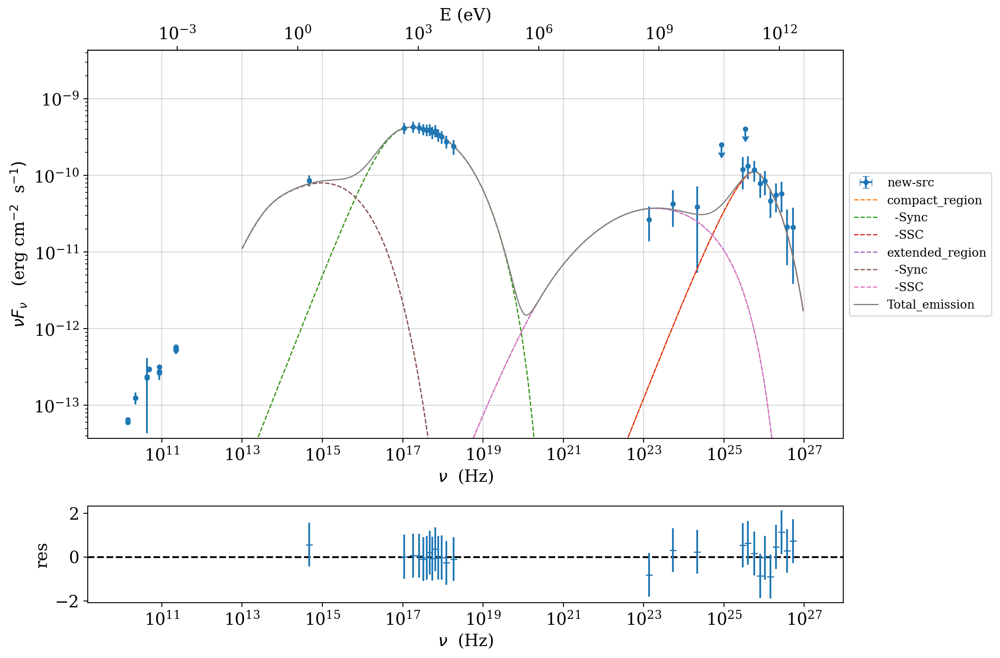

<Figure size 1200x800 with 0 Axes>

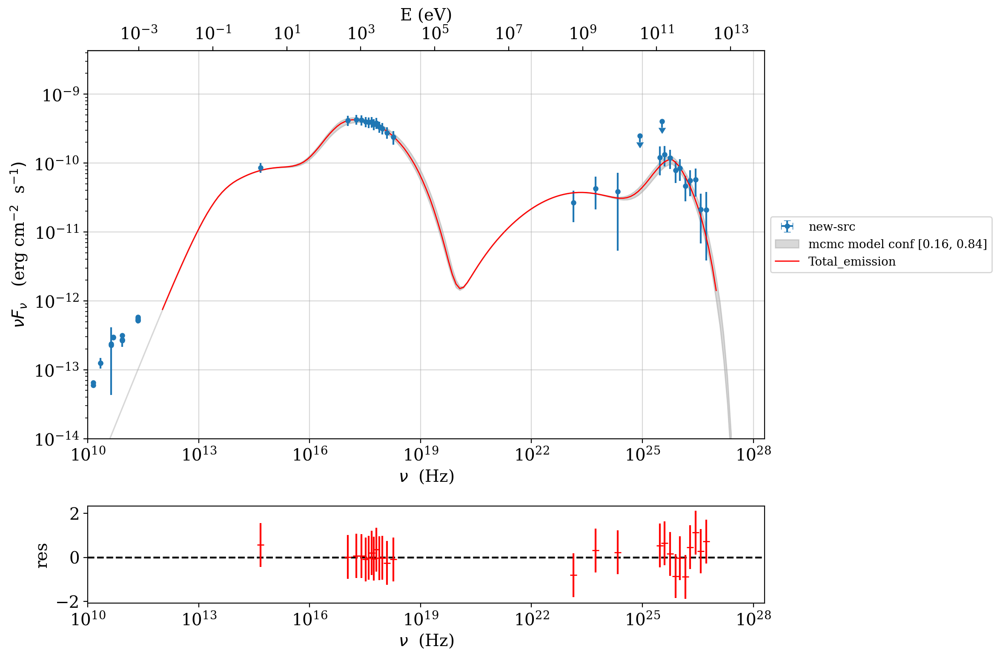

<Figure size 1200x800 with 0 Axes>

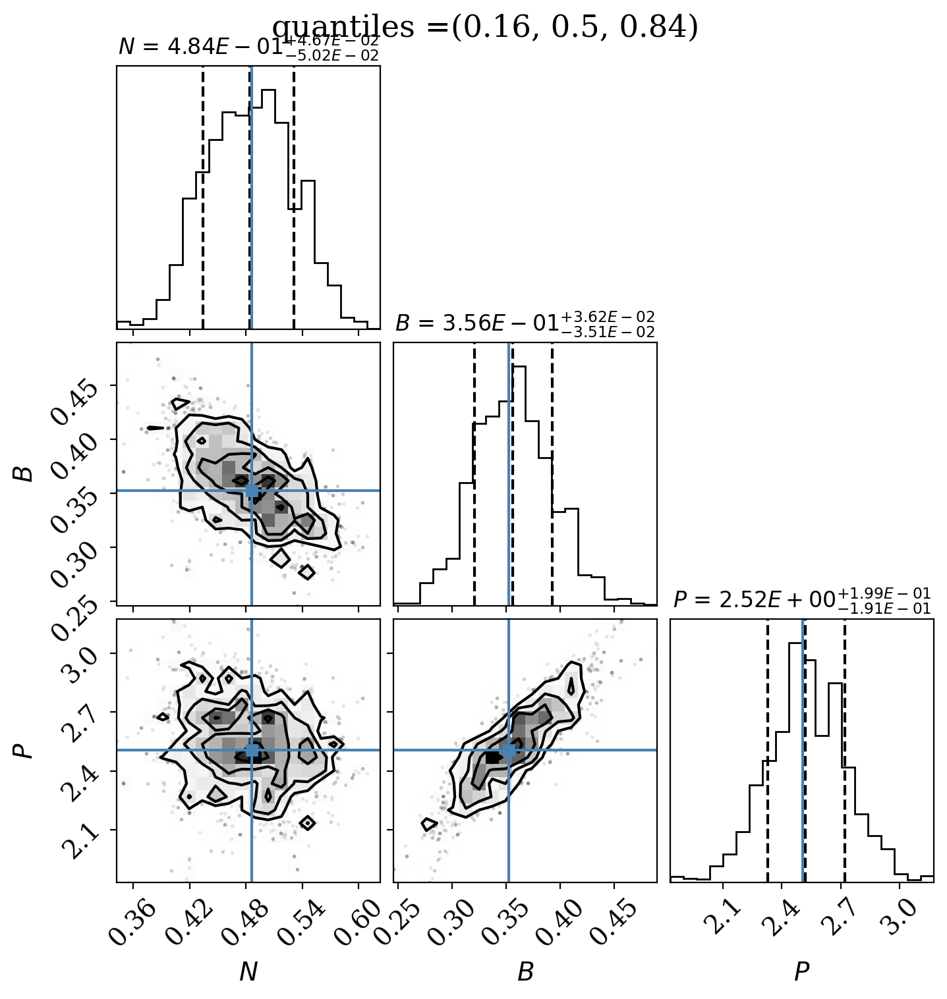

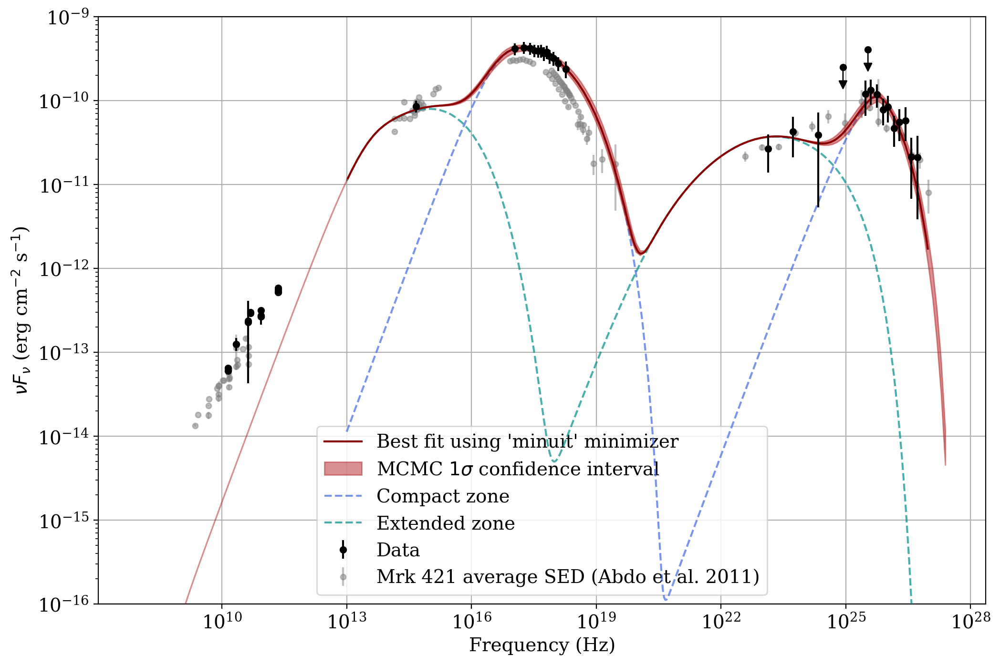

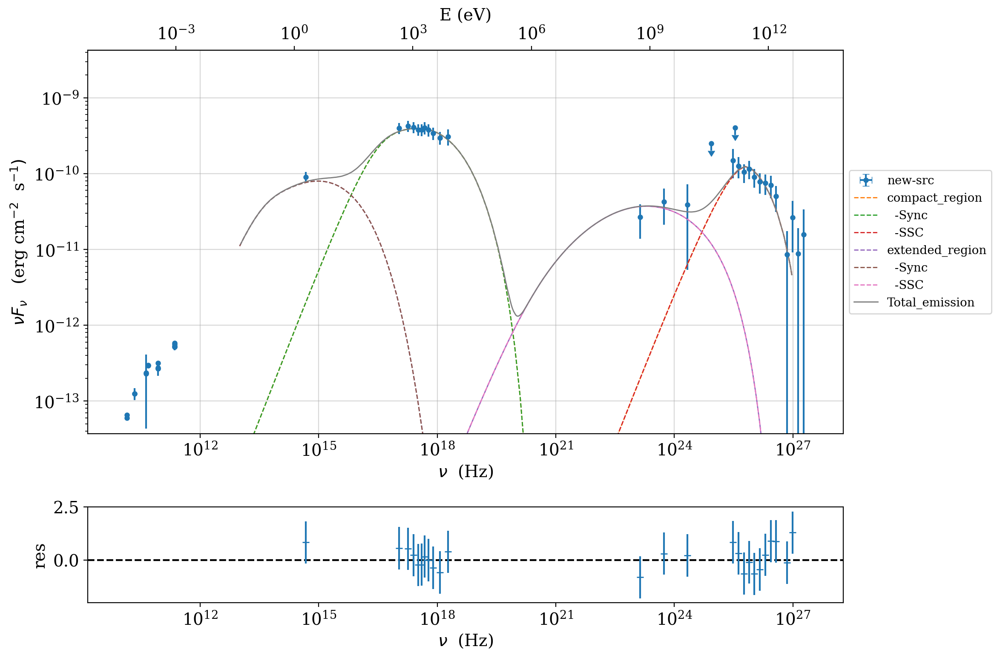

<Figure size 1200x800 with 0 Axes>

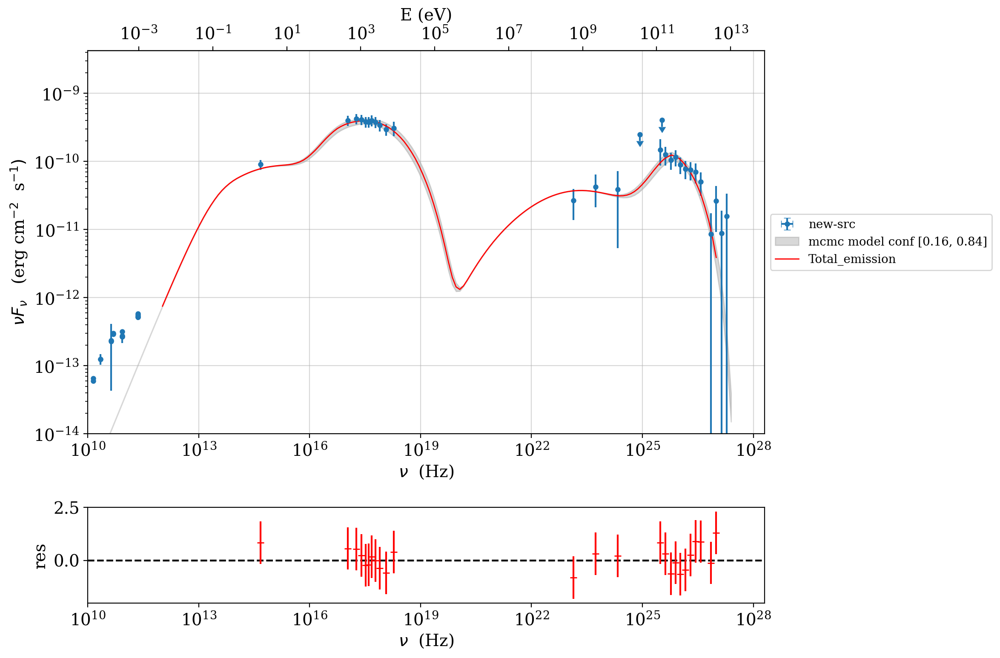

<Figure size 1200x800 with 0 Axes>

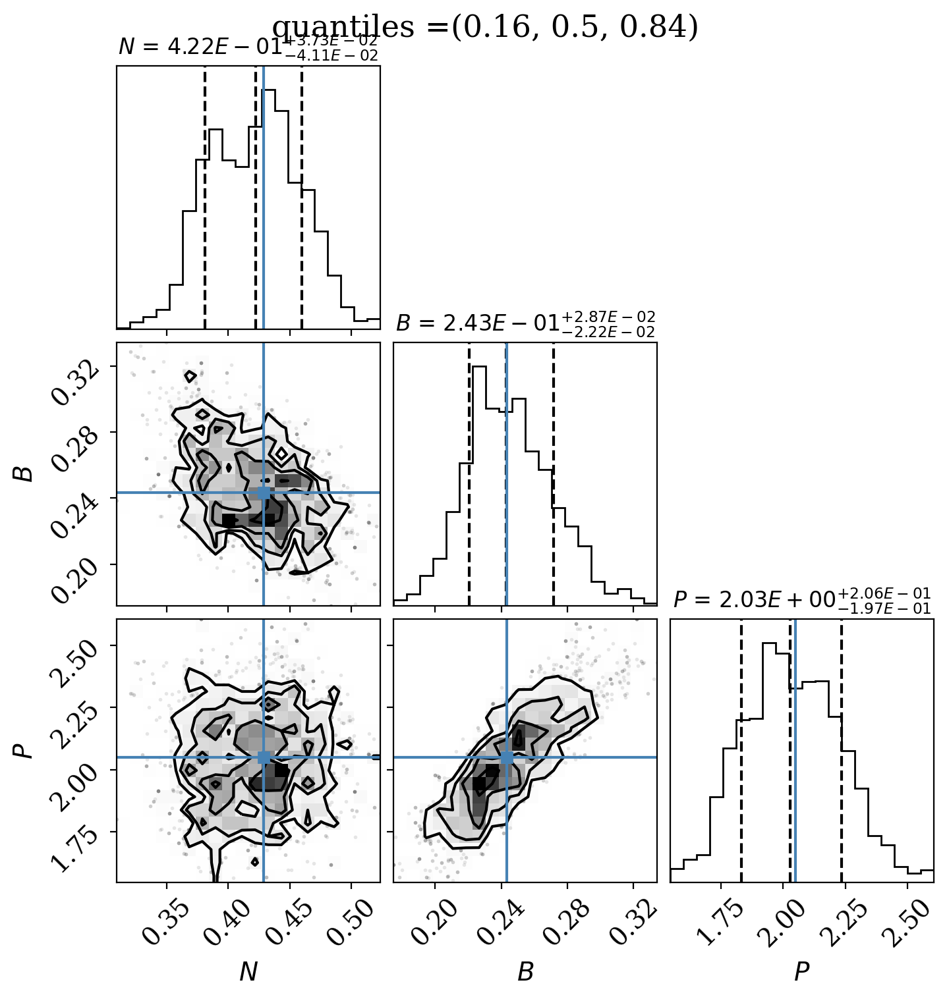

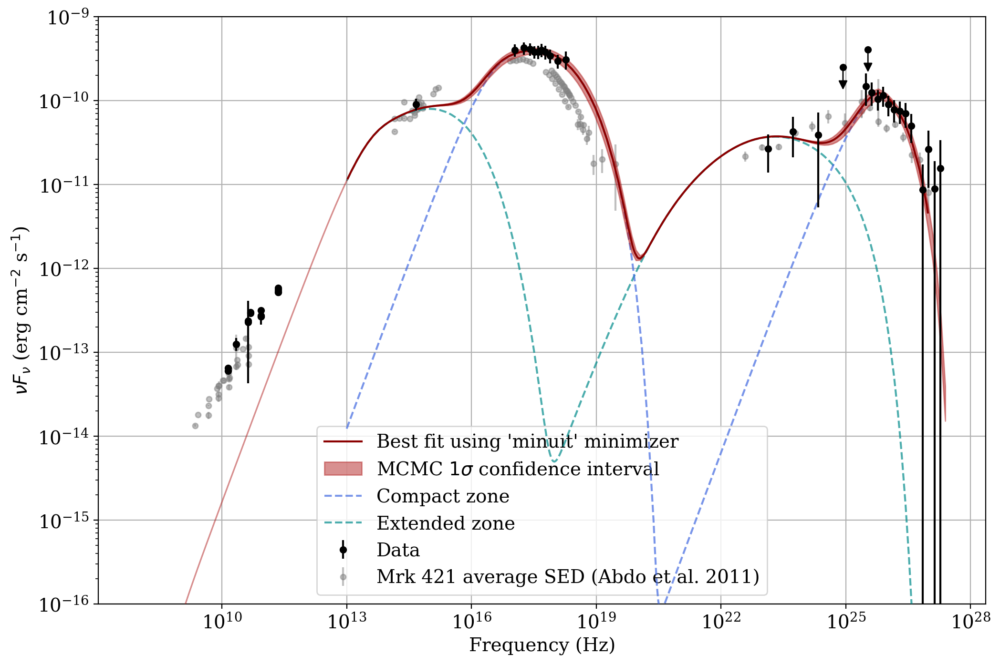

In [8]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/'
zR_compact = np.array([7.65444928e+15, 7.70430248e+15 ,1.02039892e+16 ,1.06131062e+16,
 7.68919923e+15 ,1.02261059e+16, 4.13351465e+15, 2.21562977e+15,
 2.20329644e+15 ,2.61209673e+15])
all_txt_files = []
best_fit_results = {}
SED_data = {}
zp_compact_val = []
zB_compact_val = []
zN_compact_val = []
zB_extended_val = []
zN_extended_val = []
zgamma_CUT_extended_val = []
zgamma_cut_compact_val = []
zchisq_red = []
zdof = []
# errors
zp_compact_val_err = []
zB_compact_val_err = []
zN_compact_val_err = []
zB_extended_val_err = []
zN_extended_val_err = []
zgamma_CUT_extended_err_val =[]
zgamma_cut_compact_err_val = []
#mcmc parameters
N_par_value_mcmc = []
N_upper_err_mcmc = []
N_lower_err_mcmc = []
B_par_value_mcmc = []
B_upper_err_mcmc = []
B_lower_err_mcmc = []
P_par_value_mcmc = []
P_upper_err_mcmc = []
P_lower_err_mcmc = []

for f in os.listdir(file_path):
    if f.endswith('.txt'):
        all_txt_files.append(f)

for f_name, R_compact_val in zip(all_txt_files, zR_compact):
    int_id = f_name.replace('.txt', '')
    
    file = os.path.join(file_path, f_name)
    d = np.genfromtxt(file, delimiter = ',')
    # Data filtering
    index_above_radio = (d[:,0] > 5e12)
    d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

    # Initialize data
    data = Data(n_rows=d.shape[0])
    data.set_field('x', d[:,0])
    data.set_field('y', d[:,2])
    data.set_field('dy', value=d[:,3])
    data.set_field('UL', value=d[:,3] < 0.000)
    data.set_meta_data('z', 0.03)
    sed_data = ObsData(data_table = data)

    # Model setup
    Total_emission = FitModel(nu_size = 500, name='Total_emission')


    #Defining extended region 
    jet_extended_lsb = Jet(name='extended_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
    jet_extended_lsb.set_gamma_grid_size(400)
    jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11,nu_obs=4.67E14)
    #defining compact region
    jet_core_lsb = Jet(name='compact_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut_comp)
    jet_core_lsb.set_gamma_grid_size(400)
    ########################################3
    # Adding components to the composite jet
    Total_emission.add_component(jet_core_lsb)
    Total_emission.add_component(jet_extended_lsb)
    Total_emission.composite_expr='extended_region+compact_region'

    # Fixed parameters
    Total_emission.extended_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_extended_lsb, 'beam_obj')
    Total_emission.extended_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_extended_lsb, 'z_cosm')
    Total_emission.extended_region.parameters.R.val = 1.5e16
    Total_emission.freeze(jet_extended_lsb, 'R')
    Total_emission.extended_region.parameters.gmin.val = 2e3
    Total_emission.freeze(jet_extended_lsb, 'gmin')
    Total_emission.extended_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_extended_lsb, 'gmax')
    Total_emission.extended_region.parameters.p.val = 2
    Total_emission.freeze(jet_extended_lsb, 'p')
    Total_emission.extended_region.parameters.B.val = 0.055
    Total_emission.freeze(jet_extended_lsb, 'B')
    Total_emission.extended_region.parameters.N.val = 1.4
    Total_emission.freeze(jet_extended_lsb, 'N')
    Total_emission.extended_region.parameters.gamma_CUT.val = 1.6e4
    Total_emission.freeze(jet_extended_lsb, 'gamma_CUT')


    Total_emission.extended_region.nu_size = 200
    Total_emission.extended_region.IC_nu_size = 200
    ##############################################################################


    # Fixed parameters
    Total_emission.compact_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_core_lsb, 'beam_obj')
    Total_emission.compact_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_core_lsb, 'z_cosm')
    Total_emission.compact_region.parameters.R.val = R_compact_val
    Total_emission.freeze(jet_core_lsb, 'R')
    Total_emission.compact_region.parameters.gmin.val = 3e4
    Total_emission.freeze(jet_core_lsb, 'gmin')
    Total_emission.compact_region.parameters.GAMMA_cut.val = 1.45e5
    Total_emission.freeze(jet_core_lsb, 'GAMMA_cut')
    Total_emission.compact_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_core_lsb, 'gmax')

    # Free parameters
    Total_emission.compact_region.parameters.B.val = 0.034
    Total_emission.compact_region.parameters.N.val = 0.024


    # Fit ranges
    #Total_emission.compact_region.parameters.GAMMA_cut.fit_range = [6e4, 6e5]
    Total_emission.compact_region.parameters.P.fit_range = [1.5, 4.2]
    Total_emission.compact_region.parameters.B.fit_range = [0.01, 0.6]
    Total_emission.compact_region.parameters.N.fit_range = [0.01, 0.7]

    # Frequency range and fitting
    Total_emission.compact_region.set_IC_nu_size = 200
    Total_emission.compact_region.set_nu_size = 200
    ############################################################

    model_minimizer_minuit= ModelMinimizer('minuit')

    best_fit = model_minimizer_minuit.fit(Total_emission, sed_data, 1e13, 1e27, fitname=f'SSC-best-fit-lsb', repeat=2, silent=True, use_UL=False)
    Total_emission.set_nu_grid(1e8, 1e28, 200)
    plot = Total_emission.plot_model(sed_data = sed_data)
    plot.save(f"{int_id}_two_zone_model_final_iteration.png")
    ###############################################################################################

    mcmc=McmcSampler(model_minimizer_minuit)
    labels=['N','B', 'P']
    model_name='compact_region'
    use_labels_dict={model_name:labels}

    mcmc.set_labels(use_labels_dict=use_labels_dict)

    mcmc.set_bounds(bound=13.5, bound_rel=True)

    mcmc.run_sampler(nwalkers=20, burnin=50,steps=200,progress='notebook')
    plt.figure(figsize = (12, 8))
    p=mcmc.plot_model(sed_data=sed_data,fit_range=[1E12, 1E27],size=100, quantiles=[0.16, 0.84])
    p.setlim(y_min=1E-14,x_min=1E10,x_max=2E28)
    p.save(f"{int_id}_two_zone_model_mcmc.png")
    #p.save(f"{int_id}_two_zone_model_mcmc.png")
    mcmc.set_plot_label('N',r'$N$')
    mcmc.set_plot_label('B',r'$B$')
    #mcmc.set_plot_label('Gamma_cut,r'$\gamma_{cut}$')
    mcmc.set_plot_label('P',r'$P$')

    #mpl.rcParams['figure.dpi'] = 150
    plt.figure(figsize = (12, 8))
    f=mcmc.corner_plot(quantiles=(0.16, 0.5, 0.84),title_kwargs=dict(fontsize=12),title_fmt=".2E",use_math_text=True, plot_mcmc_best_fit_model = True)
    f.savefig(f"{int_id}_two_zone_model_mcmc_corner.png")


    xo = mcmc.get_par_quantiles(p='N')
    yo = mcmc.get_par_quantiles(p='B')
    zo = mcmc.get_par_quantiles(p='P')

    upper_err_N = xo[2] - xo[1]
    lower_err_N = xo[1] - xo[0]
    upper_err_B = yo[2] - yo[1]
    lower_err_B = yo[1] - yo[0]
    upper_err_P = zo[2] - zo[1]
    lower_err_P = zo[1] - zo[0]

    N_par_value_mcmc.append(xo[1]) # Use xo[1] for the median parameter value
    N_upper_err_mcmc.append(upper_err_N)
    N_lower_err_mcmc.append(lower_err_N)
    B_par_value_mcmc.append(yo[1]) # Use yo[1] for the median parameter value
    B_upper_err_mcmc.append(upper_err_B)
    B_lower_err_mcmc.append(lower_err_B)
    P_par_value_mcmc.append(zo[1]) # Use zo[1] for the median parameter value
    P_upper_err_mcmc.append(upper_err_P)
    P_lower_err_mcmc.append(lower_err_P) # Corrected typo: lower_lower_P -> lower_err_P
    #f.savefig(f"mock_two_zone_model_mcmc_corner.png")
    q = p.lines_model_list[0].get_paths()[0]
    vertices = q.vertices
    x_shaded=vertices[:,0]
    y_shaded=vertices[:,1]
    a = plot.lines_model_list[0]
    D = plot.lines_model_list[3]
    g = plot.lines_model_list[6]
    is_upper_limit = (d[:,3] == -1)
    uplims_final = is_upper_limit
    yerr_for_plot = np.copy(d[:,3]).astype(float)
    yerr_for_plot[is_upper_limit] = 1.5
    yerr_asymmetric = np.zeros((2, len(d[:,0])))
    yerr_asymmetric[0, ~is_upper_limit] = yerr_for_plot[~is_upper_limit]
    yerr_asymmetric[1, ~is_upper_limit] = yerr_for_plot[~is_upper_limit]
    yerr_asymmetric[0, is_upper_limit] = 0.0
    yerr_asymmetric[1, is_upper_limit] = yerr_for_plot[is_upper_limit]
    #####################
    plt.figure(figsize = (12, 8))
    #Separate upper limits and detections
    is_upper_limit = (d[:,3] < 0)  # jetset upper limit encoding
    is_detection = ~is_upper_limit

    plt.errorbar(d[is_detection, 0], d[is_detection, 2],
             yerr=d[is_detection, 3],
             fmt='o', color='black', label='Data', markersize=4.5, markerfacecolor='black', zorder=10)

    # Plot upper limits as downward arrows
    for x_i, y_i in zip(d[is_upper_limit, 0], d[is_upper_limit, 2]):
        arrow_target = y_i / 2  # adjust for arrow length
        plt.annotate('', xy=(x_i, arrow_target), xytext=(x_i, y_i),
                 arrowprops=dict(arrowstyle='-|>', color='black', lw=1))
        plt.plot(x_i, y_i, 'o', color='black', markersize=4.5)  # filled circle


    # Optional: add legend entry for upper limits
    plt.plot([], [], color='black', marker='v', linestyle='None', markersize=4.5)
    plt.plot(g._x, g._y, color='darkred', lw = 1.5, label="Best fit using 'minuit' minimizer", zorder=9)
    plt.fill_between(x_shaded, y_shaded, color='firebrick', alpha=0.5,label="MCMC $1\sigma$ confidence interval", zorder=8)
    plt.plot(a._x, a._y, color='royalblue', alpha = 0.7, label='Compact zone',linestyle='--', zorder=7)
    plt.plot(D._x, D._y, color='darkcyan', alpha = 0.7, linestyle='--', label='Extended zone', zorder=6)
    plt.errorbar(mrk421_nu, mrk421_nuFnu, yerr=mrk421_nuFnu_err, fmt='o', color='gray', alpha=0.5, markersize=4, label='Mrk 421 average SED (Abdo et al. 2011)', zorder=5)

    plt.ylim(1e-16, 1e-9)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel(r'$\nu F_{\nu}$ (erg cm$^{-2}$ s$^{-1}$)')
    #plt.title('SED')
    plt.loglog()
    plt.legend(loc='lower center')
    plt.grid(True)
    #plt.show()
    plt.savefig(f'{int_id}overlap.png')

In [2]:
## Comparison between MINUIT minimizer and MCMC results

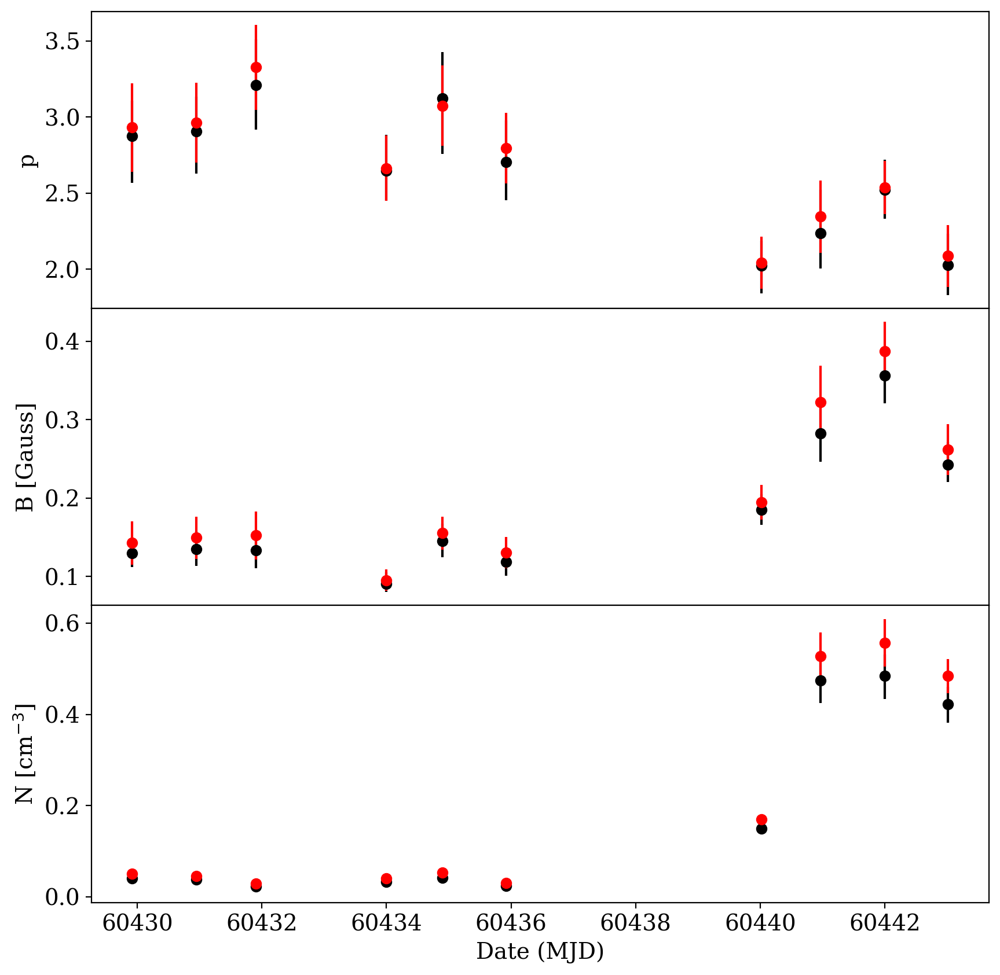

In [14]:

fig, axs = plt.subplots(3,1, figsize = (10,10), sharex = True)
fig.subplots_adjust(hspace=0.00)
axs[0].errorbar(MJD_swift_xrt, P_par_value_mcmc, yerr = [P_lower_err_mcmc, P_upper_err_mcmc], fmt = 'o', color= 'black')
axs[0].errorbar(MJD_swift_xrt, zp_compact_val, yerr = zp_compact_val_err, fmt = 'o', color = 'red')
axs[0].set_ylabel(r'p')
#axs[0].legend(loc = 'upper right')
axs[1].errorbar(MJD_swift_xrt, B_par_value_mcmc, yerr = [B_lower_err_mcmc, B_upper_err_mcmc], fmt = 'o', color= 'black')
axs[1].errorbar(MJD_swift_xrt, zB_compact_val, yerr = zB_compact_val_err, fmt = 'o', color = 'red')
axs[1].set_ylabel(r'B [Gauss]')
#axs[1].legend(loc = 'upper left')
axs[2].errorbar(MJD_swift_xrt, N_par_value_mcmc, yerr = [N_lower_err_mcmc, N_upper_err_mcmc], fmt = 'o', color= 'black')
axs[2].errorbar(MJD_swift_xrt, zN_compact_val, yerr = zN_compact_val_err, fmt = 'o', color = 'red')
axs[2].set_ylabel(r'N [cm$^{-3}$]')
#axs[2].legend(loc = 'upper left')
axs[2].set_xlabel(r'Date (MJD)')
plt.savefig('two_zone_pl_expcut_param_fixed_gamma_cut_comparison.png')


## SED of the first and the last day of IXPE observation window

/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.0419507444756982  mcmc bounds: [0.01, 0.4824335614705293]
par: B  best fit value:  0.12873442241364907  mcmc bounds: [0.01, 0.5]
par: P  best fit value:  2.8650982441509094  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 513.27 seconds


/home/varun-kelkar/anaconda3/envs/jetset/lib/python3.10/site-packages/jetset/model_manager.py:158: UserWarning: no cosmology defined, using FlatLambdaCDM(name="Planck13", H0=67.77 km / (Mpc s), Om0=0.30712, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.048252)
  warnings.warn(m)


===> setting C threads to 8
===> function already jitted
===> setting C threads to 8
===> function already jitted
====> simplex
====> migrad
====> simplex
====> migrad
par: N  best fit value:  0.4288138414956578  mcmc bounds: [0.01, 0.5]
par: B  best fit value:  0.24350535538181017  mcmc bounds: [0.01, 0.5]
par: P  best fit value:  2.04832952050157  mcmc bounds: [1.5, 4.2]
===> setting C threads to 8
===> function already jitted
mcmc run starting



  0%|          | 0/200 [00:00<?, ?it/s]

mcmc run done, with 1 threads took 519.44 seconds


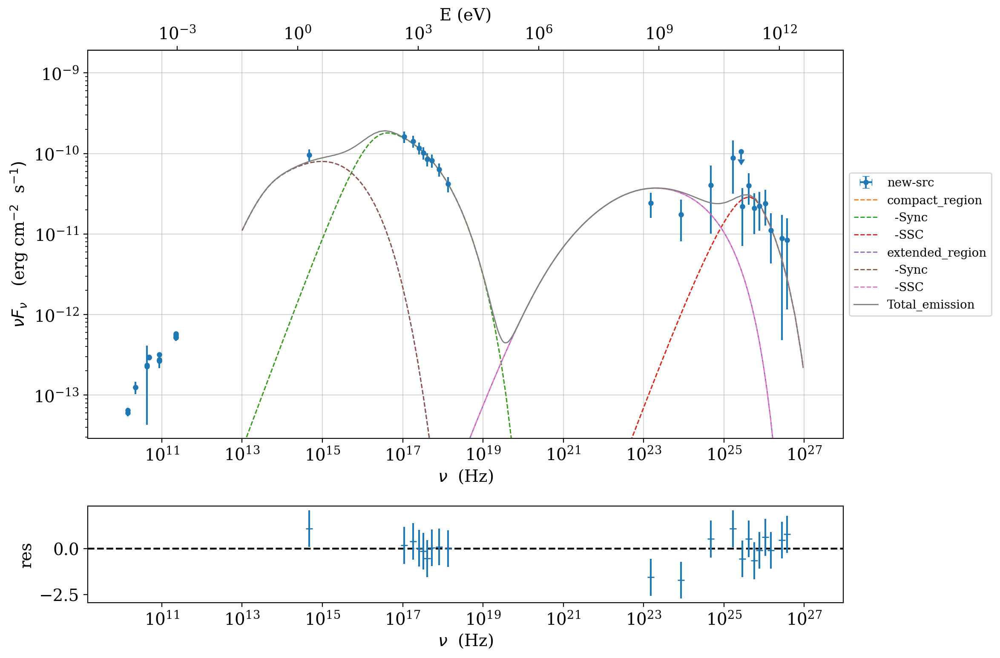

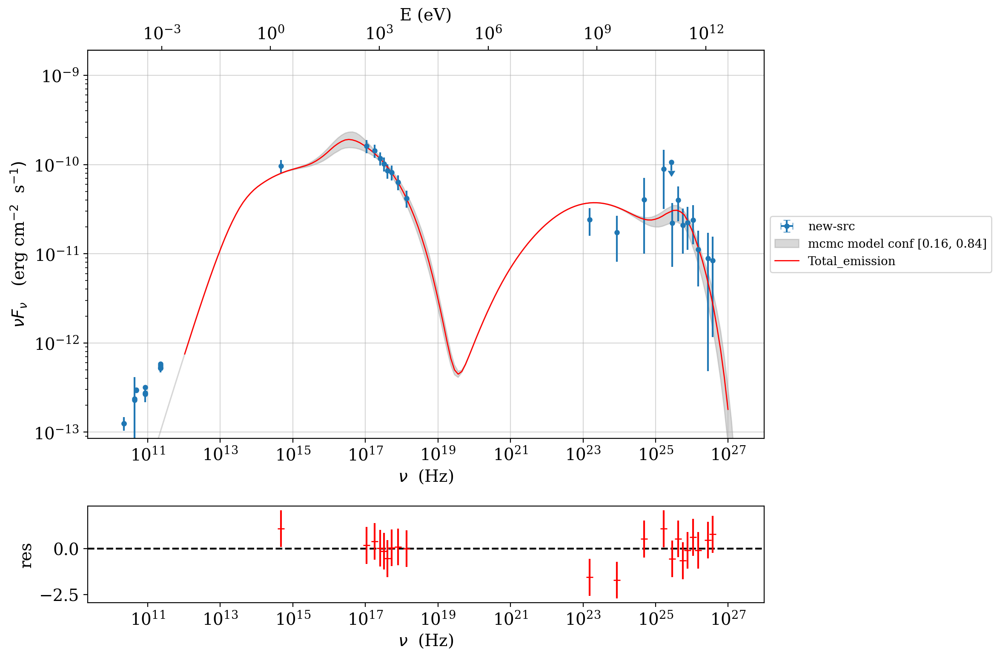

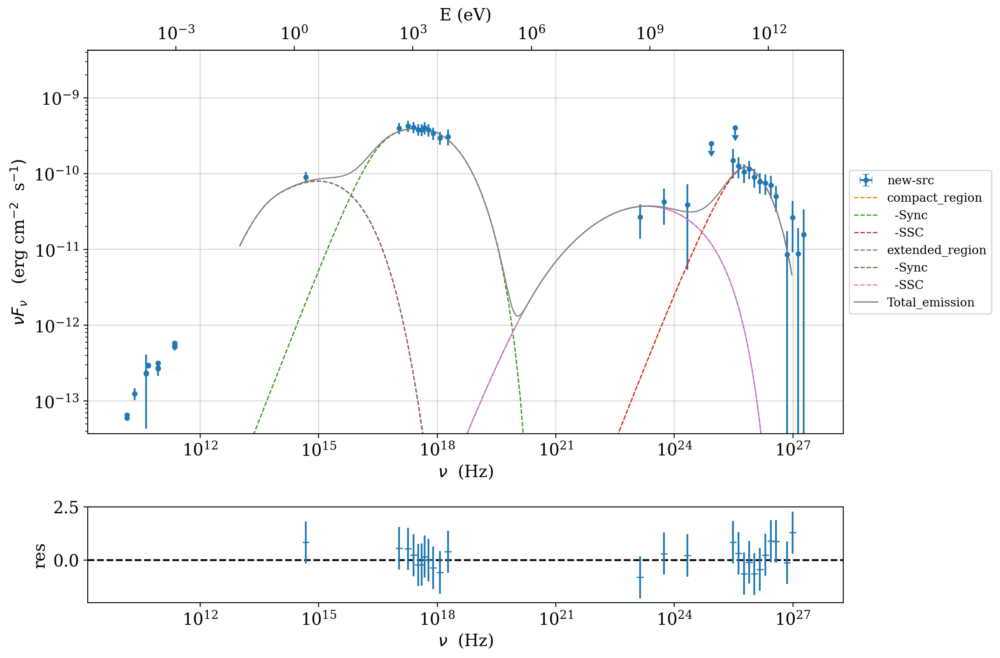

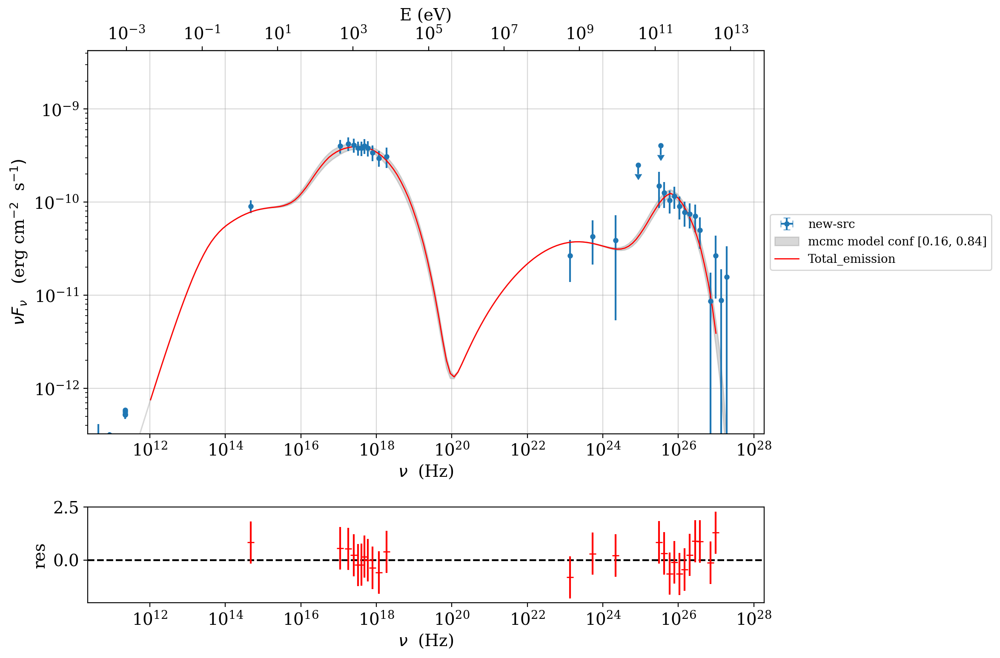

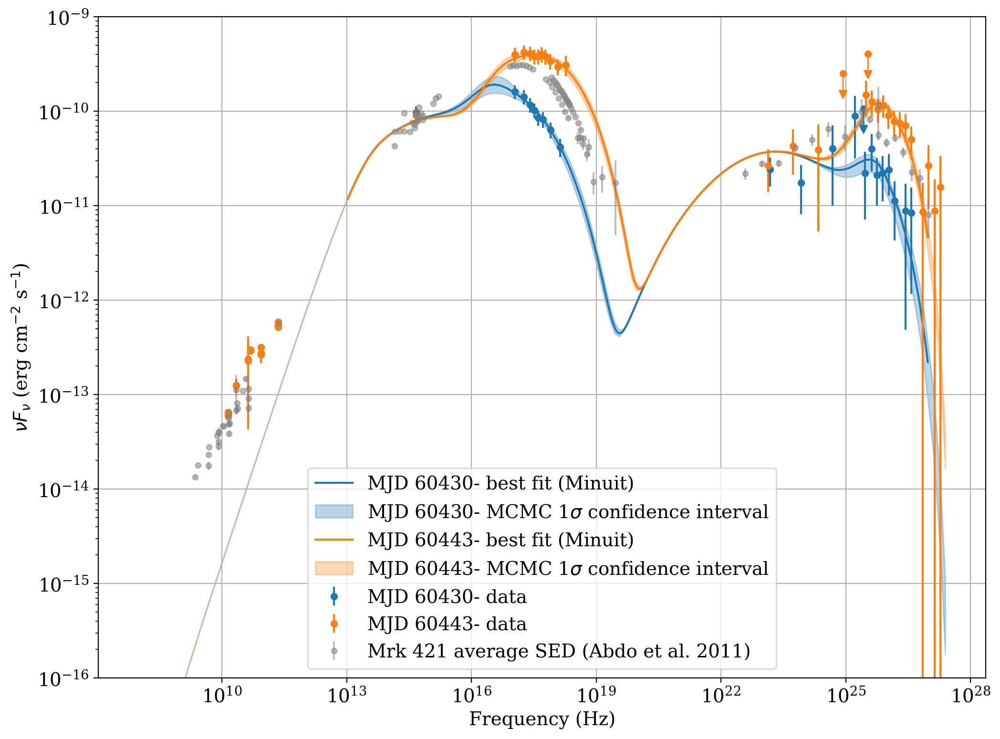

In [16]:
file_path = '/../../media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/Modelling/'
all_txt_files = [f for f in os.listdir(file_path) if f.endswith('.txt')]
zR_compact = np.array([7.65444928e+15, 2.61209673e+15])
import matplotlib.cm as cm

colors = cm.tab10.colors  # 10 distinct colors from matplotlib
def run_fit_mcmc_and_plot(f_name, R_compact_val):
    file = os.path.join(file_path, f_name)
    d = np.genfromtxt(file, delimiter=',')
    index_above_radio = (d[:,0] > 5e12)
    d[index_above_radio, 3] = 0.15 * d[index_above_radio, 2] + d[index_above_radio, 3]

    data = Data(n_rows=d.shape[0])
    data.set_field('x', d[:,0])
    data.set_field('y', d[:,2])
    data.set_field('dy', value=d[:,3])
    data.set_field('UL', value=d[:,3] < 0.)
    data.set_meta_data('z', 0.03)
    sed_data = ObsData(data_table=data)

    Total_emission = FitModel(nu_size=500, name='Total_emission')

    jet_extended_lsb = Jet(name='extended_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut)
    jet_extended_lsb.set_gamma_grid_size(400)
    jet_extended_lsb.set_N_from_nuFnu(nuFnu_obs=9.55E-11, nu_obs=4.67E14)

    jet_core_lsb = Jet(name='compact_region', emitters_type='electrons', emitters_distribution=n_e_pl_expcut_comp)
    jet_core_lsb.set_gamma_grid_size(400)

    Total_emission.add_component(jet_core_lsb)
    Total_emission.add_component(jet_extended_lsb)
    Total_emission.composite_expr = 'extended_region+compact_region'

    # Freeze extended region parameters (same as your original code)
    Total_emission.extended_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_extended_lsb, 'beam_obj')
    Total_emission.extended_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_extended_lsb, 'z_cosm')
    Total_emission.extended_region.parameters.R.val = 1.5e16
    Total_emission.freeze(jet_extended_lsb, 'R')
    Total_emission.extended_region.parameters.gmin.val = 2e3
    Total_emission.freeze(jet_extended_lsb, 'gmin')
    Total_emission.extended_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_extended_lsb, 'gmax')
    Total_emission.extended_region.parameters.p.val = 2
    Total_emission.freeze(jet_extended_lsb, 'p')
    Total_emission.extended_region.parameters.B.val = 0.055
    Total_emission.freeze(jet_extended_lsb, 'B')
    Total_emission.extended_region.parameters.N.val = 1.4
    Total_emission.freeze(jet_extended_lsb, 'N')
    Total_emission.extended_region.parameters.gamma_CUT.val = 1.6e4
    Total_emission.freeze(jet_extended_lsb, 'gamma_CUT')

    Total_emission.extended_region.nu_size = 200
    Total_emission.extended_region.IC_nu_size = 200

    # Freeze compact region fixed parameters and free fit parameters
    Total_emission.compact_region.parameters.beam_obj.val = 25
    Total_emission.freeze(jet_core_lsb, 'beam_obj')
    Total_emission.compact_region.parameters.z_cosm.val = 0.031
    Total_emission.freeze(jet_core_lsb, 'z_cosm')
    Total_emission.compact_region.parameters.R.val = R_compact_val
    Total_emission.freeze(jet_core_lsb, 'R')
    Total_emission.compact_region.parameters.gmin.val = 3e4
    Total_emission.freeze(jet_core_lsb, 'gmin')
    Total_emission.compact_region.parameters.GAMMA_cut.val = 1.45e5
    Total_emission.freeze(jet_core_lsb, 'GAMMA_cut')
    Total_emission.compact_region.parameters.gmax.val = 1e6
    Total_emission.freeze(jet_core_lsb, 'gmax')

    # Free parameters to fit
    Total_emission.compact_region.parameters.B.val = 0.034
    Total_emission.compact_region.parameters.N.val = 0.024
    Total_emission.compact_region.parameters.P.fit_range = [1.5, 4.2]
    Total_emission.compact_region.parameters.B.fit_range = [0.01, 0.5]
    Total_emission.compact_region.parameters.N.fit_range = [0.01, 0.5]

    Total_emission.compact_region.set_IC_nu_size = 200
    Total_emission.compact_region.set_nu_size = 200

    model_minimizer_minuit = ModelMinimizer('minuit')
    best_fit = model_minimizer_minuit.fit(Total_emission, sed_data, 1e13, 1e27, fitname=f'SSC-best-fit-lsb', repeat=2, silent=True, use_UL=False)

    Total_emission.set_nu_grid(1e8, 1e28, 200)
    plot = Total_emission.plot_model(sed_data=sed_data)

    mcmc = McmcSampler(model_minimizer_minuit)
    labels = ['N', 'B', 'P']
    model_name = 'compact_region'
    use_labels_dict = {model_name: labels}
    mcmc.set_labels(use_labels_dict=use_labels_dict)
    mcmc.set_bounds(bound=10.5, bound_rel=True)
    mcmc.run_sampler(nwalkers=20, burnin=50, steps=200, progress='notebook')
    p = mcmc.plot_model(sed_data=sed_data, fit_range=[1E12, 1E27], size=100, quantiles=[0.16, 0.84])

    return {'data': d, 'plot': plot, 'mcmc_plot': p, 'int_id': f_name.replace('.txt', '')}

# Select first and last files
selected_files = [all_txt_files[0], all_txt_files[-1]]
selected_R_compact = [zR_compact[0], zR_compact[-1]]  # Adjust if needed

results = []
for f_name, R_val in zip(selected_files, selected_R_compact):
    res = run_fit_mcmc_and_plot(f_name, R_val)
    results.append(res)

# Plot combined figure
plt.figure(figsize=(12,9))

for i, (res, label) in enumerate(zip(results, ['MJD 60430', 'MJD 60443'])):
    d = res['data']
    plot = res['plot']
    p = res['mcmc_plot']
    color = colors[i]  # pick a distinct color for each day

    is_ul = (d[:,3] < 0)
    is_det = ~is_ul

    plt.errorbar(d[is_det, 0], d[is_det, 2], yerr=d[is_det, 3],
                 fmt='o', label=f'{label}- data', markersize=4.5, color=color)

    for x_i, y_i in zip(d[is_ul, 0], d[is_ul, 2]):
        arrow_target = y_i / 2
        plt.annotate('', xy=(x_i, arrow_target), xytext=(x_i, y_i),
                     arrowprops=dict(arrowstyle='-|>', color=color, lw=1))
        plt.plot(x_i, y_i, 'o', color=color, markersize=4.5)

    best_fit_line = plot.lines_model_list[6]  # best fit total emission
    q = p.lines_model_list[0].get_paths()[0]
    vertices = q.vertices
    x_shaded = vertices[:,0]
    y_shaded = vertices[:,1]

    plt.plot(best_fit_line._x, best_fit_line._y, lw=1.5, label=f'{label}- best fit (Minuit)', color=color)
    plt.fill_between(x_shaded, y_shaded, alpha=0.3, label=f'{label}- MCMC 1$\sigma$ confidence interval', color=color)

# Plot average SED (replace with your variables)
plt.errorbar(mrk421_nu, mrk421_nuFnu, yerr=mrk421_nuFnu_err,
             fmt='o', color='gray', alpha=0.5, markersize=4,
             label='Mrk 421 average SED (Abdo et al. 2011)')

plt.ylim(1e-16, 1e-9)
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$\nu F_{\nu}$ (erg cm$^{-2}$ s$^{-1}$)')
plt.loglog()
plt.legend(loc='best')
plt.grid(True)
#plt.title('SED: First and Last Day with Best Fit and MCMC')

plt.savefig('first_last_day_sed_combined.png')


In [ ]:
import pickle

file_path_pkl = "/media/varun-kelkar/DATA1/New-folder/LMU-MSc/Thesis/SED_modelling/mcmc_sampler.pkl"
with open(file_path_pkl, 'rb') as f:
    mcmc_data = pickle.load(f)

# 2. Extract the chain 
# Note: Depending on the jetset version, you might access it via 
# mcmc_data.samples or mcmc_data.chain
samples = mcmc_data.samples 
labels = mcmc_data.labels # Getting the names of the parameters

# 3. Save as a text file with headers
header = " ".join(labels)
np.savetxt('mcmc_chains.txt', samples, header=header, fmt='%1.6e')

import getdist
from getdist import plots, MCSamples
sample = data[:,[0,1,2]]
names = ['N', 'B', 'P']
labels = ['N', 'B', 'P']
settings = {'smooth_scale_2d': 1.8, 'smooth_scale_1d': 1.8}
g_samples = MCSamples(samples=sample, names=names, labels=labels)
g = plots.get_subplot_plotter()
g.triangle_plot(g_samples, filled=True, title_limit=1, settings=settings)